# CZ1016 Introduction to Data Science
## Group Project
### YouTube Statistics - What makes a popular YouTube video?


#### Members:
- Chua Zi Heng U1922370K
- Mun Kei Wuai U1921982B
- Tan Wen Xiu  U1921771H


In this project, we aim to find out which features are important in the classification of a popular YouTube video. We define popular as having a high (likes-dislikes)/views ratio. 

We will be using datasets from **United States of America** and **Great Britain**. The following project will be split into 2 parts - separate data cleaning and classifications will be carried out for each country. Thereafter, we will compare the results derived from both datasets and perform in-depth analysis.

We have came up with 8 features that we think might be useful in the classification.

Features (for each unique video): 
1. Number of views
2. Number of likes
3. Number of dislikes
4. Number of trending days
5. Number of comments
6. Average Sentiment Score
7. Number of positive comments 
8. Number of negative comments 

We have also built a univariate decision tree for each feature, a multivariate decsion tree and a random forest to find out which form of classification will give the highest classification accuracy.

In [1]:
# Basic Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sb
sb.set() # set the default Seaborn style for graphics
import re
import string
import nltk
from wordcloud import WordCloud
from nltk import pos_tag, word_tokenize
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.tree import export_graphviz
import graphviz
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
import plotly.offline as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly import tools
# Activate inline plotting in notebook
py.init_notebook_mode(connected = False)

# 1. United States of America (US)
- Since the video statistics and comments statistics are in separate CSV files, we will import both files (USvideos & UScomments) for analysis.

In [2]:
#import dataset and remove bad lines
USvideos = pd.read_csv('USvideos.csv', error_bad_lines=False)
USvideos

b'Skipping line 2401: expected 11 fields, saw 21\nSkipping line 2800: expected 11 fields, saw 21\nSkipping line 5297: expected 11 fields, saw 12\nSkipping line 5299: expected 11 fields, saw 12\nSkipping line 5300: expected 11 fields, saw 12\nSkipping line 5301: expected 11 fields, saw 12\n'


,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,thumbnail_link,date
0,XpVt6Z1Gjjo,1 YEAR OF VLOGGING -- HOW LOGAN PAUL CHANGED Y...,Logan Paul Vlogs,24,logan paul vlog|logan paul|logan|paul|olympics...,4394029,320053,5931,46245,https://i.ytimg.com/vi/XpVt6Z1Gjjo/default.jpg,13.09
1,K4wEI5zhHB0,iPhone X — Introducing iPhone X — Apple,Apple,28,Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lig...,7860119,185853,26679,0,https://i.ytimg.com/vi/K4wEI5zhHB0/default.jpg,13.09
2,cLdxuaxaQwc,My Response,PewDiePie,22,[none],5845909,576597,39774,170708,https://i.ytimg.com/vi/cLdxuaxaQwc/default.jpg,13.09
3,WYYvHb03Eog,Apple iPhone X first look,The Verge,28,apple iphone x hands on|Apple iPhone X|iPhone ...,2642103,24975,4542,12829,https://i.ytimg.com/vi/WYYvHb03Eog/default.jpg,13.09
4,sjlHnJvXdQs,iPhone X (parody),jacksfilms,23,jacksfilms|parody|parodies|iphone|iphone x|iph...,1168130,96666,568,6666,https://i.ytimg.com/vi/sjlHnJvXdQs/default.jpg,13.09
...,...,...,...,...,...,...,...,...,...,...,...
7987,xlu6i6lT_vk,How Do MASSIVE Sinkholes Form?,Life Noggin,27,sinkhole|how do sinkholes form|sinkhole in wat...,440393,14362,390,1575,https://i.ytimg.com/vi/xlu6i6lT_vk/default.jpg,22.10
7988,qRoVlH1OcI4,Trump slams Clinton for defending NFL anthem p...,Business Insider,25,Business Insider|Donald Trump|Hillary Clinton|...,55762,1265,760,1873,https://i.ytimg.com/vi/qRoVlH1OcI4/default.jpg,22.10
7989,EoejGgUNmVU,LP - Lost On You (A Night at The McKittrick Ho...,LP,10,LP|Death Valley|Other People|Lost On You|The M...,142908,7088,68,437,https://i.ytimg.com/vi/EoejGgUNmVU/default.jpg,22.10
7990,MT1CMTI0EVw,Tré Melvin @ #YouTubeBlack FanFest Washington ...,YouTube FanFest,24,YouTube FanFest|#YTFF|Washington DC|USA|YTFF|#...,24532,2148,77,0,https://i.ytimg.com/vi/MT1CMTI0EVw/default.jpg,22.10


In [3]:
#import dataset and remove bad lines
UScomments = pd.read_csv('UScomments.csv', error_bad_lines=False)
UScomments

b'Skipping line 41589: expected 4 fields, saw 11\nSkipping line 51628: expected 4 fields, saw 7\nSkipping line 114465: expected 4 fields, saw 5\n'
b'Skipping line 142496: expected 4 fields, saw 8\nSkipping line 189732: expected 4 fields, saw 6\nSkipping line 245218: expected 4 fields, saw 7\n'
b'Skipping line 388430: expected 4 fields, saw 5\n'
C:\Users\User\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning:

Columns (2,3) have mixed types. Specify dtype option on import or set low_memory=False.



,video_id,comment_text,likes,replies
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼️‼️‼️,4,0
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0
4,XpVt6Z1Gjjo,trending 😉,3,0
...,...,...,...,...
691395,EoejGgUNmVU,Лучшая,1,0
691396,EoejGgUNmVU,qu'est ce que j'aimerais que tu viennes à Roan...,0,0
691397,EoejGgUNmVU,Ven a mexico! 😍 te amo LP,0,0
691398,EoejGgUNmVU,Islığı yeter...,0,0


# Data Cleaning

In [4]:
#del thumbnail column as it is redundant for classification
USvideos = USvideos.drop(columns='thumbnail_link')
USvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date
0,XpVt6Z1Gjjo,1 YEAR OF VLOGGING -- HOW LOGAN PAUL CHANGED Y...,Logan Paul Vlogs,24,logan paul vlog|logan paul|logan|paul|olympics...,4394029,320053,5931,46245,13.09
1,K4wEI5zhHB0,iPhone X — Introducing iPhone X — Apple,Apple,28,Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lig...,7860119,185853,26679,0,13.09
2,cLdxuaxaQwc,My Response,PewDiePie,22,[none],5845909,576597,39774,170708,13.09
3,WYYvHb03Eog,Apple iPhone X first look,The Verge,28,apple iphone x hands on|Apple iPhone X|iPhone ...,2642103,24975,4542,12829,13.09
4,sjlHnJvXdQs,iPhone X (parody),jacksfilms,23,jacksfilms|parody|parodies|iphone|iphone x|iph...,1168130,96666,568,6666,13.09


In [5]:
#sort videos from most views to least views for visualisation 
USvideos.sort_values(by=['views'], inplace=True, ascending=False)
USvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date
1907,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09
1694,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,38013692,1950475,75294,713293,21.09
177,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09
7135,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10
6917,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,32512343,968719,180427,332396,17.10


It can be seen from above that there are duplicates in the videos. For example, BTS (방탄소년단) 'DNA' Official MV appeared more than 1 time. Duplicates happen when the video is trending for more than 1 day. Thus, with this inference, we can use this data to derive the number of days a video has been trending for.

In [6]:
USvideos.describe()

,category_id,views,likes,dislikes,comment_total,date
count,7992.000000,7.992000e+03,7.992000e+03,7992.000000,7992.000000,7992.000000
mean,20.217718,9.390269e+05,3.449193e+04,1781.625000,4608.489740,16.094249
std,7.415525,2.148263e+06,9.136160e+04,10822.103125,20252.758016,7.677674
min,1.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,1.100000
25%,17.000000,9.686375e+04,1.907500e+03,67.000000,286.000000,11.100000
50%,23.000000,3.086115e+05,8.652500e+03,272.500000,1085.500000,16.595000
75%,25.000000,9.588758e+05,3.021350e+04,1013.000000,3462.750000,21.100000
max,43.000000,4.150067e+07,2.010366e+06,318404.000000,736179.000000,30.090000


In [7]:
#add new DataFrame for number of duplicates to show the number of duplicates
duplicates = USvideos['video_id'].value_counts().rename_axis('video_id').reset_index(name='trending days')
duplicates

,video_id,trending days
0,Hlt3rA-oDao,8
1,Oo0NJsr5m4I,8
2,LunHybOKIjU,8
3,UXdbCReBTR8,7
4,3QWQ4gN3j4E,7
...,...,...
2359,S9VIKOuZcds,1
2360,CWvmvCewANI,1
2361,PHdI9Nk7WM4,1
2362,4AsSp0AhlBc,1


In [8]:
#remove duplicates
USvideos.drop_duplicates(subset ="video_id", keep = 'first', inplace = True)
USvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date
1907,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09
177,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09
7135,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10
1995,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09
6268,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10


In [9]:
#show that there are some videos with 0 views
print(len(USvideos[USvideos['views'] == 0]))

2


In [10]:
#show the percentage of videos with 0 views is very small so its is okay to remove
print((len(USvideos[USvideos['views']==0])) / len(USvideos*100), '%', sep='')

0.0008460236886632825%


In [11]:
#remove rows with 0 views
indexNames = USvideos[USvideos['views'] == 0].index
USvideos.drop(indexNames , inplace=True)

In [12]:
#merging 2 dataframes together, adding number of trending days
USvideos = pd.merge(USvideos, duplicates, on = 'video_id')
USvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09,4
1,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09,1
2,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10,8
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09,7
4,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10,5


In [13]:
# take a look at dataset again: 2634 videos change to 2632 videos after removal of 2 videos with 0 views
USvideos.describe()

,category_id,views,likes,dislikes,comment_total,date,trending days
count,2362.000000,2.362000e+03,2.362000e+03,2362.000000,2362.000000,2362.000000,2362.000000
mean,20.422100,9.324774e+05,3.181792e+04,1520.596952,3934.287045,16.643446,3.381456
std,7.233744,2.294157e+06,9.207930e+04,9389.811402,19587.859020,7.742359,1.574805
min,1.000000,4.680000e+02,0.000000e+00,0.000000,0.000000,1.100000,1.000000
25%,17.000000,8.369125e+04,1.316500e+03,53.000000,201.000000,11.100000,2.000000
50%,24.000000,2.884070e+05,7.503000e+03,228.000000,835.500000,18.090000,3.000000
75%,25.000000,9.208772e+05,2.538100e+04,920.500000,2914.250000,22.100000,5.000000
max,43.000000,4.150067e+07,2.010366e+06,318404.000000,736179.000000,30.090000,8.000000


In [14]:
# it can be seen that there are some null objects under comment_text
UScomments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 691400 entries, 0 to 691399
Data columns (total 4 columns):
video_id        691400 non-null object
comment_text    691375 non-null object
likes           691400 non-null object
replies         691400 non-null object
dtypes: object(4)
memory usage: 21.1+ MB


In [15]:
UScomments.describe()

,video_id,comment_text,likes,replies
count,691400,691375,691400,691400
unique,2266,434076,1284,479
top,4X6a3G_0HjY,Lol,0,0
freq,800,310,456894,525730


In [16]:
# take a look at rows which comments are null
print(UScomments[UScomments['comment_text'].isnull()])

           video_id comment_text likes replies
76134   7YAAyUFL1GQ          NaN     0       0
215218  KUCHBBCj77I          NaN     0       0
234226  KUCHBBCj77I          NaN     0       0
306019  s3Hk_lDw5yo          NaN     0       0
332811  zrOHeEA14kQ          NaN     0       0
357506  zmg9tVaMVd4          NaN     0       0
379582  zmg9tVaMVd4          NaN     0       0
403013  9eea7_7OBZQ          NaN     0       0
425238  6l5P7jHUcjI          NaN     0       0
436348  IQisUbBljW0          NaN     0       0
444629  6l5P7jHUcjI          NaN     0       0
462907  6l5P7jHUcjI          NaN     0       0
467339  rJTkHGXMdb0          NaN     0       0
483367  6l5P7jHUcjI          NaN     0       0
516431  941Bl3oxk8Y          NaN     0       0
543886  8I1B4n_8Cto          NaN     0       0
545600  CX4KuIBmnjI          NaN     0       0
558328  8I1B4n_8Cto          NaN     0       0
560121  ZczwzVhai9E          NaN     0       0
563768  CX4KuIBmnjI          NaN     0       0
573796  Iv2lW

In [17]:
# number of rows with null comments
len(UScomments[UScomments['comment_text'].isnull()])

25

In [18]:
# get the row index which comment_text are null
indexNames = UScomments[UScomments['comment_text'].isnull()].index
indexNames

Int64Index([ 76134, 215218, 234226, 306019, 332811, 357506, 379582, 403013,
            425238, 436348, 444629, 462907, 467339, 483367, 516431, 543886,
            545600, 558328, 560121, 563768, 573796, 584612, 605039, 615625,
            637282],
           dtype='int64')

In [19]:
#drop the rows with null comments
UScomments.drop(indexNames, inplace=True)

In [20]:
# confirm that the 25 rows are dropped
UScomments.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 691375 entries, 0 to 691399
Data columns (total 4 columns):
video_id        691375 non-null object
comment_text    691375 non-null object
likes           691375 non-null object
replies         691375 non-null object
dtypes: object(4)
memory usage: 26.4+ MB


In [21]:
# find the number of rows in USvideos whose video_id are NOT in UScomments
len(USvideos[~USvideos.video_id.isin(UScomments.video_id)])

97

In [22]:
# find the row index of rows in USvideos whose video_id are NOT in UScomments
rowIndex1 = USvideos[~USvideos.video_id.isin(UScomments.video_id)].index
print(rowIndex1)

Int64Index([   5,   13,   60,   71,   89,  141,  219,  382,  520,  572,  573,
             636,  644,  645,  661,  685,  739,  758,  762,  786,  802,  867,
             898,  926, 1017, 1224, 1225, 1289, 1300, 1380, 1429, 1493, 1499,
            1551, 1560, 1623, 1630, 1674, 1675, 1883, 1889, 1900, 1906, 1915,
            1950, 1976, 1988, 2008, 2009, 2016, 2026, 2027, 2059, 2087, 2112,
            2123, 2127, 2134, 2149, 2179, 2190, 2194, 2205, 2207, 2208, 2216,
            2224, 2239, 2245, 2247, 2265, 2267, 2274, 2281, 2284, 2298, 2319,
            2320, 2322, 2331, 2332, 2333, 2335, 2336, 2340, 2341, 2342, 2343,
            2346, 2349, 2350, 2355, 2356, 2357, 2359, 2360, 2361],
           dtype='int64')


In [23]:
# drop the rows in UScomments whose video_id are NOT in USvideos
USvideos.drop(rowIndex1, inplace=True)
USvideos

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09,4
1,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09,1
2,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10,8
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09,7
4,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10,5
...,...,...,...,...,...,...,...,...,...,...,...
2351,7Ag2oDIeLvo,1976 Buick Skyhawk Commercial,OsbornTramain,22,1976 Buick Skyhawk Commercial|1976|Buick|Skyha...,1749,15,0,9,14.09,2
2352,I_JtJHJ4384,Two Minutes with Mitch Henck: Bicyclists final...,madison.com,25,madison.com,1731,0,4,4,23.09,1
2353,FyN_fIc0-VY,Activist Tamika Mallory kicked off flight over...,UseFul Video,20,Tamika Mallory|Activist|off flight|dispute,1597,12,11,42,20.10,2
2354,mShBE_wHAk8,TARDIS - First Working Video,Adam Sifounakis,22,[none],1341,1,0,3,26.09,1


In [24]:
# take a look at dataset again after 97 videos were dropped
USvideos.describe()

,category_id,views,likes,dislikes,comment_total,date,trending days
count,2265.000000,2.265000e+03,2.265000e+03,2265.000000,2265.000000,2265.000000,2265.000000
mean,20.368212,9.414101e+05,3.284333e+04,1519.804857,4100.738631,16.658971,3.409272
std,7.257654,2.282997e+06,9.353149e+04,9456.118468,19986.122115,7.761970,1.566207
min,1.000000,1.097000e+03,0.000000e+00,0.000000,0.000000,1.100000,1.000000
25%,17.000000,9.398400e+04,1.606000e+03,59.000000,256.000000,11.100000,2.000000
50%,23.000000,3.015530e+05,8.144000e+03,243.000000,934.000000,18.090000,3.000000
75%,25.000000,9.436820e+05,2.658600e+04,949.000000,3070.000000,22.100000,5.000000
max,43.000000,4.150067e+07,2.010366e+06,318404.000000,736179.000000,30.090000,8.000000


In [25]:
#take a look at UScomments dataset
UScomments.describe()

,video_id,comment_text,likes,replies
count,691375,691375,691375,691375
unique,2266,434076,1284,479
top,4X6a3G_0HjY,Lol,0,0
freq,800,310,456870,525706


In [26]:
# find the number of rows in UScomments whose video_id are NOT in USvideos
len(UScomments[~UScomments.video_id.isin(USvideos.video_id)])

88

In [27]:
# find the row index of rows in UScomments whose video_id are NOT in USvideos
rowIndex2 = UScomments[~UScomments.video_id.isin(USvideos.video_id)].index
print(rowIndex2)

Int64Index([423008, 423009, 423010, 423011, 423012, 423013, 423014, 423015,
            423016, 423017, 423018, 423019, 423020, 423021, 423022, 423023,
            423024, 423025, 423026, 423027, 423028, 423029, 423030, 423031,
            423032, 423033, 423034, 423035, 423036, 423037, 423038, 423039,
            423040, 423041, 423042, 423043, 423044, 423045, 423046, 423047,
            423048, 423049, 423050, 423051, 423052, 423053, 423054, 423055,
            423056, 423057, 423058, 423059, 423060, 423061, 423062, 423063,
            423064, 423065, 423066, 423067, 423068, 423069, 423070, 423071,
            423072, 423073, 423074, 423075, 423076, 423077, 423078, 423079,
            423080, 423081, 423082, 423083, 423084, 423085, 423086, 423087,
            423088, 423089, 423090, 423091, 423092, 423093, 423094, 423095],
           dtype='int64')


In [28]:
# drop the rows in UScomments whose video_id are NOT in USvideos
UScomments.drop(rowIndex2, inplace=True)
UScomments

,video_id,comment_text,likes,replies
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼️‼️‼️,4,0
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0
4,XpVt6Z1Gjjo,trending 😉,3,0
...,...,...,...,...
691395,EoejGgUNmVU,Лучшая,1,0
691396,EoejGgUNmVU,qu'est ce que j'aimerais que tu viennes à Roan...,0,0
691397,EoejGgUNmVU,Ven a mexico! 😍 te amo LP,0,0
691398,EoejGgUNmVU,Islığı yeter...,0,0


In [29]:
# take a look at dataset again after 888 videos were dropped
UScomments.describe()

,video_id,comment_text,likes,replies
count,691287,691287,691287,691287
unique,2265,433992,1284,479
top,4X6a3G_0HjY,Lol,0,0
freq,800,310,456830,525642


# Spearman Rank Correlation
- uses ranking between likes, views and popularity, popularity2 
- choose a y-variable that is appropriate (ie. is normalised, which means a low spearman correlation coefficient)

In [30]:
#create column for ranking of views 
USvideos['views_rank'] = USvideos['views'].rank(ascending = False)
USvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days,views_rank
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09,4,1.0
1,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09,1,2.0
2,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10,8,3.0
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09,7,4.0
4,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10,5,5.0


In [31]:
#create column for ranking of likes
USvideos['likes_rank'] = USvideos['views'].rank(ascending = False)
USvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days,views_rank,likes_rank
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09,4,1.0,1.0
1,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09,1,2.0,2.0
2,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10,8,3.0,3.0
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09,7,4.0,4.0
4,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10,5,5.0,5.0


In [32]:
#set y as likes/views
#sort based on likes over views 
USvideos['popularity'] = USvideos.apply(lambda row: 1000*(row.likes/row.views), axis = 1)
USvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days,views_rank,likes_rank,popularity
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09,4,1.0,1.0,48.441770
1,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09,1,2.0,2.0,39.414789
2,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10,8,3.0,3.0,29.611172
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09,7,4.0,4.0,17.993806
4,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10,5,5.0,5.0,22.611834


In [33]:
#set y as (likes-dislikes)/views
#sort based on (likes-dislikes)/views
USvideos['popularity2'] = USvideos.apply(lambda row: 1000*(row.likes-row.dislikes)/row.views, axis = 1)

USvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days,views_rank,likes_rank,popularity,popularity2
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09,4,1.0,1.0,48.441770,46.560451
1,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09,1,2.0,2.0,39.414789,38.642589
2,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10,8,3.0,3.0,29.611172,24.058260
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09,7,4.0,4.0,17.993806,16.641002
4,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10,5,5.0,5.0,22.611834,21.817233


In [34]:
#create column for ranking of popularity 
USvideos['popularity_rank'] = USvideos['popularity'].rank(ascending = False)
USvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days,views_rank,likes_rank,popularity,popularity2,popularity_rank
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09,4,1.0,1.0,48.441770,46.560451,532.0
1,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09,1,2.0,2.0,39.414789,38.642589,763.0
2,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10,8,3.0,3.0,29.611172,24.058260,1085.0
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09,7,4.0,4.0,17.993806,16.641002,1460.0
4,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10,5,5.0,5.0,22.611834,21.817233,1308.0


In [35]:
#create column for ranking of popularity2
USvideos['popularity2_rank'] = USvideos['popularity2'].rank(ascending = False)
USvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days,views_rank,likes_rank,popularity,popularity2,popularity_rank,popularity2_rank
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09,4,1.0,1.0,48.441770,46.560451,532.0,554.0
1,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09,1,2.0,2.0,39.414789,38.642589,763.0,749.0
2,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10,8,3.0,3.0,29.611172,24.058260,1085.0,1226.0
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09,7,4.0,4.0,17.993806,16.641002,1460.0,1456.0
4,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10,5,5.0,5.0,22.611834,21.817233,1308.0,1285.0


In [36]:
from scipy.stats import spearmanr
coef, p = spearmanr(USvideos["likes_rank"], USvideos["views_rank"])
print('Spearmans correlation coefficient: %.3f' % coef)

Spearmans correlation coefficient: 1.000


This means that the ranking of videos with the most number of views would correspond with that of the most number of likes. The rankings of these 2 features are essentially equivalent. Hence, the spearman correlation coefficient of "views" or "likes", with other features would be the same.

In [37]:
from scipy.stats import spearmanr
coef, p = spearmanr(USvideos["popularity_rank"], USvideos["views_rank"])
print('Spearmans correlation coefficient: %.3f' % coef)

Spearmans correlation coefficient: 0.156


**popularity = likes/views**. This suggests a higher correlation between the ranks of popularity and views, rather than popularity2 and views as seen below, possibily because we did not take into account the number of dislikes of the video.

In [38]:
from scipy.stats import spearmanr
coef, p = spearmanr(USvideos["popularity2_rank"], USvideos["views_rank"])
print('Spearmans correlation coefficient: %.3f' % coef)

Spearmans correlation coefficient: 0.154


**popularity2 = (likes-dislikes)/views**. Lower correlation shows that popularity2 is not highly associated to the number of views (or likes) that the video receives. Hence, the response is considered to be normalised.

In [2]:
#sort videos from most views to least views
USvideos.sort_values(by=['views'], inplace=True, ascending=False)
USvideos.head()

NameError: name 'USvideos' is not defined

The above is sorted by highest to lowest views. Looking at popularity2_rank, it is noted that the highest views does not mean highest popularity2_rank. Hence, we will make use of popularity2 as the response variable for this project. 

# Basic Data Visualisation

In [40]:
US_pop = go.Box(x = USvideos['popularity2'], showlegend = False, name = "popularity2")
py.iplot([US_pop])

In [41]:
# look at overall dataset
USvideos.describe()

,category_id,views,likes,dislikes,comment_total,date,trending days,views_rank,likes_rank,popularity,popularity2,popularity_rank,popularity2_rank
count,2265.000000,2.265000e+03,2.265000e+03,2265.000000,2265.000000,2265.000000,2265.000000,2265.0000,2265.0000,2265.000000,2265.000000,2265.000000,2265.000000
mean,20.368212,9.414101e+05,3.284333e+04,1519.804857,4100.738631,16.658971,3.409272,1133.0000,1133.0000,32.717772,31.304925,1133.000000,1133.000000
std,7.257654,2.282997e+06,9.353149e+04,9456.118468,19986.122115,7.761970,1.566207,653.9935,653.9935,26.697753,27.022130,653.993496,653.993498
min,1.000000,1.097000e+03,0.000000e+00,0.000000,0.000000,1.100000,1.000000,1.0000,1.0000,0.000000,-56.451043,1.000000,1.000000
25%,17.000000,9.398400e+04,1.606000e+03,59.000000,256.000000,11.100000,2.000000,567.0000,567.0000,11.303426,9.852217,567.000000,567.000000
50%,23.000000,3.015530e+05,8.144000e+03,243.000000,934.000000,18.090000,3.000000,1133.0000,1133.0000,28.627121,27.027651,1133.000000,1133.000000
75%,25.000000,9.436820e+05,2.658600e+04,949.000000,3070.000000,22.100000,5.000000,1699.0000,1699.0000,46.953816,45.795299,1699.000000,1699.000000
max,43.000000,4.150067e+07,2.010366e+06,318404.000000,736179.000000,30.090000,8.000000,2265.0000,2265.0000,188.312438,187.097966,2262.500000,2265.000000


In [42]:
# 1 point is very far away from the dataset, we will choose to separate them from the classification
anomaly1 = USvideos[USvideos['popularity2']==USvideos['popularity2'].min()]
USvideos = USvideos.loc[USvideos['popularity2']!=USvideos['popularity2'].min()]
USvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days,views_rank,likes_rank,popularity,popularity2,popularity_rank,popularity2_rank
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09,4,1.0,1.0,48.441770,46.560451,532.0,554.0
1,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09,1,2.0,2.0,39.414789,38.642589,763.0,749.0
2,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10,8,3.0,3.0,29.611172,24.058260,1085.0,1226.0
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09,7,4.0,4.0,17.993806,16.641002,1460.0,1456.0
4,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10,5,5.0,5.0,22.611834,21.817233,1308.0,1285.0


In [43]:
# look at overall dataset
USvideos.describe()

,category_id,views,likes,dislikes,comment_total,date,trending days,views_rank,likes_rank,popularity,popularity2,popularity_rank,popularity2_rank
count,2264.000000,2.264000e+03,2.264000e+03,2264.000000,2264.000000,2264.000000,2264.000000,2264.000000,2264.000000,2264.000000,2264.000000,2264.000000,2264.000000
mean,20.366166,9.416634e+05,3.285627e+04,1509.740283,4099.693905,16.659664,3.409452,1133.048145,1133.048145,32.727985,31.343687,1132.719965,1132.500000
std,7.258604,2.283470e+06,9.355013e+04,9446.065508,19990.475614,7.763614,1.566530,654.133966,654.133966,26.699225,26.965045,654.002135,653.704823
min,1.000000,1.097000e+03,0.000000e+00,0.000000,0.000000,1.100000,1.000000,1.000000,1.000000,0.000000,-37.672781,1.000000,1.000000
25%,17.000000,9.372825e+04,1.605250e+03,59.000000,255.750000,11.100000,2.000000,566.750000,566.750000,11.306296,9.857535,566.750000,566.750000
50%,23.000000,3.015245e+05,8.148500e+03,242.000000,932.000000,18.090000,3.000000,1133.500000,1133.500000,28.642223,27.058816,1132.500000,1132.500000
75%,25.000000,9.446730e+05,2.660425e+04,947.500000,3067.750000,22.100000,5.000000,1699.250000,1699.250000,46.972324,45.796877,1698.250000,1698.250000
max,43.000000,4.150067e+07,2.010366e+06,318404.000000,736179.000000,30.090000,8.000000,2265.000000,2265.000000,188.312438,187.097966,2262.500000,2264.000000


In [44]:
#boxplot for popularity2 after removing 1 anomaly
US_pop = go.Box(x = USvideos['popularity2'], showlegend = False, name = "popularity2")
py.iplot([US_pop])

In [45]:
#categorize the popularity2 of the videos into 4 categories according to their quartiles 
USvideos['quantile_popularity'] = pd.cut(USvideos['popularity2'], bins = 4, labels = ['low', 'very low', 'very high','high'])
USvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days,views_rank,likes_rank,popularity,popularity2,popularity_rank,popularity2_rank,quantile_popularity
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09,4,1.0,1.0,48.441770,46.560451,532.0,554.0,very low
1,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09,1,2.0,2.0,39.414789,38.642589,763.0,749.0,very low
2,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10,8,3.0,3.0,29.611172,24.058260,1085.0,1226.0,very low
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09,7,4.0,4.0,17.993806,16.641002,1460.0,1456.0,low
4,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10,5,5.0,5.0,22.611834,21.817233,1308.0,1285.0,very low


In [46]:
USvideos['quantile_popularity'].value_counts()

very low     1253
low           866
very high     129
high           16
Name: quantile_popularity, dtype: int64

In [47]:
USvideos.describe()

,category_id,views,likes,dislikes,comment_total,date,trending days,views_rank,likes_rank,popularity,popularity2,popularity_rank,popularity2_rank
count,2264.000000,2.264000e+03,2.264000e+03,2264.000000,2264.000000,2264.000000,2264.000000,2264.000000,2264.000000,2264.000000,2264.000000,2264.000000,2264.000000
mean,20.366166,9.416634e+05,3.285627e+04,1509.740283,4099.693905,16.659664,3.409452,1133.048145,1133.048145,32.727985,31.343687,1132.719965,1132.500000
std,7.258604,2.283470e+06,9.355013e+04,9446.065508,19990.475614,7.763614,1.566530,654.133966,654.133966,26.699225,26.965045,654.002135,653.704823
min,1.000000,1.097000e+03,0.000000e+00,0.000000,0.000000,1.100000,1.000000,1.000000,1.000000,0.000000,-37.672781,1.000000,1.000000
25%,17.000000,9.372825e+04,1.605250e+03,59.000000,255.750000,11.100000,2.000000,566.750000,566.750000,11.306296,9.857535,566.750000,566.750000
50%,23.000000,3.015245e+05,8.148500e+03,242.000000,932.000000,18.090000,3.000000,1133.500000,1133.500000,28.642223,27.058816,1132.500000,1132.500000
75%,25.000000,9.446730e+05,2.660425e+04,947.500000,3067.750000,22.100000,5.000000,1699.250000,1699.250000,46.972324,45.796877,1698.250000,1698.250000
max,43.000000,4.150067e+07,2.010366e+06,318404.000000,736179.000000,30.090000,8.000000,2265.000000,2265.000000,188.312438,187.097966,2262.500000,2264.000000


In [48]:
USvideos['popularity2'].describe()

count    2264.000000
mean       31.343687
std        26.965045
min       -37.672781
25%         9.857535
50%        27.058816
75%        45.796877
max       187.097966
Name: popularity2, dtype: float64

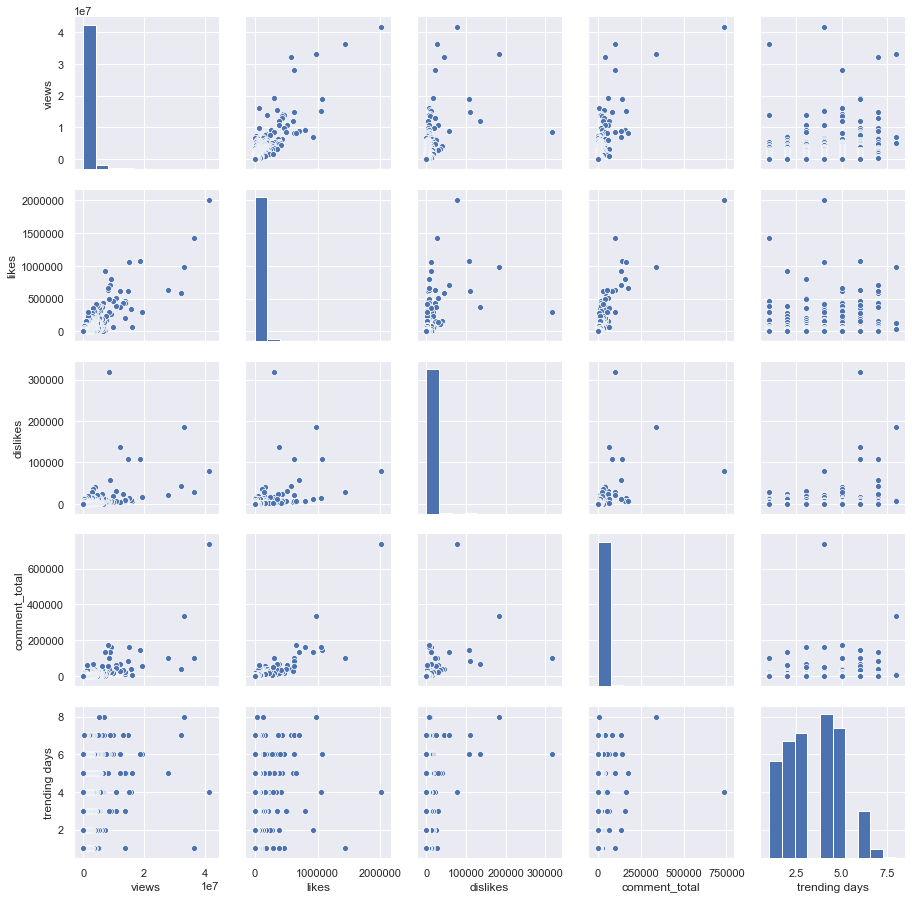

In [49]:
# Extract the Features from the Data
X = pd.DataFrame(USvideos[["views", "likes", "dislikes", "comment_total", "trending days"]]) 
# Plot the Raw Data on 2D grids
sb.pairplot(X)

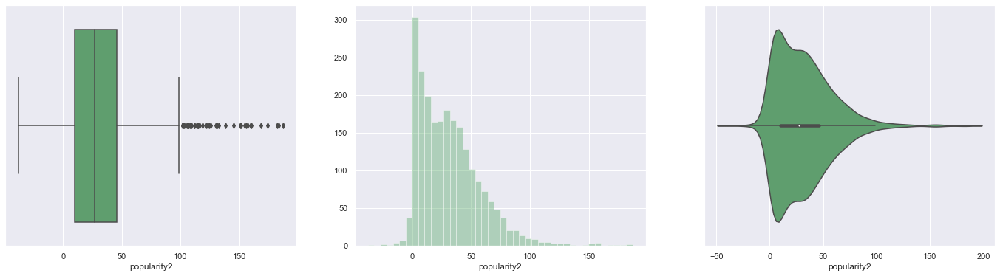

In [50]:
# Draw the distribution of Response
f, axes = plt.subplots(1, 3, figsize=(24, 6))
sb.boxplot(USvideos['popularity2'], orient = "h", ax = axes[0], color = "g")
sb.distplot(USvideos['popularity2'], kde = False, ax = axes[1], color = "g")
sb.violinplot(USvideos['popularity2'], ax = axes[2], color = "g")

In [51]:
# interactive plot for popularity2
trace = go.Histogram(x = USvideos['popularity2'], histnorm = 'density')
layout = go.Layout(title = 'Popularity2 Distribution')
data = [trace]
fig = go.Figure(data = data, layout = layout)
py.iplot(fig)

In [52]:
# interactive plot for quantile_popularity
trace = go.Histogram(x = USvideos['quantile_popularity'], histnorm = 'density')
layout = go.Layout(title = 'Quantile Popularity Distribution')
data = [trace]
fig = go.Figure(data = data, layout = layout)
py.iplot(fig)

The plot above shows that there is an uneven distribution of videos in each of the categories, with 'very low' having the most number of videos and 'high' having the least. This might be a limitation as those in 'very low' can be better trained. We will analyse more of this in the Analysis part later on.

# Clustering for Further Data Visualisation
### Bi-variate clustering by Kmeans++ 
- views & popularity2 are used because views are seen as the most straightforward way of predicting popularity in general

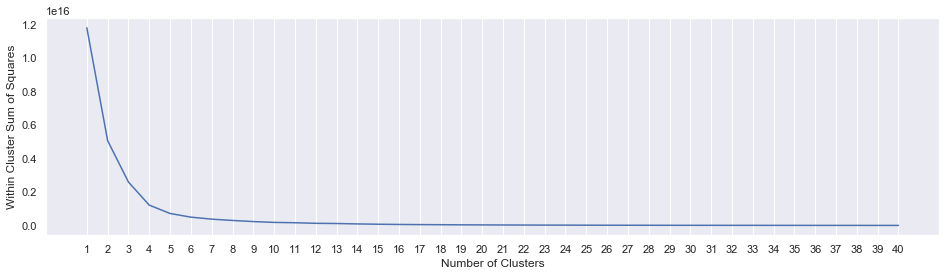

In [53]:
# Import KMeans from sklearn.cluster
from sklearn.cluster import KMeans

# Extract the Features from the Data
X = pd.DataFrame(USvideos[["views", "popularity2"]])

# Set the Initialization to KMeans++
init_algo = 'k-means++'

# Vary the Number of Clusters
min_clust = 1
max_clust = 40

# Compute Within Cluster Sum of Squares
within_ss = []
for num_clust in range(min_clust, max_clust+1):
    kmeans = KMeans(n_clusters = num_clust,        # number of clusters
                    init = init_algo,              # initialization algorithm
                    n_init = 5)                    # number of initializations
    kmeans.fit(X)
    within_ss.append(kmeans.inertia_)

# Plot Within SS vs Number of Clusters
f, axes = plt.subplots(1, 1, figsize=(16,4))
plt.plot(range(min_clust, max_clust+1), within_ss)
plt.xlabel('Number of Clusters')
plt.ylabel('Within Cluster Sum of Squares')
plt.xticks(np.arange(min_clust, max_clust+1, 1.0))
plt.grid(which='major', axis='y')
plt.show()

From the elbow plot, it can be seen that the optimal number of clusters is 4.

Features 	views 	popularity2

Cluster 0:	3267919.69	34.27	
Cluster 1:	409053.73	30.87	
Cluster 2:	34212460.2	29.54	
Cluster 3:	12034940.64	38.48	

Within Cluster Sum of Squares : 1216482783600170.5



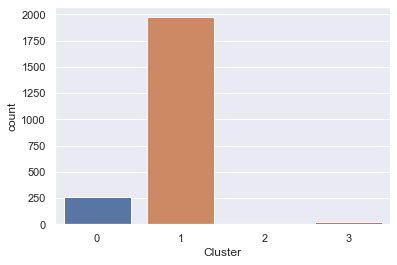

In [54]:
# Set "optimal" Number of Clusters
num_clust = 4

# Set the Initialization to KMeans++
init_algo = 'k-means++'

# Create Clustering Model using KMeans
kmeans = KMeans(n_clusters = num_clust, init = init_algo, n_init = 20)                 

# Fit the Clustering Model on the Data
kmeans.fit(X)

# Print the Cluster Centers
print("Features", "\tviews", "\tpopularity2")
print()

for i, center in enumerate(kmeans.cluster_centers_):
    print("Cluster", i, end=":\t")
    for coord in center:
        print(round(coord, 2), end="\t")
    print()
print()

# Print the Within Cluster Sum of Squares
print("Within Cluster Sum of Squares :", kmeans.inertia_)
print()

# Predict the Cluster Labels
labels = kmeans.predict(X)

# Append Labels to the Data
X_labeled = X.copy()
X_labeled["Cluster"] = pd.Categorical(labels)

# Summary of the Cluster Labels
sb.countplot(X_labeled["Cluster"])

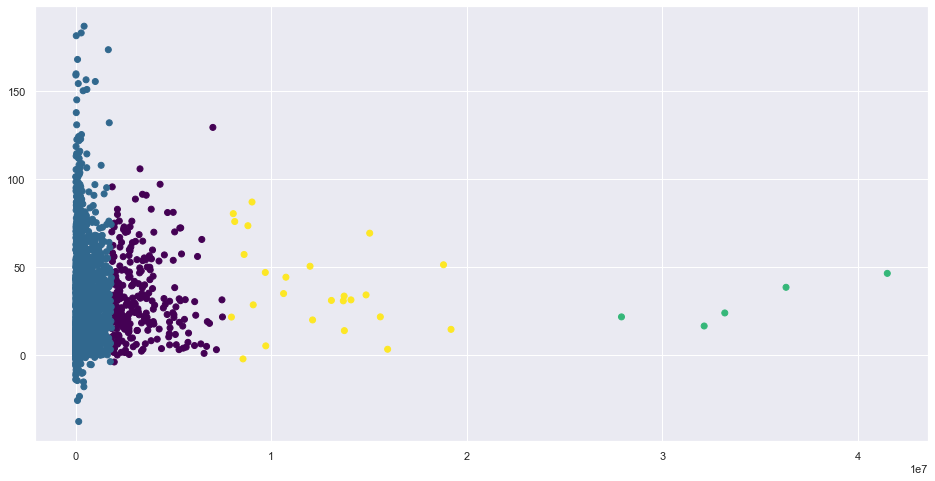

In [55]:
# Visualize the Clusters in the Data
f, axes = plt.subplots(1, 1, figsize=(16,8))
plt.scatter(x = "views", y = "popularity2", c = "Cluster", cmap = 'viridis', data = X_labeled)

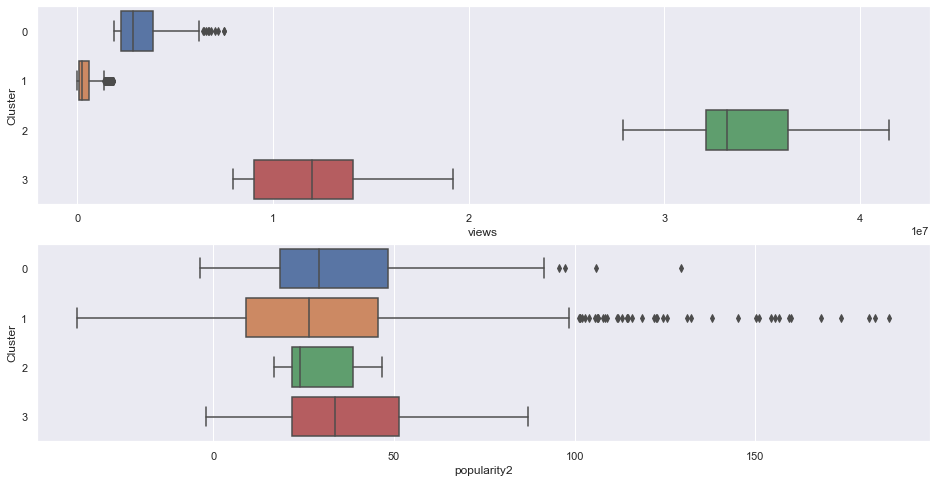

In [56]:
# Boxplots for the Features against the Clusters
f, axes = plt.subplots(2, 1, figsize=(16,8))
sb.boxplot(x = 'views', y = 'Cluster', data = X_labeled, ax = axes[0])
sb.boxplot(x = 'popularity2', y = 'Cluster', data = X_labeled, ax = axes[1])

### Multi-variate Clustering by Kmeans++
- we decided that bi-variate clustering was not enough, thus we decided to use this method to get a better overview of the dataset
- categorical data (ie. Category ID) and non-numerical data (ie comment_text) are not used in clustering 

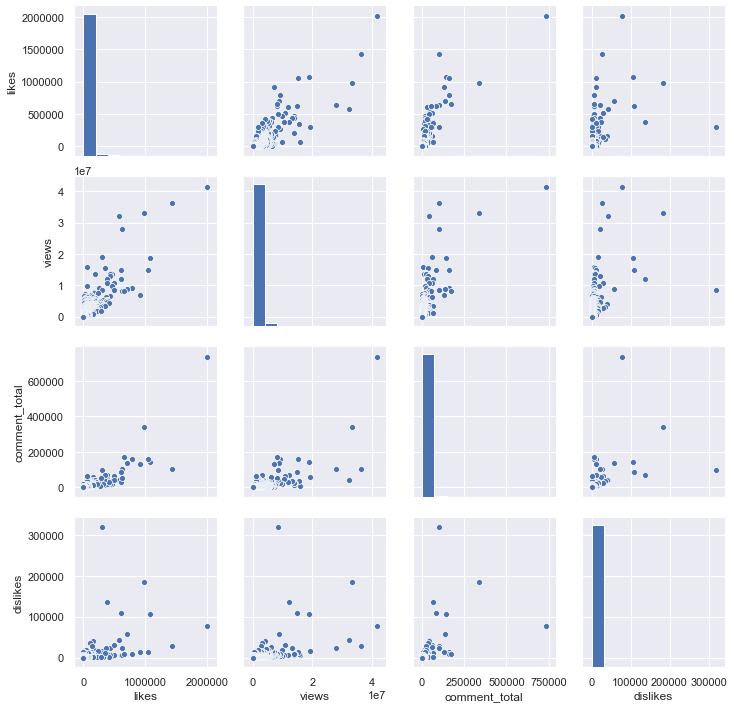

In [53]:
# Extract the Features from the Data
X = pd.DataFrame(USvideos[["likes", "views", "comment_total", "dislikes"]]) 


# Plot the Raw Data on 2D grids
sb.pairplot(X)

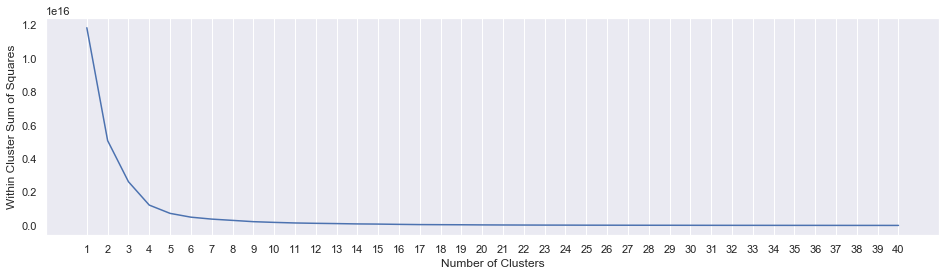

In [54]:
# Vary the Number of Clusters
min_clust = 1
max_clust = 40
init_algo = 'k-means++'

# Compute Within Cluster Sum of Squares
within_ss = []
for num_clust in range(min_clust, max_clust+1):
    kmeans = KMeans(n_clusters = num_clust, init = init_algo, n_init = 5)
    kmeans.fit(X)
    within_ss.append(kmeans.inertia_)

# Angle Plot : Within SS vs Number of Clusters
f, axes = plt.subplots(1, 1, figsize=(16,4))
plt.plot(range(min_clust, max_clust+1), within_ss)
plt.xlabel('Number of Clusters')
plt.ylabel('Within Cluster Sum of Squares')
plt.xticks(np.arange(min_clust, max_clust+1, 1.0))
plt.grid(which='major', axis='y')
plt.show()

In [55]:
# Import essential models from sklearn
from sklearn.cluster import KMeans

# Set "optimal" Clustering Parameters
num_clust = 4
init_algo = 'k-means++'

# Create Clustering Model using KMeans
kmeans = KMeans(n_clusters = num_clust,         
               init = init_algo,
               n_init = 20)                 

# Fit the Clustering Model on the Data
kmeans.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=20, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

Features 	likes 	views 	comment_total 	dislikes

Cluster 0:	13630.27	409053.73	1722.63	524.51	
Cluster 1:	475076.64	12034940.64	61849.04	37162.28	
Cluster 2:	114877.08	3267919.69	11573.0	4207.05	
Cluster 3:	1126848.8	34212460.2	263237.4	71217.4	

Within Cluster Sum of Squares : 1223531001592111.0



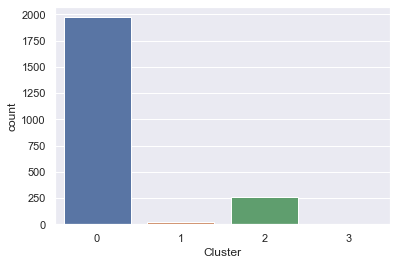

In [56]:
# Print the Cluster Centers
print("Features", "\tlikes", "\tviews", "\tcomment_total", "\tdislikes",)
print()

for i, center in enumerate(kmeans.cluster_centers_):
    print("Cluster", i, end=":\t")
    for coord in center:
        print(round(coord, 2), end="\t")
    print()
print()

# Print the Within Cluster Sum of Squares
print("Within Cluster Sum of Squares :", kmeans.inertia_)
print()

# Predict the Cluster Labels
labels = kmeans.predict(X)

# Append Labels to the Data
X_labeled = X.copy()
X_labeled["Cluster"] = pd.Categorical(labels)

# Summary of the Cluster Labels
sb.countplot(X_labeled["Cluster"])

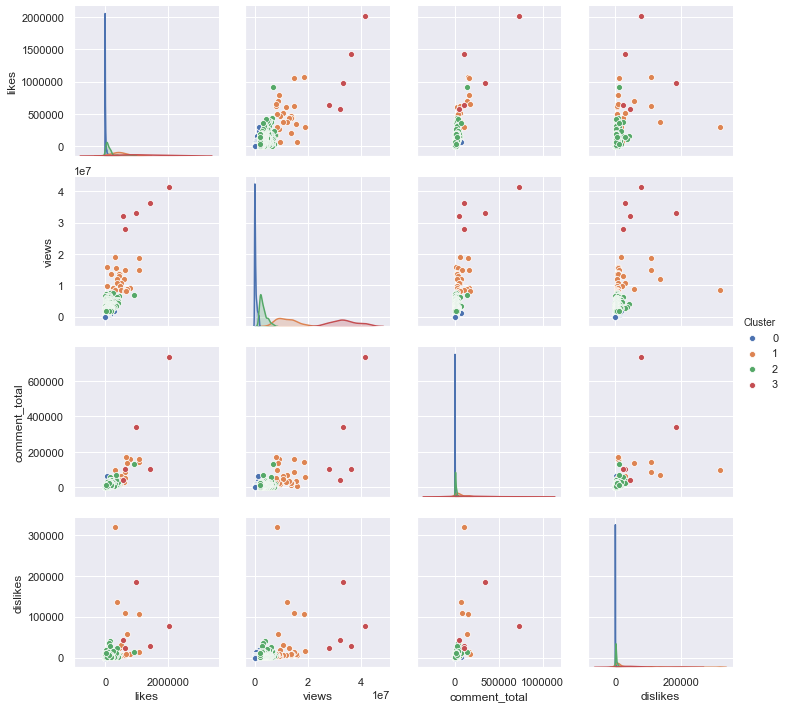

In [57]:
# Plot the Clusters on 2D grids
sb.pairplot(X_labeled, vars = X.columns.values, hue = "Cluster")

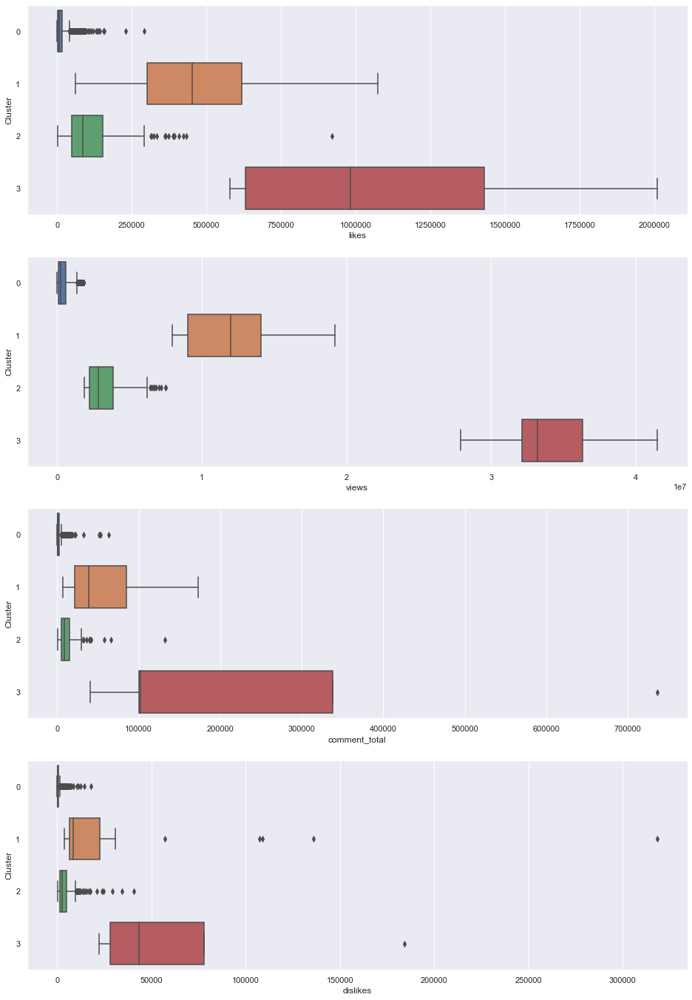

In [58]:
# Boxplots for all Features against the Clusters
f, axes = plt.subplots(4, 1, figsize=(16,24))
sb.boxplot(x = 'likes', y = 'Cluster', data = X_labeled, ax = axes[0])
sb.boxplot(x = 'views', y = 'Cluster', data = X_labeled, ax = axes[1])
sb.boxplot(x = 'comment_total', y = 'Cluster', data = X_labeled, ax = axes[2])
sb.boxplot(x = 'dislikes', y = 'Cluster', data = X_labeled, ax = axes[3])

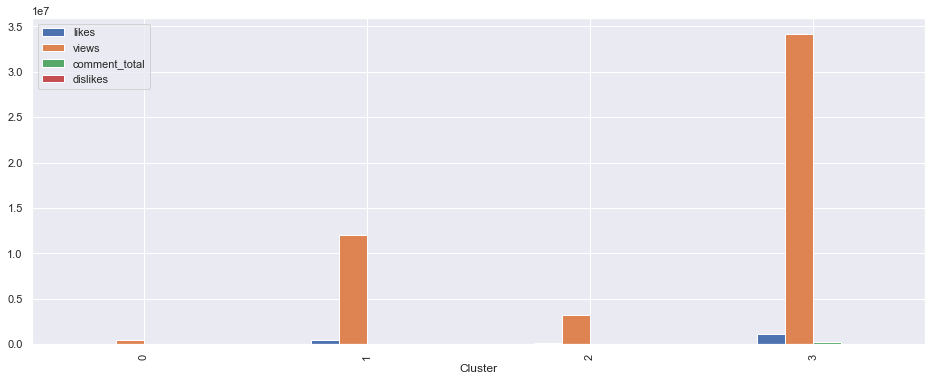

In [59]:
# Average Behaviour of each Cluster
cluster_data = pd.DataFrame(X_labeled.groupby(by = "Cluster").mean())
cluster_data.plot.bar(figsize = (16,6))

Next, we will be moving on to the 8 features mentioned at the start.

# Feature 1: Number of Views

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.64075382803298

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6095406360424028



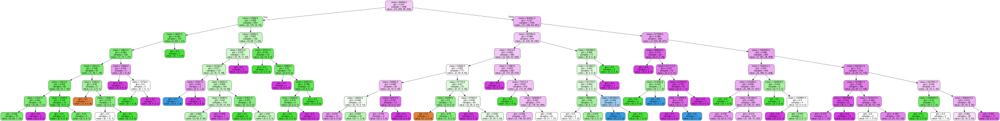

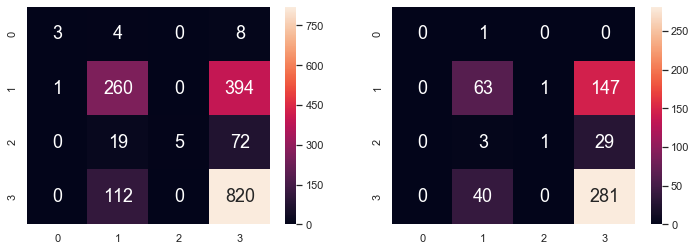

In [64]:
# Recall the Legendary-Total Dataset
QP = pd.DataFrame(USvideos['quantile_popularity'])   # Response
views = pd.DataFrame(USvideos['views'])       # Predictor

# Split the Legendary-Total Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(views, QP, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Legendary values corresponding to Total
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# Feature 2: Number of Likes

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7691401648998822

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6837455830388692



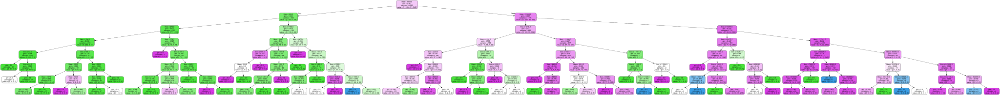

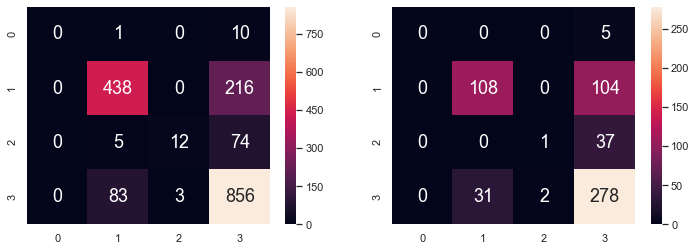

In [65]:
# Recall the Legendary-Total Dataset
QP = pd.DataFrame(USvideos['quantile_popularity'])   # Response
likes = pd.DataFrame(USvideos['likes'])       # Predictor

# Split the Legendary-Total Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(likes, QP, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Legendary values corresponding to Total
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# Feature 3: Number of Dislikes

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6401648998822144

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.607773851590106



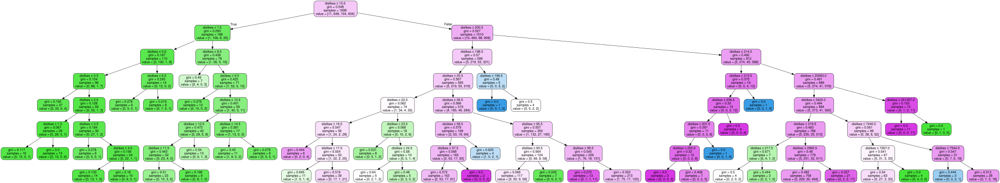

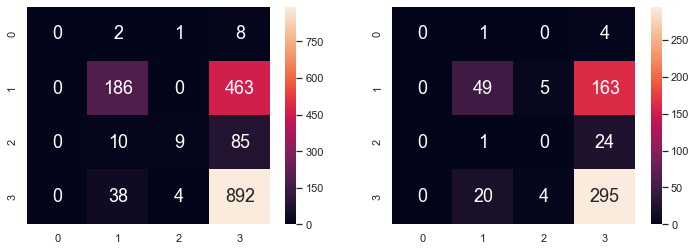

In [66]:
# Recall the Legendary-Total Dataset
QP = pd.DataFrame(USvideos['quantile_popularity'])   # Response
dislikes = pd.DataFrame(USvideos['dislikes'])       # Predictor

# Split the Legendary-Total Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(dislikes, QP, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Legendary values corresponding to Total
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)


# Feature 4: Number of Trending Days

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.5512367491166078

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.5512367491166078



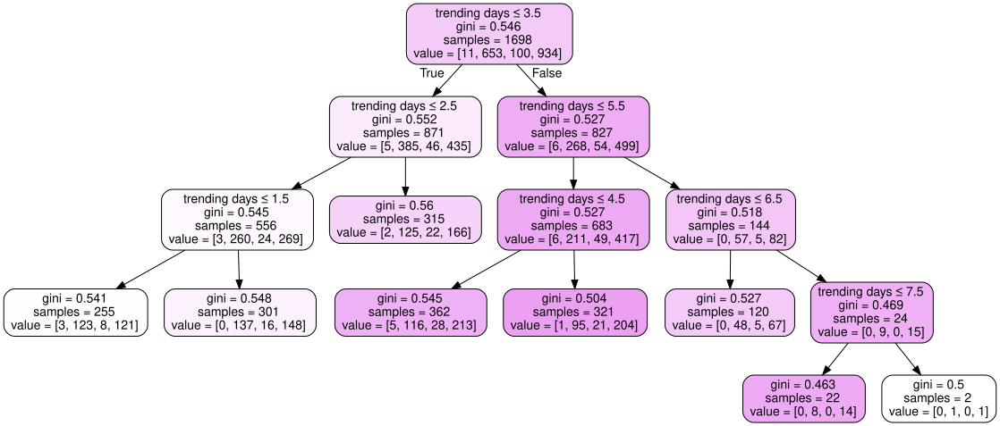

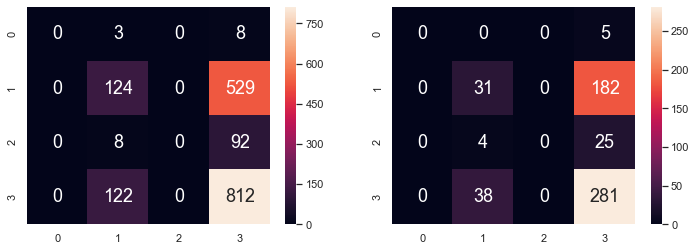

In [67]:
# Recall the Legendary-Total Dataset
QP = pd.DataFrame(USvideos['quantile_popularity'])   # Response
TD = pd.DataFrame(USvideos['trending days'])       # Predictor

# Split the Legendary-Total Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(TD, QP, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Legendary values corresponding to Total
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# Feature 5: Total Number of Comments

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6760895170789164

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6802120141342756



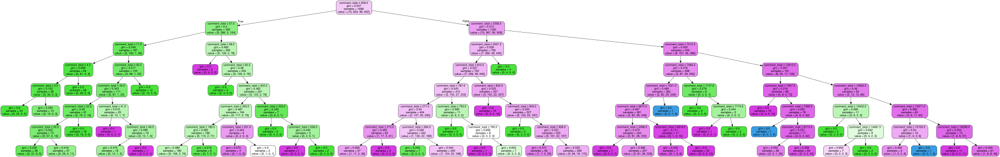

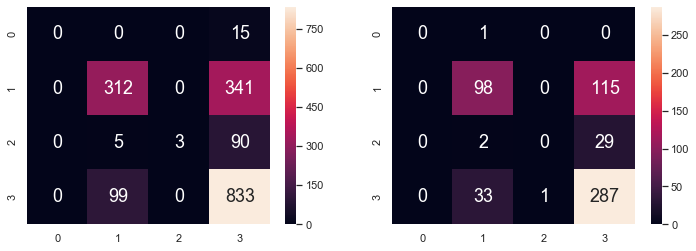

In [68]:
# Recall the Legendary-Total Dataset
QP = pd.DataFrame(USvideos['quantile_popularity'])   # Response
CT = pd.DataFrame(USvideos['comment_total'])       # Predictor

# Split the Legendary-Total Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(CT, QP, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Legendary values corresponding to Total
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)


# Feature 6: Average Sentiment Score
- convert emojis (eg 😂) to text
- convert emoticons (eg :D) to text
- perform sentiment analysis to get the compound, positive, negative and neutral sentiment scores of each comment
- sum up the compound sentiment scores of all the comments of each video
- get the number of comments for each video
- find the average sentiment score of each video

In [69]:
import nltk
nltk.download('vader_lexicon')

from nltk.sentiment.vader import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [70]:
#Installing emot library
!pip install emot
#Importing libraries
import re
from emot.emo_unicode import UNICODE_EMO, EMOTICONS


In [71]:
# Function for converting emojis into word
def convert_emojis(text):
    for emot in UNICODE_EMO:
        text = text.replace(emot, " ".join(UNICODE_EMO[emot].replace(",","").replace("_"," ").replace(":","").split()))
    return text

# Example
text1 = "Hilarious 😂. The feeling of making a sale 😎, The feeling of actually fulfilling orders 😒"
convert_emojis(text1)

'Hilarious face with tears of joy. The feeling of making a sale smiling face with sunglasses, The feeling of actually fulfilling orders unamused face'

In [72]:
UScomments['processed text'] = UScomments['comment_text'].apply(lambda x: convert_emojis(x))
UScomments

,video_id,comment_text,likes,replies,processed text
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼️‼️‼️,4,0,Logan Paul it's yo big day double exclamation ...
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0,I've been following you from the start of your...
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0,Say hi to Kong and maverick for me
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0,MY FAN . attendance
4,XpVt6Z1Gjjo,trending 😉,3,0,trending winking face
...,...,...,...,...,...
691395,EoejGgUNmVU,Лучшая,1,0,Лучшая
691396,EoejGgUNmVU,qu'est ce que j'aimerais que tu viennes à Roan...,0,0,qu'est ce que j'aimerais que tu viennes à Roan...
691397,EoejGgUNmVU,Ven a mexico! 😍 te amo LP,0,0,Ven a mexico! smiling face with heart-eyes te ...
691398,EoejGgUNmVU,Islığı yeter...,0,0,Islığı yeter...


In [73]:
# Function for converting emoticons into word
def convert_emoticons(text):
    for emot in EMOTICONS:
        text = re.sub(u'('+emot+')', " ".join(EMOTICONS[emot].replace(",","").replace("_"," ").split()), text)
    return text

# Example
text = "Hello :-) :-)"
convert_emoticons(text)

'Hello Happy face smiley Happy face smiley'

In [74]:
UScomments['processed text'] = UScomments['processed text'].apply(lambda x: convert_emoticons(x))

# look at row 74
UScomments.head(79)

,video_id,comment_text,likes,replies,processed text
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼️‼️‼️,4,0,Logan Paul it's yo big day double exclamation ...
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0,I've been following you from the start of your...
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0,Say hi to Kong and maverick for me
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0,MY FAN . attendance
4,XpVt6Z1Gjjo,trending 😉,3,0,trending winking face
...,...,...,...,...,...
74,XpVt6Z1Gjjo,DAFUQ did i just watch ;),0,0,DAFUQ did i just watch Wink or smirk
75,XpVt6Z1Gjjo,Jake Paul ? Who,0,0,Jake Paul ? Who
76,XpVt6Z1Gjjo,Pls subscribe to my channel,0,0,Pls subscribe to my channel
77,XpVt6Z1Gjjo,Logang gang gang,0,0,Logang gang gang


In [75]:
#add column of sentiment scores for visualisation
UScomments['pos_score'] = UScomments['comment_text'].apply(lambda x:sia.polarity_scores(x)['pos'])
UScomments['neg_score'] = UScomments['comment_text'].apply(lambda x:sia.polarity_scores(x)['neg'])
UScomments['neu_score'] = UScomments['comment_text'].apply(lambda x:sia.polarity_scores(x)['neu'])

# we will use the compound score for further analysis. here the compound score is renamed as sentiment score
UScomments['sentiment_scores'] = UScomments['comment_text'].apply(lambda x:sia.polarity_scores(x)['compound'])
UScomments.head()

,video_id,comment_text,likes,replies,processed text,pos_score,neg_score,neu_score,sentiment_scores
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼️‼️‼️,4,0,Logan Paul it's yo big day double exclamation ...,0.000,0.0,1.000,0.0000
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0,I've been following you from the start of your...,0.000,0.0,1.000,0.0000
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0,Say hi to Kong and maverick for me,0.000,0.0,1.000,0.0000
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0,MY FAN . attendance,0.603,0.0,0.397,0.4648
4,XpVt6Z1Gjjo,trending 😉,3,0,trending winking face,0.000,0.0,1.000,0.0000


In [76]:
#create new dataframe for number of comments per video
number_comments = UScomments['video_id'].value_counts().rename_axis('video_id').reset_index(name='number_comments')
number_comments

,video_id,number_comments
0,4X6a3G_0HjY,800
1,WYYvHb03Eog,800
2,sjlHnJvXdQs,800
3,CYoRmfI0LUc,800
4,LunHybOKIjU,800
...,...,...
2260,jLa9wZHiqxg,1
2261,94U8bow4CU4,1
2262,mi52IqpOp54,1
2263,c5RsAXsZvI8,1


In [77]:
#create new dataframe for total number of positive comments per video
total = UScomments.groupby(['video_id'], sort = False).sum()
total

,pos_score,neg_score,neu_score,sentiment_scores
video_id,,,,
XpVt6Z1Gjjo,130.217,91.624,575.161,55.8251
cLdxuaxaQwc,123.240,120.834,546.924,-20.1133
WYYvHb03Eog,88.452,67.497,641.061,54.8507
sjlHnJvXdQs,136.974,54.494,602.523,101.2171
cMKX2tE5Luk,117.184,36.061,544.746,125.5978
...,...,...,...,...
mv4MRmwXJMM,20.597,2.576,75.828,25.9042
7_GaeAoLMWY,26.310,6.445,67.242,31.3127
S9VIKOuZcds,20.790,16.197,61.010,14.3527


In [78]:
#merge total and number_comments dataframes 
total = pd.merge(total, number_comments, on = 'video_id')
total.head()

,video_id,pos_score,neg_score,neu_score,sentiment_scores,number_comments
0,XpVt6Z1Gjjo,130.217,91.624,575.161,55.8251,800
1,cLdxuaxaQwc,123.240,120.834,546.924,-20.1133,799
2,WYYvHb03Eog,88.452,67.497,641.061,54.8507,800
3,sjlHnJvXdQs,136.974,54.494,602.523,101.2171,800
4,cMKX2tE5Luk,117.184,36.061,544.746,125.5978,700


In [79]:
#add column of average sentiment
total['average_sentiment'] = total['sentiment_scores'].div(total['number_comments'].values, axis=0)
total.head()

,video_id,pos_score,neg_score,neu_score,sentiment_scores,number_comments,average_sentiment
0,XpVt6Z1Gjjo,130.217,91.624,575.161,55.8251,800,0.069781
1,cLdxuaxaQwc,123.240,120.834,546.924,-20.1133,799,-0.025173
2,WYYvHb03Eog,88.452,67.497,641.061,54.8507,800,0.068563
3,sjlHnJvXdQs,136.974,54.494,602.523,101.2171,800,0.126521
4,cMKX2tE5Luk,117.184,36.061,544.746,125.5978,700,0.179425


In [80]:
#add average sentiment column into USvideos dataframe
USvideos = pd.merge(USvideos, total, on = 'video_id')
USvideos.head(30)

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,...,popularity2,popularity_rank,popularity2_rank,quantile_popularity,pos_score,neg_score,neu_score,sentiment_scores,number_comments,average_sentiment
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09,...,46.560451,532.0,554.0,very low,58.697,18.655,318.649,50.9482,400,0.127370
1,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09,...,38.642589,763.0,749.0,very low,23.841,4.617,71.544,26.0999,100,0.260999
2,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10,...,24.058260,1085.0,1226.0,very low,105.833,113.469,580.708,-27.6414,800,-0.034552
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09,...,16.641002,1460.0,1456.0,low,85.366,30.077,579.556,58.9172,700,0.084167
4,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10,...,21.817233,1308.0,1285.0,very low,73.377,49.788,373.842,35.1505,500,0.070301
5,r9-DM9uBtVI,JUSTICE LEAGUE - Official Heroes Trailer,Warner Bros. Pictures,24,justice league|justice league movie|batman|won...,19194567,298938,16124,56329,14.10,...,14.734065,1526.0,1503.0,low,104.408,56.156,435.441,66.2355,600,0.110392
6,3y5A4paFOb4,Logan Paul - Outta My Hair [Official Music Video],Logan Paul Vlogs,24,logan paul vlog|logan paul|logan|paul|olympics...,18809766,1075133,107386,143156,22.10,...,51.449178,361.0,438.0,very low,104.376,65.199,429.426,45.2679,600,0.075446
7,GO6qs83CHpc,Sneaky toddler steals Prince Harry's popcorn,The Royal Family Channel,25,prince harry|popcorn|poacher|girl|emily henson...,15952413,61765,7112,6799,4.10,...,3.426002,2048.0,1993.0,low,82.332,41.682,373.984,48.0554,500,0.096111
8,D59v74k5flU,Primitive Technology: Mud Bricks,Primitive Technology,22,[none],15579127,348653,8496,36857,28.09,...,21.834150,1317.0,1283.0,very low,56.269,20.990,322.741,52.2480,400,0.130620
9,FSOxXsYVJMQ,BTS (방탄소년단) 'DNA' Official Teaser 1,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,15035822,1056548,12656,161642,18.09,...,69.426999,197.0,192.0,very low,66.068,19.323,408.610,64.4796,500,0.128959


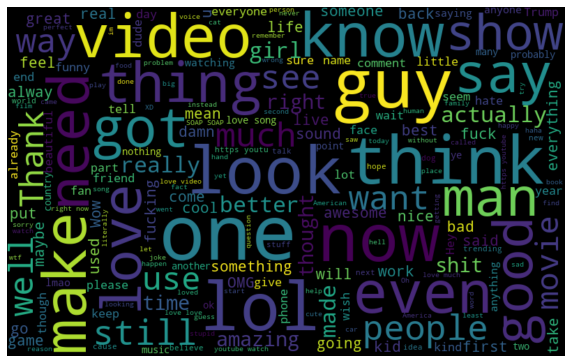

In [81]:
# visualisation of the more commonly used words
all_words = ' '.join([text for text in UScomments['comment_text']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6819787985865724

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6678445229681979



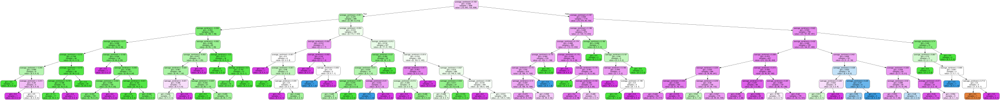

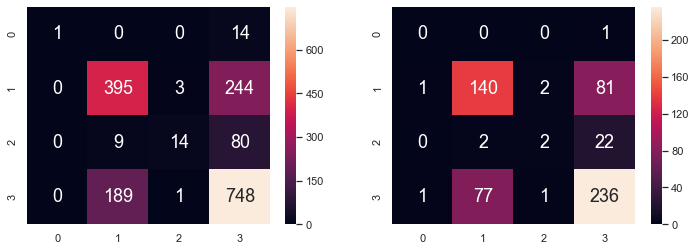

In [82]:
QP = pd.DataFrame(USvideos['quantile_popularity'])   # Response
AS = pd.DataFrame(USvideos['average_sentiment'])       # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(AS, QP, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict response values corresponding to predictor
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# Feature 7: Percentage of Positive Comments over Total Number of Comments
###### for each comment: 
- if sentiment score > 0, it is a positive sentiment
- if sentiment score < 0, it is a negative sentiment
- if sentiment score > 0, it is a neutral sentiment

- then find the percentage of comments with positive sentiments


In [83]:
#Categorize positive, negative, neutral
UScomments['Sentiment'] = UScomments['sentiment_scores'].apply(lambda s : 'Positive' if s > 0 else ('Neutral' if s == 0 else 'Negative'))
UScomments.head(20)

,video_id,comment_text,likes,replies,processed text,pos_score,neg_score,neu_score,sentiment_scores,Sentiment
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼️‼️‼️,4,0,Logan Paul it's yo big day double exclamation ...,0.000,0.000,1.000,0.0000,Neutral
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0,I've been following you from the start of your...,0.000,0.000,1.000,0.0000,Neutral
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0,Say hi to Kong and maverick for me,0.000,0.000,1.000,0.0000,Neutral
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0,MY FAN . attendance,0.603,0.000,0.397,0.4648,Positive
4,XpVt6Z1Gjjo,trending 😉,3,0,trending winking face,0.000,0.000,1.000,0.0000,Neutral
5,XpVt6Z1Gjjo,#1 on trending AYYEEEEE,3,0,#1 on trending AYYEEEEE,0.000,0.000,1.000,0.0000,Neutral
6,XpVt6Z1Gjjo,The end though 😭👍🏻❤️,4,0,The end though loudly crying facethumbs upligh...,0.000,0.000,1.000,0.0000,Neutral
7,XpVt6Z1Gjjo,#1 trending!!!!!!!!!,3,0,#1 trending!!!!!!!!!,0.000,0.000,1.000,0.0000,Neutral
8,XpVt6Z1Gjjo,Happy one year vlogaversary,3,0,Happy one year vlogaversary,0.552,0.000,0.448,0.5719,Positive
9,XpVt6Z1Gjjo,You and your shit brother may have single hand...,0,0,You and your shit brother may have single hand...,0.000,0.427,0.573,-0.7717,Negative


In [84]:
#percentage of comments which are positive in all the videos
positive_percent = []
for i in range(0,UScomments.video_id.nunique()):
    a = UScomments[(UScomments.video_id == UScomments.video_id.unique()[i]) & (UScomments.Sentiment == 'Positive')].count()[0]
    b = UScomments[UScomments.video_id == UScomments.video_id.unique()[i]]['Sentiment'].value_counts().sum()
    Percentage = (a/b)*100
    positive_percent.append(round(Percentage,2))

positive_percent

[36.12,
 38.05,
 35.12,
 41.5,
 43.0,
 40.0,
 39.0,
 47.19,
 42.29,
 46.33,
 42.29,
 37.0,
 40.86,
 42.0,
 47.14,
 42.06,
 28.8,
 35.0,
 35.2,
 41.57,
 33.44,
 32.0,
 52.4,
 49.33,
 39.0,
 42.4,
 45.0,
 35.0,
 56.33,
 39.0,
 41.8,
 55.31,
 48.0,
 44.48,
 38.33,
 51.03,
 28.25,
 63.0,
 33.67,
 37.0,
 50.75,
 32.0,
 64.5,
 52.33,
 78.0,
 64.0,
 78.0,
 55.43,
 58.5,
 42.86,
 29.0,
 54.5,
 30.0,
 31.5,
 37.0,
 41.0,
 43.16,
 57.5,
 28.5,
 40.5,
 77.78,
 26.67,
 41.0,
 24.0,
 47.0,
 54.63,
 75.5,
 52.5,
 47.5,
 25.0,
 55.0,
 41.5,
 54.0,
 47.0,
 43.94,
 41.5,
 46.0,
 33.5,
 36.0,
 50.5,
 38.0,
 27.5,
 62.5,
 23.93,
 57.5,
 53.5,
 25.5,
 54.55,
 42.0,
 39.0,
 23.5,
 45.0,
 27.0,
 36.0,
 50.5,
 56.0,
 65.0,
 23.0,
 25.25,
 31.82,
 50.29,
 66.0,
 41.84,
 43.0,
 29.5,
 59.5,
 33.0,
 25.5,
 26.09,
 58.82,
 54.5,
 37.5,
 44.19,
 38.0,
 45.5,
 34.81,
 32.5,
 50.0,
 51.0,
 61.5,
 48.0,
 60.71,
 39.0,
 58.0,
 30.0,
 35.5,
 56.57,
 84.62,
 59.07,
 9.09,
 83.5,
 50.0,
 100.0,
 34.0,
 33.33,
 66.0,
 46

In [85]:
#Creating dataframe for positive percentage
positive_percentage = pd.DataFrame(positive_percent,UScomments.video_id.unique()).reset_index()
positive_percentage.columns = ['video_id','Positive Percentage']
positive_percentage

,video_id,Positive Percentage
0,XpVt6Z1Gjjo,36.12
1,cLdxuaxaQwc,38.05
2,WYYvHb03Eog,35.12
3,sjlHnJvXdQs,41.50
4,cMKX2tE5Luk,43.00
...,...,...
2260,mv4MRmwXJMM,46.00
2261,7_GaeAoLMWY,57.00
2262,S9VIKOuZcds,48.00
2263,a5NIg5yyHWo,53.00


In [86]:
#add positive percentage column into USvideos dataframe
USvideos = pd.merge(USvideos, positive_percentage, on = 'video_id')
USvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,...,popularity_rank,popularity2_rank,quantile_popularity,pos_score,neg_score,neu_score,sentiment_scores,number_comments,average_sentiment,Positive Percentage
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09,...,532.0,554.0,very low,58.697,18.655,318.649,50.9482,400,0.127370,33.25
1,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09,...,763.0,749.0,very low,23.841,4.617,71.544,26.0999,100,0.260999,49.00
2,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10,...,1085.0,1226.0,very low,105.833,113.469,580.708,-27.6414,800,-0.034552,34.25
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09,...,1460.0,1456.0,low,85.366,30.077,579.556,58.9172,700,0.084167,25.57
4,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10,...,1308.0,1285.0,very low,73.377,49.788,373.842,35.1505,500,0.070301,36.20


In [87]:
all_words_posi = ' '.join([text for text in UScomments['comment_text'][UScomments.Sentiment == 'Positive']])

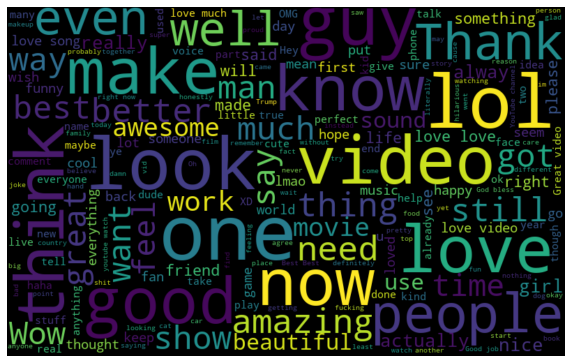

In [88]:
# visualisation of words in positive comments
wordcloud_posi = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words_posi)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud_posi, interpolation="bilinear")
plt.axis('off')
plt.show()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6554770318021201

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.607773851590106



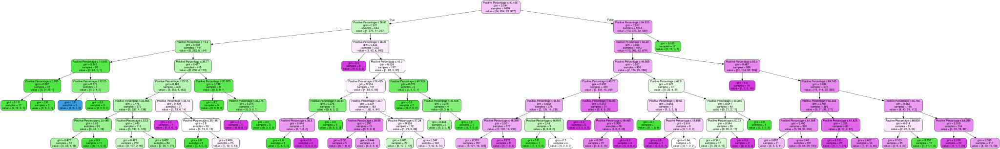

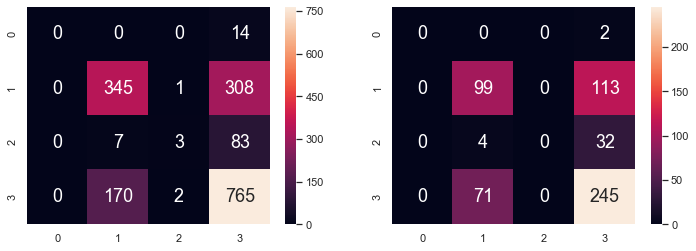

In [89]:
QP = pd.DataFrame(USvideos['quantile_popularity'])   # Response
PP = pd.DataFrame(USvideos['Positive Percentage'])       # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(PP, QP, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict response values corresponding to predictor
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# Feature 8: Percentage of Negative Comments over Total Number of Comments

In [90]:
#percentage of comments which are negative in all the videos
negative_percent = []
for i in range(0,UScomments.video_id.nunique()):
    a = UScomments[(UScomments.video_id == UScomments.video_id.unique()[i]) & (UScomments.Sentiment == 'Negative')].count()[0]
    b = UScomments[UScomments.video_id == UScomments.video_id.unique()[i]]['Sentiment'].value_counts().sum()
    Percentage = (a/b)*100
    negative_percent.append(round(Percentage,2))

negative_percent

[26.5,
 40.8,
 24.25,
 18.5,
 13.43,
 36.5,
 23.25,
 11.85,
 18.14,
 16.0,
 18.43,
 32.75,
 29.0,
 21.0,
 20.14,
 19.74,
 19.2,
 22.6,
 28.2,
 21.57,
 31.44,
 25.0,
 17.6,
 28.5,
 25.0,
 16.8,
 29.0,
 50.67,
 10.0,
 20.4,
 19.8,
 26.85,
 36.0,
 16.05,
 9.0,
 16.13,
 50.5,
 7.5,
 25.0,
 39.5,
 9.0,
 40.0,
 6.5,
 8.67,
 5.33,
 12.0,
 7.5,
 7.61,
 7.0,
 21.43,
 41.0,
 19.0,
 20.5,
 20.5,
 27.67,
 29.5,
 34.74,
 15.0,
 54.0,
 20.0,
 22.22,
 20.0,
 15.5,
 33.0,
 19.5,
 21.3,
 3.5,
 26.0,
 25.0,
 37.5,
 16.5,
 17.0,
 28.5,
 15.0,
 30.81,
 32.0,
 7.0,
 17.5,
 44.0,
 16.5,
 33.5,
 26.0,
 11.5,
 23.93,
 16.0,
 20.5,
 52.5,
 8.59,
 24.0,
 28.0,
 29.5,
 10.5,
 44.5,
 33.0,
 13.0,
 4.5,
 14.5,
 6.0,
 36.36,
 46.97,
 28.9,
 26.0,
 21.43,
 23.0,
 26.0,
 11.5,
 21.0,
 27.5,
 39.13,
 17.65,
 8.5,
 17.0,
 37.21,
 35.0,
 9.0,
 46.84,
 18.5,
 0.0,
 18.0,
 10.0,
 18.0,
 5.36,
 42.0,
 18.0,
 32.5,
 11.0,
 13.64,
 0.0,
 13.47,
 4.55,
 3.0,
 21.0,
 0.0,
 38.0,
 0.0,
 10.0,
 27.0,
 23.5,
 19.51,
 15.5,
 0.0,


In [91]:
#Creating dataframe for negative percentage
negative_percentage = pd.DataFrame(negative_percent,UScomments.video_id.unique()).reset_index()
negative_percentage.columns = ['video_id','Negative Percentage']
negative_percentage

,video_id,Negative Percentage
0,XpVt6Z1Gjjo,26.50
1,cLdxuaxaQwc,40.80
2,WYYvHb03Eog,24.25
3,sjlHnJvXdQs,18.50
4,cMKX2tE5Luk,13.43
...,...,...
2260,mv4MRmwXJMM,5.00
2261,7_GaeAoLMWY,17.00
2262,S9VIKOuZcds,32.00
2263,a5NIg5yyHWo,18.00


In [92]:
#add negative percentage column into USvideos dataframe
USvideos = pd.merge(USvideos, negative_percentage, on = 'video_id')
USvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,...,popularity2_rank,quantile_popularity,pos_score,neg_score,neu_score,sentiment_scores,number_comments,average_sentiment,Positive Percentage,Negative Percentage
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09,...,554.0,very low,58.697,18.655,318.649,50.9482,400,0.127370,33.25,10.75
1,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09,...,749.0,very low,23.841,4.617,71.544,26.0999,100,0.260999,49.00,10.00
2,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10,...,1226.0,very low,105.833,113.469,580.708,-27.6414,800,-0.034552,34.25,37.12
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09,...,1456.0,low,85.366,30.077,579.556,58.9172,700,0.084167,25.57,14.43
4,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10,...,1285.0,very low,73.377,49.788,373.842,35.1505,500,0.070301,36.20,24.40


In [93]:
all_words_nega = ' '.join([text for text in UScomments['comment_text'][UScomments.Sentiment == 'Negative']])

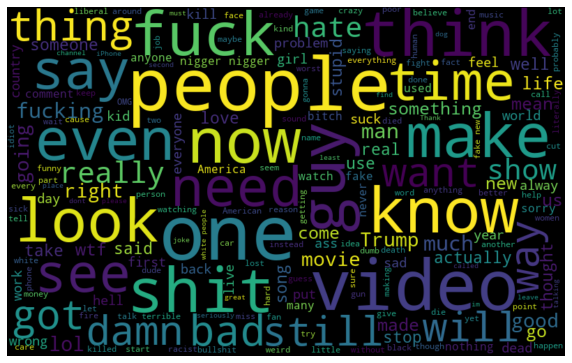

In [94]:
# visualisation of words in negative comments
wordcloud_nega = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words_nega)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud_nega, interpolation="bilinear")
plt.axis('off')
plt.show()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7084805653710248

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6484098939929329



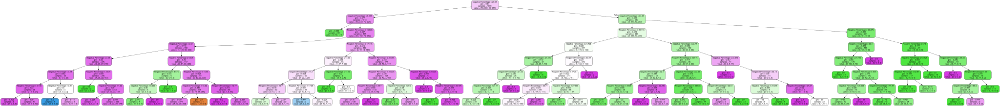

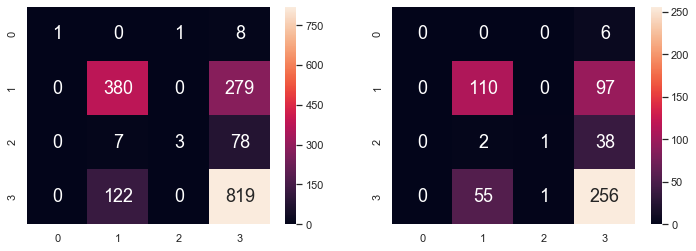

In [95]:
QP = pd.DataFrame(USvideos['quantile_popularity'])   # Response
NP = pd.DataFrame(USvideos['Negative Percentage'])       # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(NP, QP, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict response values corresponding to predictor
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# Multivariate Classification

In [212]:
# Extract Response and Predictors
y = pd.DataFrame(USvideos["quantile_popularity"])
X = pd.DataFrame(USvideos[["likes", "views", "comment_total", "trending days", "dislikes", "average_sentiment", "Positive Percentage", "Negative Percentage"]])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Check the sample sizes
print("Train Set :", y_train.shape, X_train.shape)
print("Test Set  :", y_test.shape, X_test.shape)

Train Set : (1698, 1) (1698, 8)
Test Set  : (566, 1) (566, 8)


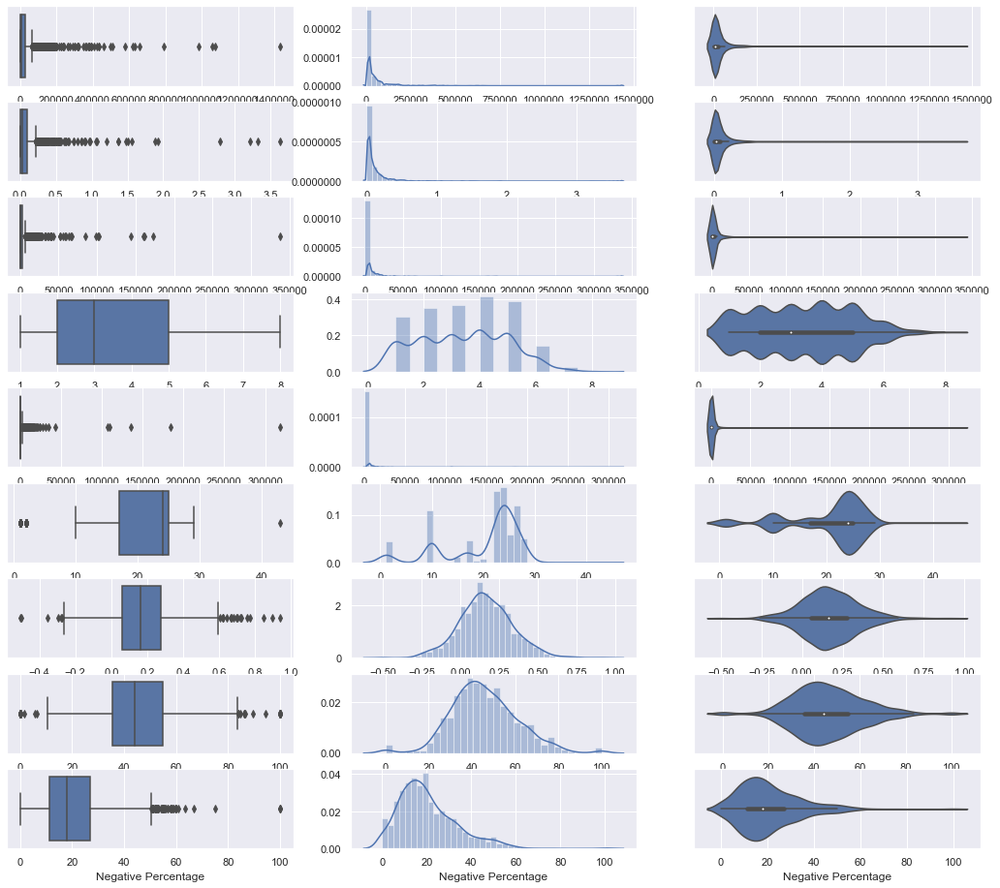

In [97]:
# Draw the distributions of all Predictors
f, axes = plt.subplots(8, 3, figsize=(18, 16))

count = 0
for var in X_train:
    sb.boxplot(X_train[var], orient = "h", ax = axes[count,0])
    sb.distplot(X_train[var], ax = axes[count,1])
    sb.violinplot(X_train[var], ax = axes[count,2])
    count += 1

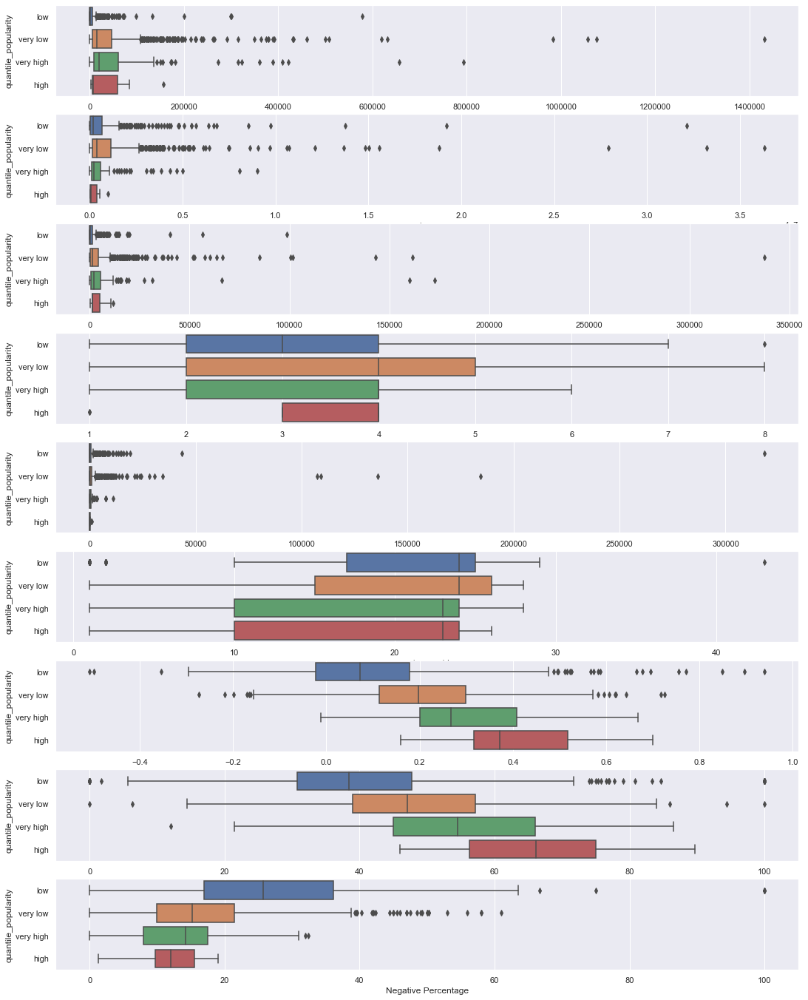

In [98]:
# Relationship between Response and the Predictors
trainDF = pd.concat([y_train, X_train.reindex(index=y_train.index)], sort = False, axis = 1)

f, axes = plt.subplots(8, 1, figsize=(18, 24))

count = 0
for var in X_train:
    sb.boxplot(x = var, y = "quantile_popularity", data = trainDF, orient = "h", ax = axes[count])
    count += 1

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9257950530035336

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.8780918727915195



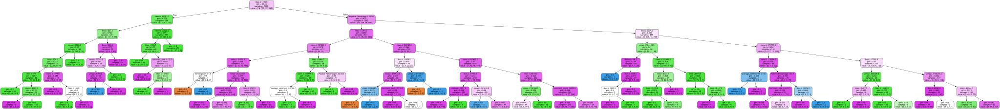

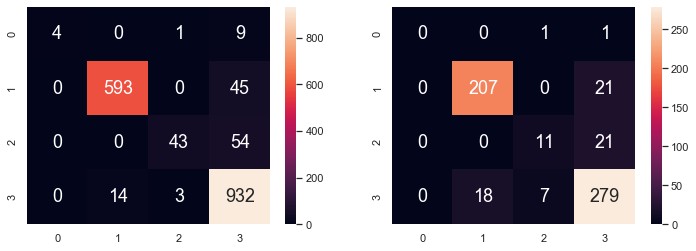

In [213]:
# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# Random Forest

In [100]:
# Extract Response and Predictors
y = pd.DataFrame(USvideos["quantile_popularity"])
X = pd.DataFrame(USvideos[["likes", "views", "comment_total", "trending days", "dislikes", "average_sentiment", "Positive Percentage", "Negative Percentage"]])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Check the sample sizes
print("Train Set :", y_train.shape, X_train.shape)
print("Test Set  :", y_test.shape, X_test.shape)

Train Set : (1698, 1) (1698, 8)
Test Set  : (566, 1) (566, 8)


In [101]:
# Import RandomForestClassifier model from Scikit-Learn
from sklearn.ensemble import RandomForestClassifier

# Create the Random Forest object
rforest = RandomForestClassifier(n_estimators = 100,  # n_estimators denote number of trees
                                 max_depth = 7)       # set the maximum depth of each tree

# Fit Random Forest on Train Data
rforest.fit(X_train, y_train.values.ravel())

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9487632508833922

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.8392226148409894



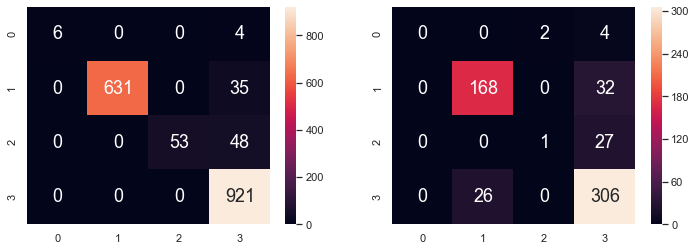

In [102]:
# Import confusion_matrix from Scikit-Learn
from sklearn.metrics import confusion_matrix

# Predict 0/1 values corresponding to message
y_train_pred = rforest.predict(X_train)
y_test_pred = rforest.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", rforest.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", rforest.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# 2. Great Britain (GB)
- Since the video statistics and comments statistics are in separate CSV files, we will import both files (GBvideos & GBcomments) for analysis.

In [79]:
#import dataset and remove bad lines
GBvideos = pd.read_csv('GBvideos.csv', error_bad_lines=False)
GBvideos

b'Skipping line 2398: expected 11 fields, saw 21\nSkipping line 2797: expected 11 fields, saw 21\n'


,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,thumbnail_link,date
0,jt2OHQh0HoQ,Live Apple Event - Apple September Event 2017 ...,Apple Event,28,apple events|apple event|iphone 8|iphone x|iph...,7426393,78240,13548,705,https://i.ytimg.com/vi/jt2OHQh0HoQ/default_liv...,13.09
1,AqokkXoa7uE,Holly and Phillip Meet Samantha the Sex Robot ...,This Morning,24,this morning|interview|holly willoughby|philli...,494203,2651,1309,0,https://i.ytimg.com/vi/AqokkXoa7uE/default.jpg,13.09
2,YPVcg45W0z4,My DNA Test Results! I'm WHAT?!,emmablackery,24,emmablackery|emma blackery|emma|blackery|briti...,142819,13119,151,1141,https://i.ytimg.com/vi/YPVcg45W0z4/default.jpg,13.09
3,T_PuZBdT2iM,getting into a conversation in a language you ...,ProZD,1,skit|korean|language|conversation|esl|japanese...,1580028,65729,1529,3598,https://i.ytimg.com/vi/T_PuZBdT2iM/default.jpg,13.09
4,NsjsmgmbCfc,Baby Name Challenge!,Sprinkleofglitter,26,sprinkleofglitter|sprinkle of glitter|baby gli...,40592,5019,57,490,https://i.ytimg.com/vi/NsjsmgmbCfc/default.jpg,13.09
...,...,...,...,...,...,...,...,...,...,...,...
7988,T2RUYYs8Hxc,DJ Cummerbund - Hey Trump!,DJ Cummerbund,10,eminem|freestyle|bet|rage against the machine|...,118453,1846,92,240,https://i.ytimg.com/vi/T2RUYYs8Hxc/default.jpg,22.10
7989,KkQdnJK1iF8,Emotional Groom Start Crying When He Sees Brid...,Today`s Video,22,Today's Video|Today Video|Latest News|Last|New...,76096,194,19,31,https://i.ytimg.com/vi/KkQdnJK1iF8/default.jpg,22.10
7990,1zOPtQNChZM,FALLING IN LOVE WITH SANTORINI,Estée Lalonde,22,essiebutton|Estée Lalonde|Estee Lalonde|Essie ...,170003,6592,127,454,https://i.ytimg.com/vi/1zOPtQNChZM/default.jpg,22.10
7991,Z7R8XRKqHAI,Hey Ya! - Walk off the Earth (Outkast Cover),Walk off the Earth,10,hey ya cover|amazing cover|Shape of You Walk o...,893125,44811,652,2056,https://i.ytimg.com/vi/Z7R8XRKqHAI/default.jpg,22.10


In [80]:
#import dataset and remove bad lines
GBcomments = pd.read_csv('GBcomments.csv', error_bad_lines=False)
GBcomments

b'Skipping line 113225: expected 4 fields, saw 5\n'
b'Skipping line 158379: expected 4 fields, saw 7\nSkipping line 241590: expected 4 fields, saw 5\nSkipping line 245637: expected 4 fields, saw 7\n'
b'Skipping line 521402: expected 4 fields, saw 5\n'


,video_id,comment_text,likes,replies
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0
...,...,...,...,...
718447,lLN1FwiqGwc,MEME ME MEME ME MEME ME,0,0
718448,lLN1FwiqGwc,"Yeah, but does everybody float?",0,0
718449,lLN1FwiqGwc,That meme me dace 😂,0,0
718450,lLN1FwiqGwc,10:43 Is that Miles Upshur????,2,0


# Data Cleaning

In [81]:
#del thumbnail column as it is redundant for classification
GBvideos = GBvideos.drop(columns='thumbnail_link')
GBvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date
0,jt2OHQh0HoQ,Live Apple Event - Apple September Event 2017 ...,Apple Event,28,apple events|apple event|iphone 8|iphone x|iph...,7426393,78240,13548,705,13.09
1,AqokkXoa7uE,Holly and Phillip Meet Samantha the Sex Robot ...,This Morning,24,this morning|interview|holly willoughby|philli...,494203,2651,1309,0,13.09
2,YPVcg45W0z4,My DNA Test Results! I'm WHAT?!,emmablackery,24,emmablackery|emma blackery|emma|blackery|briti...,142819,13119,151,1141,13.09
3,T_PuZBdT2iM,getting into a conversation in a language you ...,ProZD,1,skit|korean|language|conversation|esl|japanese...,1580028,65729,1529,3598,13.09
4,NsjsmgmbCfc,Baby Name Challenge!,Sprinkleofglitter,26,sprinkleofglitter|sprinkle of glitter|baby gli...,40592,5019,57,490,13.09


In [82]:
#sort videos from most views to least views for visualisation 
GBvideos.sort_values(by=['views'], inplace=True, ascending=False)
GBvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date
2767,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,58961407,2289911,96258,813322,26.09
2572,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,55269274,2241616,92413,797268,25.09
2359,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,51093264,2184109,88300,778798,24.09
2143,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,47496553,2129373,85273,758352,23.09
592,QeaumjX9DNY,Yandel - Como Antes (Official Video) ft. Wisin,YandelVEVO,10,Wisinyyandel|wisin&yandel|yandelywisin|yandel&...,42486342,678389,13995,48429,15.09


In [83]:
GBvideos.describe()

,category_id,views,likes,dislikes,comment_total,date
count,7993.000000,7.993000e+03,7.993000e+03,7993.000000,7993.000000,7993.000000
mean,19.738271,1.110733e+06,3.885966e+04,1528.858877,4991.631177,16.088874
std,7.178132,3.048740e+06,1.092951e+05,8176.707788,26837.135518,7.678176
min,1.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,1.100000
25%,17.000000,1.083750e+05,2.580000e+03,71.000000,308.000000,10.100000
50%,23.000000,3.151940e+05,9.561000e+03,249.000000,1038.000000,16.100000
75%,24.000000,9.712210e+05,3.159300e+04,867.000000,3327.000000,21.100000
max,29.000000,5.896141e+07,2.289911e+06,192725.000000,813322.000000,30.090000


In [84]:
#add new DataFrame for number of duplicates to show the numberof duplicates
duplicates_GB = GBvideos['video_id'].value_counts().rename_axis('video_id').reset_index(name='trending days')
duplicates_GB

,video_id,trending days
0,Q0CbN8sfihY,12
1,LunHybOKIjU,12
2,t3AVtQkEHaE,11
3,r9-DM9uBtVI,11
4,w4SKo5jU64I,10
...,...,...
1731,5LjxhUoMdFQ,1
1732,zKDPrpJEGBY,1
1733,T6lon9-8Fck,1
1734,H2AYOJ2K8MU,1


In [85]:
#remove duplicates
GBvideos.drop_duplicates(subset ="video_id", keep = 'first', inplace = True)
GBvideos

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date
2767,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,58961407,2289911,96258,813322,26.09
592,QeaumjX9DNY,Yandel - Como Antes (Official Video) ft. Wisin,YandelVEVO,10,Wisinyyandel|wisin&yandel|yandelywisin|yandel&...,42486342,678389,13995,48429,15.09
572,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,41959549,1502097,30036,104931,15.09
2189,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,38144440,624008,47220,41131,23.09
7983,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,35300501,1022015,192725,238974,22.10
...,...,...,...,...,...,...,...,...,...,...
7387,cWF_xpeQzsQ,Kinder Surprise advert Hotwheels and Happy Kit...,ModelCollector2005,22,[none],1507,0,0,0,19.10
3560,oFPSsGg6lJI,Manon Carpenter supports Cycling UK's Trails f...,Cycling UK,29,cycling|mountain biking|Trails for Wales|MTB|W...,1441,5,0,0,30.09
2689,N7Ad6v6Q9yg,Keď Máš Veľkú Chuť na KEBAB :D Pozeraj dokonca,James HansonTv,22,[none],517,0,0,3,26.09
7670,5gH8iXNW8wE,Celebrating Selena Quintanilla,googledoodles,10,[none],0,0,0,0,21.10


In [86]:
#show that there are some videos with 0 views
print(len(GBvideos[GBvideos['views'] == 0]))

2


In [87]:
#show the percentage of videos with 0 views is very small so its is okay to remove
print((len(GBvideos[GBvideos['views']==0])) / len(GBvideos*100), '%', sep='')

0.001152073732718894%


In [88]:
#remove rows with 0 views
indexNames = GBvideos[GBvideos['views'] == 0].index
GBvideos.drop(indexNames , inplace=True)

In [89]:
#merging 2 dataframes together, adding number of trending days
GBvideos = pd.merge(GBvideos, duplicates_GB, on = 'video_id')
GBvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,58961407,2289911,96258,813322,26.09,8
1,QeaumjX9DNY,Yandel - Como Antes (Official Video) ft. Wisin,YandelVEVO,10,Wisinyyandel|wisin&yandel|yandelywisin|yandel&...,42486342,678389,13995,48429,15.09,1
2,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,41959549,1502097,30036,104931,15.09,3
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,38144440,624008,47220,41131,23.09,8
4,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,35300501,1022015,192725,238974,22.10,12


In [90]:
# take a look at dataset again: 1736 videos change to 1734 videos after removal of 2 videos with 0 views
GBvideos.describe()

,category_id,views,likes,dislikes,comment_total,date,trending days
count,1734.000000,1.734000e+03,1.734000e+03,1734.000000,1734.000000,1734.000000,1734.000000
mean,19.827566,1.100174e+06,3.650979e+04,1372.217416,4232.311419,17.041892,4.604383
std,7.010479,3.218816e+06,1.067150e+05,7062.787521,22852.356797,7.813672,2.306894
min,1.000000,5.170000e+02,0.000000e+00,0.000000,0.000000,1.100000,1.000000
25%,17.000000,9.941725e+04,2.250500e+03,62.000000,247.750000,11.100000,3.000000
50%,22.000000,2.959775e+05,8.442500e+03,226.000000,827.500000,18.100000,5.000000
75%,24.000000,9.395268e+05,2.850825e+04,782.000000,2660.750000,22.100000,6.000000
max,29.000000,5.896141e+07,2.289911e+06,192725.000000,813322.000000,30.090000,12.000000


In [91]:
# it can be seen that there are some null objects under comment_text
GBcomments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 718452 entries, 0 to 718451
Data columns (total 4 columns):
video_id        718452 non-null object
comment_text    718424 non-null object
likes           718452 non-null int64
replies         718452 non-null int64
dtypes: int64(2), object(2)
memory usage: 21.9+ MB


In [92]:
GBcomments.describe()

,likes,replies
count,718452.000000,718452.000000
mean,5.237454,0.381250
std,203.883893,8.967958
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,0.000000,0.000000
max,60630.000000,521.000000


In [93]:
# take a look at rows which comments are null
print(GBcomments[GBcomments['comment_text'].isnull()])

           video_id comment_text  likes  replies
9475    y33oo6YsUoI          NaN      0        0
16713   NPovS8i2WDo          NaN      0        0
30021   y33oo6YsUoI          NaN      0        0
32364   2FTxKFsWz60          NaN      0        0
50286   y33oo6YsUoI          NaN      0        0
51943   2FTxKFsWz60          NaN      0        0
74398   7YAAyUFL1GQ          NaN      0        0
119405  V_dsWL6VcjU          NaN      0        0
139036  V_dsWL6VcjU          NaN      0        0
152952  rCo4gIZu0DY          NaN      0        0
195755  JmWfY4nb6oM          NaN      0        0
303561  AaGVAaGylgQ          NaN      0        0
341922  uZucY9atk9M          NaN      0        0
347434  -6Zc8Co2H3w          NaN      0        0
431520  6l5P7jHUcjI          NaN      0        0
453580  6l5P7jHUcjI          NaN      0        0
464049  YL9uHq4HsQI          NaN      0        1
473119  6l5P7jHUcjI          NaN      0        0
493417  6l5P7jHUcjI          NaN      0        0
515879  6l5P7jHUcjI 

In [94]:
# number of rows with null comments
len(GBcomments[GBcomments['comment_text'].isnull()])

28

In [95]:
# get the row index which comment_text are null
indexNames_GB = GBcomments[GBcomments['comment_text'].isnull()].index
indexNames_GB

Int64Index([  9475,  16713,  30021,  32364,  50286,  51943,  74398, 119405,
            139036, 152952, 195755, 303561, 341922, 347434, 431520, 453580,
            464049, 473119, 493417, 515879, 535807, 583178, 610143, 625381,
            644386, 663521, 686761, 706868],
           dtype='int64')

In [96]:
#drop the rows with null comments
GBcomments.drop(indexNames_GB, inplace=True)

In [97]:
# confirm that the 28 rows are dropped
GBcomments.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 718424 entries, 0 to 718451
Data columns (total 4 columns):
video_id        718424 non-null object
comment_text    718424 non-null object
likes           718424 non-null int64
replies         718424 non-null int64
dtypes: int64(2), object(2)
memory usage: 27.4+ MB


In [98]:
# find the number of rows in GBvideos whose video_id are NOT in GBcomments
len(GBvideos[~GBvideos.video_id.isin(GBcomments.video_id)])

42

In [99]:
# find the row index of rows in GBvideos whose video_id are NOT in GBcomments
rowIndex3 = GBvideos[~GBvideos.video_id.isin(GBcomments.video_id)].index
print(rowIndex3)

Int64Index([  59,   86,  173,  413,  425,  427,  437,  458,  469,  475,  558,
             569,  656,  664,  688,  800,  829,  831,  870,  883, 1059, 1153,
            1225, 1244, 1295, 1483, 1605, 1643, 1661, 1662, 1673, 1684, 1688,
            1691, 1707, 1711, 1712, 1718, 1729, 1730, 1731, 1732],
           dtype='int64')


In [100]:
# drop the rows in GBcomments whose video_id are NOT in GBvideos
GBvideos.drop(rowIndex3, inplace=True)
GBvideos

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,58961407,2289911,96258,813322,26.09,8
1,QeaumjX9DNY,Yandel - Como Antes (Official Video) ft. Wisin,YandelVEVO,10,Wisinyyandel|wisin&yandel|yandelywisin|yandel&...,42486342,678389,13995,48429,15.09,1
2,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,41959549,1502097,30036,104931,15.09,3
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,38144440,624008,47220,41131,23.09,8
4,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,35300501,1022015,192725,238974,22.10,12
...,...,...,...,...,...,...,...,...,...,...,...
1725,un75cup_EKs,Last Night of the Proms is even better with su...,John Plunkett,23,last night of the proms|classical music|rule b...,2315,14,2,7,14.09,2
1726,jNb0vRORLAw,Most honest answer by a sportsperson you'll ev...,The Poke,24,tennis|sloane stephens|us open|prize money|hon...,2278,40,1,3,15.09,1
1727,bt__j8v00oY,SELF CARE TIPS for MENTAL HEALTH DAY,CAYLLLES,24,cayllles|cayleigh|maloye|goodson|cayleighsings...,2235,383,2,113,17.10,4
1728,9lx41ak9GWk,PHOGS! EGX Demo Trailer,Bit Loom,20,phogs|double-ended dogs|double ended dogs|phog...,2116,22,0,8,29.09,1


In [101]:
# take a look at dataset again after 42 videos were dropped
GBvideos.describe()

,category_id,views,likes,dislikes,comment_total,date,trending days
count,1692.000000,1.692000e+03,1.692000e+03,1692.000000,1692.000000,1692.000000,1692.000000
mean,19.773641,1.113874e+06,3.729642e+04,1381.860520,4336.989362,17.061838,4.610520
std,7.027289,3.253449e+06,1.079005e+05,7144.846834,23124.622833,7.806000,2.308846
min,1.000000,5.170000e+02,0.000000e+00,0.000000,0.000000,1.100000,1.000000
25%,17.000000,1.026698e+05,2.322250e+03,63.750000,286.750000,11.100000,3.000000
50%,22.000000,2.973350e+05,8.743000e+03,229.000000,862.000000,18.100000,5.000000
75%,24.000000,9.500138e+05,2.933850e+04,778.500000,2765.750000,22.100000,6.000000
max,29.000000,5.896141e+07,2.289911e+06,192725.000000,813322.000000,30.090000,12.000000


In [102]:
#take a look at GBcomments dataset
GBcomments.describe()

,likes,replies
count,718424.000000,718424.000000
mean,5.237658,0.381264
std,203.887864,8.968133
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,0.000000
75%,0.000000,0.000000
max,60630.000000,521.000000


In [103]:
# find the number of rows in GBcomments whose video_id are NOT in GBvideos
len(GBcomments[~GBcomments.video_id.isin(GBvideos.video_id)])

0

In [104]:
#set y as likes/views
#sort based on likes over views 
GBvideos['popularity'] = GBvideos.apply(lambda row: 1000*(row.likes/row.views), axis = 1)
GBvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days,popularity
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,58961407,2289911,96258,813322,26.09,8,38.837455
1,QeaumjX9DNY,Yandel - Como Antes (Official Video) ft. Wisin,YandelVEVO,10,Wisinyyandel|wisin&yandel|yandelywisin|yandel&...,42486342,678389,13995,48429,15.09,1,15.967225
2,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,41959549,1502097,30036,104931,15.09,3,35.798693
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,38144440,624008,47220,41131,23.09,8,16.359081
4,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,35300501,1022015,192725,238974,22.10,12,28.951855


In [105]:
#set y as (likes-dislikes)/views
#sort based on (likes-dislikes)/views
GBvideos['popularity2'] = GBvideos.apply(lambda row: 1000*(row.likes-row.dislikes)/row.views, axis = 1)

GBvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days,popularity,popularity2
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,58961407,2289911,96258,813322,26.09,8,38.837455,37.204896
1,QeaumjX9DNY,Yandel - Como Antes (Official Video) ft. Wisin,YandelVEVO,10,Wisinyyandel|wisin&yandel|yandelywisin|yandel&...,42486342,678389,13995,48429,15.09,1,15.967225,15.637825
2,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,41959549,1502097,30036,104931,15.09,3,35.798693,35.082860
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,38144440,624008,47220,41131,23.09,8,16.359081,15.121155
4,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,35300501,1022015,192725,238974,22.10,12,28.951855,23.492301


# Spearman's Correlation Coefficient

In [ ]:
#create column for ranking of views 
GBvideos['views_rank'] = GBvideos['views'].rank(ascending = False)
GBvideos.head()

In [ ]:
#create column for ranking of likes 
GBvideos['likes_rank'] = GBvideos['likes'].rank(ascending = False)
GBvideos.head()

In [ ]:
#create column for ranking of popularity
GBvideos['popularity_rank'] = GBvideos['popularity'].rank(ascending = False)
GBvideos.head()

In [ ]:
#create column for ranking of popularity2
GBvideos['popoularity2_rank'] = GBvideos['popularity2'].rank(ascending = False)
GBvideos.head()

In [ ]:
#Spearmans correlation coefficient for views and likes
from scipy.stats import spearmanr
coef, p = spearmanr(GBvideos["likes_rank"], GBvideos["views_rank"])
print('Spearmans correlation coefficient: %.3f' % coef)

Since the Spearman's correlation coefficient is not 1.000, which is different from the USvideos, this means that the videos with the highest views may not necessarily be the videos with the highest likes. Hence, we will have to compare the different features separately. 

In [ ]:
#Spearmans correlation coefficient for views and popularity
from scipy.stats import spearmanr
coef, p = spearmanr(GBvideos["popularity_rank"], GBvideos["views_rank"])
print('Spearmans correlation coefficient: %.3f' % coef)

In [ ]:
#Spearmans correlation coefficient for views and popularity2
from scipy.stats import spearmanr
coef, p = spearmanr(GBvideos["popularity2_rank"], GBvideos["views_rank"])
print('Spearmans correlation coefficient: %.3f' % coef)

In [ ]:
#Spearmans correlation coefficient for popularity and likes
from scipy.stats import spearmanr
coef, p = spearmanr(GBvideos["likes_rank"], GBvideos["popularity_rank"])
print('Spearmans correlation coefficient: %.3f' % coef)

In [ ]:
#Spearmans correlation coefficient for popularity2 and likes
from scipy.stats import spearmanr
coef, p = spearmanr(GBvideos["likes_rank"], GBvideos["popularity2_rank"])
print('Spearmans correlation coefficient: %.3f' % coef)

Since the correlation coefficient for the ranking of likes is higher than that of views, it can be said that the popularity of the videos is more reliant on the number of likes rather than views. However, a similarity is that the correlation coefficient for popularity2 is lower for both likes and views, suggesting that the number is normalized. Hence, we will be using popularity2 as the response variable. 

# Basic Data Visualisation

We will be using the same response variable (ie. popularity2 = (likes-dislikes)/views) as derived earlier.

In [106]:
GB_pop = go.Box(x = GBvideos['popularity2'], showlegend = False, name = "popularity2")
py.iplot([GB_pop])

In [107]:
# look at overall dataset
GBvideos.describe()

,category_id,views,likes,dislikes,comment_total,date,trending days,popularity,popularity2
count,1692.000000,1.692000e+03,1.692000e+03,1692.000000,1692.000000,1692.000000,1692.000000,1692.000000,1692.000000
mean,19.773641,1.113874e+06,3.729642e+04,1381.860520,4336.989362,17.061838,4.610520,35.713517,34.582616
std,7.027289,3.253449e+06,1.079005e+05,7144.846834,23124.622833,7.806000,2.308846,27.462921,27.541428
min,1.000000,5.170000e+02,0.000000e+00,0.000000,0.000000,1.100000,1.000000,0.000000,-37.673261
25%,17.000000,1.026698e+05,2.322250e+03,63.750000,286.750000,11.100000,3.000000,15.389283,14.117548
50%,22.000000,2.973350e+05,8.743000e+03,229.000000,862.000000,18.100000,5.000000,31.884246,30.740927
75%,24.000000,9.500138e+05,2.933850e+04,778.500000,2765.750000,22.100000,6.000000,49.120902,47.935097
max,29.000000,5.896141e+07,2.289911e+06,192725.000000,813322.000000,30.090000,12.000000,201.782081,200.799832


In [108]:
# 2 points are very far away from the dataset, we will choose to separate them from the classification
anomaly2 = GBvideos[GBvideos['popularity2']==GBvideos['popularity2'].min()]
anomaly3 = GBvideos[GBvideos['popularity2']==GBvideos['popularity2'].max()]
GBvideos = GBvideos.loc[GBvideos['popularity2']!=GBvideos['popularity2'].min()]
GBvideos = GBvideos.loc[GBvideos['popularity2']!=GBvideos['popularity2'].max()]
GBvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days,popularity,popularity2
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,58961407,2289911,96258,813322,26.09,8,38.837455,37.204896
1,QeaumjX9DNY,Yandel - Como Antes (Official Video) ft. Wisin,YandelVEVO,10,Wisinyyandel|wisin&yandel|yandelywisin|yandel&...,42486342,678389,13995,48429,15.09,1,15.967225,15.637825
2,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,41959549,1502097,30036,104931,15.09,3,35.798693,35.082860
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,38144440,624008,47220,41131,23.09,8,16.359081,15.121155
4,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,35300501,1022015,192725,238974,22.10,12,28.951855,23.492301


In [109]:
#boxplot for popularity2 after removing 2 anomaly
GB_pop = go.Box(x = GBvideos['popularity2'], showlegend = False, name = "popularity2")
py.iplot([GB_pop])

#should we remove the maximum one also?

In [110]:
#categorize the popularity2 of the videos into 4 categories according to their quartiles 
GBvideos['quantile_popularity'] = pd.cut(GBvideos['popularity2'], bins = 4, labels = ['low', 'very low', 'very high','high'])
GBvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days,popularity,popularity2,quantile_popularity
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,58961407,2289911,96258,813322,26.09,8,38.837455,37.204896,low
1,QeaumjX9DNY,Yandel - Como Antes (Official Video) ft. Wisin,YandelVEVO,10,Wisinyyandel|wisin&yandel|yandelywisin|yandel&...,42486342,678389,13995,48429,15.09,1,15.967225,15.637825,low
2,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,41959549,1502097,30036,104931,15.09,3,35.798693,35.082860,low
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,38144440,624008,47220,41131,23.09,8,16.359081,15.121155,low
4,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,35300501,1022015,192725,238974,22.10,12,28.951855,23.492301,low


In [111]:
GBvideos['quantile_popularity'].value_counts()

low          1028
very low      588
very high      58
high           16
Name: quantile_popularity, dtype: int64

In [112]:
GBvideos.describe()

,category_id,views,likes,dislikes,comment_total,date,trending days,popularity,popularity2
count,1690.000000,1.690000e+03,1.690000e+03,1690.000000,1690.000000,1690.000000,1690.000000,1690.000000,1690.000000
mean,19.769231,1.115091e+06,3.733851e+04,1379.639053,4341.230769,17.074811,4.610651,35.634173,34.527018
std,7.030088,3.255181e+06,1.079575e+05,7147.911479,23137.972591,7.801192,2.310145,27.169192,27.202510
min,1.000000,5.170000e+02,0.000000e+00,0.000000,0.000000,1.100000,1.000000,0.000000,-10.767468
25%,17.000000,1.028635e+05,2.325750e+03,64.000000,287.000000,11.350000,3.000000,15.401617,14.129239
50%,22.000000,2.980785e+05,8.752500e+03,229.000000,862.000000,18.100000,5.000000,31.884246,30.740927
75%,24.000000,9.520052e+05,2.947750e+04,777.000000,2773.250000,22.100000,6.000000,49.111471,47.896264
max,29.000000,5.896141e+07,2.289911e+06,192725.000000,813322.000000,30.090000,12.000000,184.225889,183.283395


In [113]:
GBvideos['popularity2'].describe()

count    1690.000000
mean       34.527018
std        27.202510
min       -10.767468
25%        14.129239
50%        30.740927
75%        47.896264
max       183.283395
Name: popularity2, dtype: float64

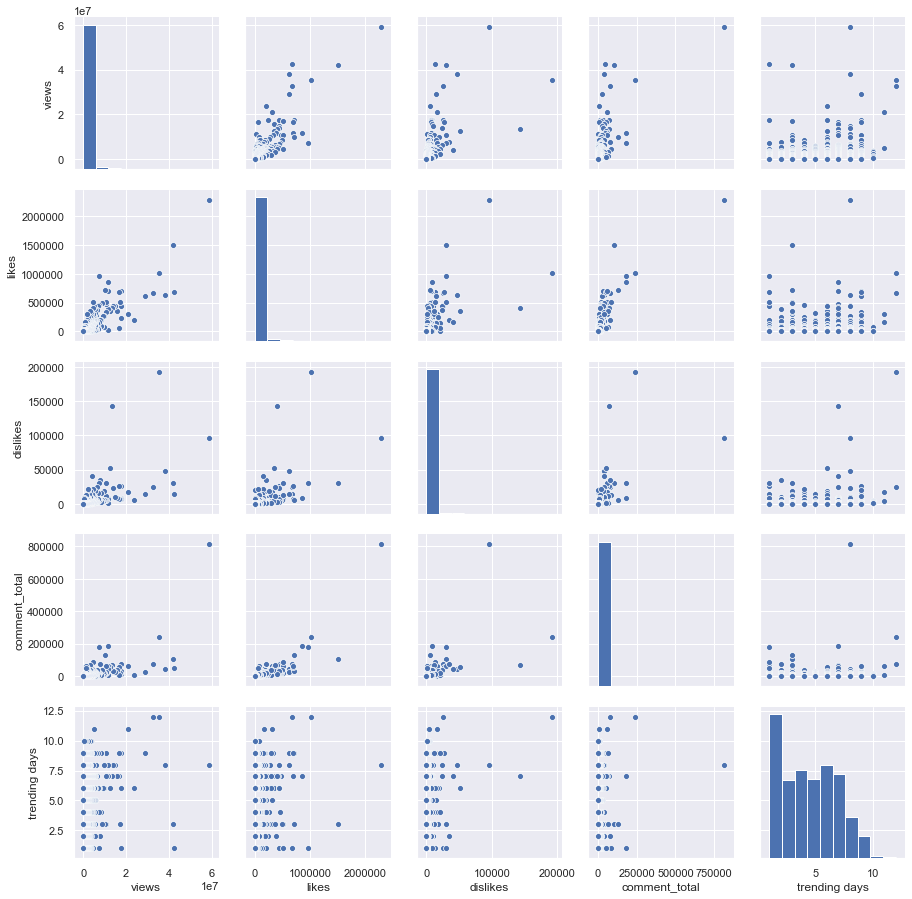

In [114]:
# Extract the Features from the Data
X = pd.DataFrame(GBvideos[["views", "likes", "dislikes", "comment_total", "trending days"]]) 
# Plot the Raw Data on 2D grids
sb.pairplot(X)

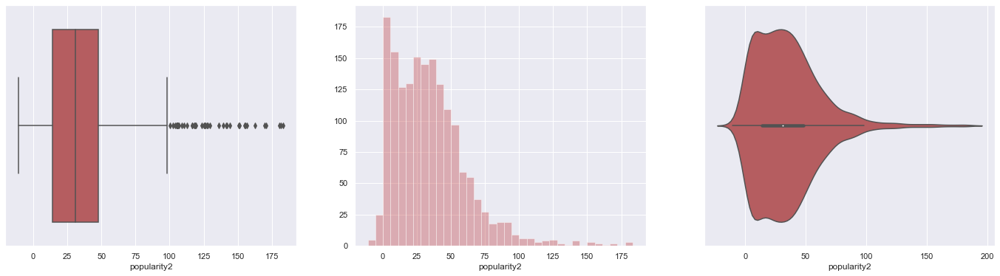

In [115]:
# Draw the distribution of Response
f, axes = plt.subplots(1, 3, figsize=(24, 6))
sb.boxplot(GBvideos['popularity2'], orient = "h", ax = axes[0], color = "r")
sb.distplot(GBvideos['popularity2'], kde = False, ax = axes[1], color = "r")
sb.violinplot(GBvideos['popularity2'], ax = axes[2], color = "r")

In [116]:
# interactive plot for popularity2
trace = go.Histogram(x = GBvideos['popularity2'], histnorm = 'density')
layout = go.Layout(title = 'Popularity2 Distribution')
data = [trace]
fig = go.Figure(data = data, layout = layout)
py.iplot(fig)

In [117]:
# interactive plot for quantile_popularity
trace = go.Histogram(x = GBvideos['quantile_popularity'], histnorm = 'density')
layout = go.Layout(title = 'Quantile Popularity Distribution')
data = [trace]
fig = go.Figure(data = data, layout = layout)
py.iplot(fig)

# Clustering for Further Data Visualisation
### Bi-variate clustering by Kmeans++ 
- views & popularity2 are used because views are seen as the most straightforward way of predicting popularity in general

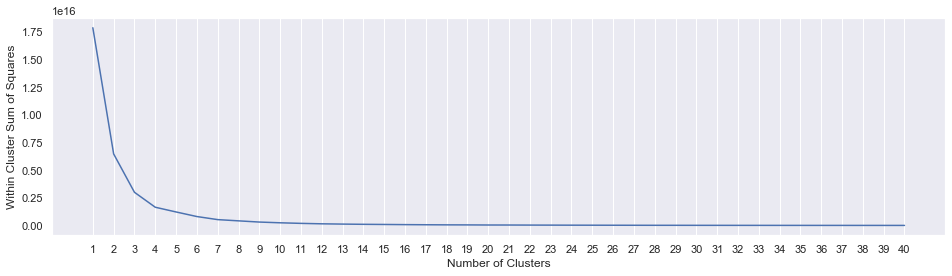

In [118]:
# Import KMeans from sklearn.cluster
from sklearn.cluster import KMeans

# Extract the Features from the Data
X = pd.DataFrame(GBvideos[["views", "popularity2"]])

# Set the Initialization to KMeans++
init_algo = 'k-means++'

# Vary the Number of Clusters
min_clust = 1
max_clust = 40

# Compute Within Cluster Sum of Squares
within_ss = []
for num_clust in range(min_clust, max_clust+1):
    kmeans = KMeans(n_clusters = num_clust,        # number of clusters
                    init = init_algo,              # initialization algorithm
                    n_init = 5)                    # number of initializations
    kmeans.fit(X)
    within_ss.append(kmeans.inertia_)

# Plot Within SS vs Number of Clusters
f, axes = plt.subplots(1, 1, figsize=(16,4))
plt.plot(range(min_clust, max_clust+1), within_ss)
plt.xlabel('Number of Clusters')
plt.ylabel('Within Cluster Sum of Squares')
plt.xticks(np.arange(min_clust, max_clust+1, 1.0))
plt.grid(which='major', axis='y')
plt.show()

Features 	views 	popularity2

Cluster 0:	3732697.29	34.41	
Cluster 1:	440509.06	34.67	
Cluster 2:	39806693.0	23.86	
Cluster 3:	13963895.71	29.76	

Within Cluster Sum of Squares : 1651478215041825.0



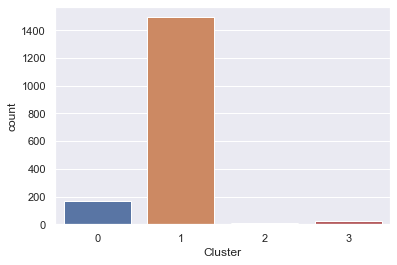

In [119]:
# Set "optimal" Number of Clusters
num_clust = 4

# Set the Initialization to KMeans++
init_algo = 'k-means++'

# Create Clustering Model using KMeans
kmeans = KMeans(n_clusters = num_clust, init = init_algo, n_init = 20)                 

# Fit the Clustering Model on the Data
kmeans.fit(X)

# Print the Cluster Centers
print("Features", "\tviews", "\tpopularity2")
print()

for i, center in enumerate(kmeans.cluster_centers_):
    print("Cluster", i, end=":\t")
    for coord in center:
        print(round(coord, 2), end="\t")
    print()
print()

# Print the Within Cluster Sum of Squares
print("Within Cluster Sum of Squares :", kmeans.inertia_)
print()

# Predict the Cluster Labels
labels = kmeans.predict(X)

# Append Labels to the Data
X_labeled = X.copy()
X_labeled["Cluster"] = pd.Categorical(labels)

# Summary of the Cluster Labels
sb.countplot(X_labeled["Cluster"])

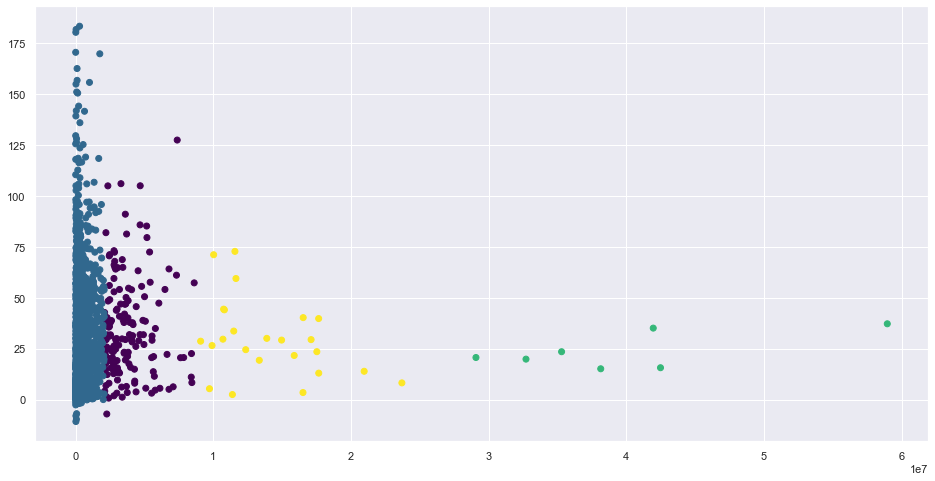

In [120]:
# Visualize the Clusters in the Data
f, axes = plt.subplots(1, 1, figsize=(16,8))
plt.scatter(x = "views", y = "popularity2", c = "Cluster", cmap = 'viridis', data = X_labeled)

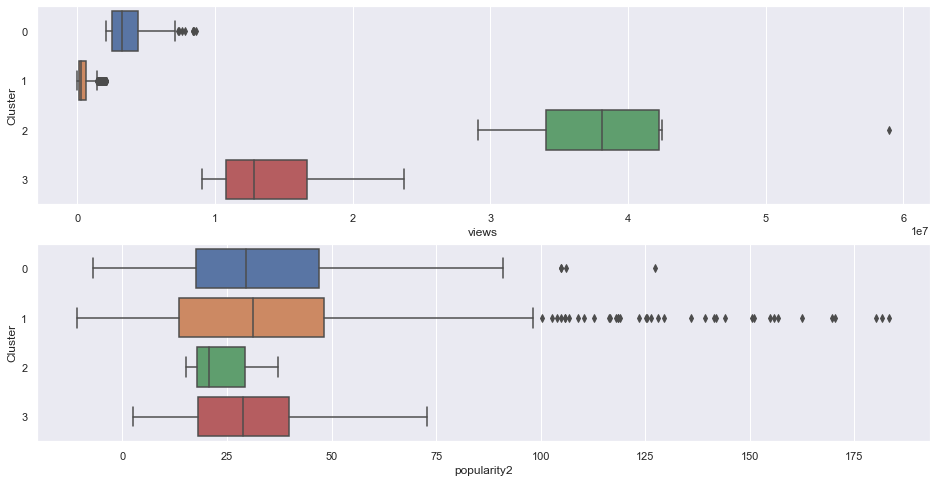

In [121]:
# Boxplots for the Features against the Clusters
f, axes = plt.subplots(2, 1, figsize=(16,8))
sb.boxplot(x = 'views', y = 'Cluster', data = X_labeled, ax = axes[0])
sb.boxplot(x = 'popularity2', y = 'Cluster', data = X_labeled, ax = axes[1])

### Multi-variate Clustering by Kmeans++
- we decided that bi-variate clustering was not enough, thus we decided to use this method to get a better overview of the dataset
- categorical data (ie. Category ID) and non-numerical data (ie comment_text) are not used in clustering 

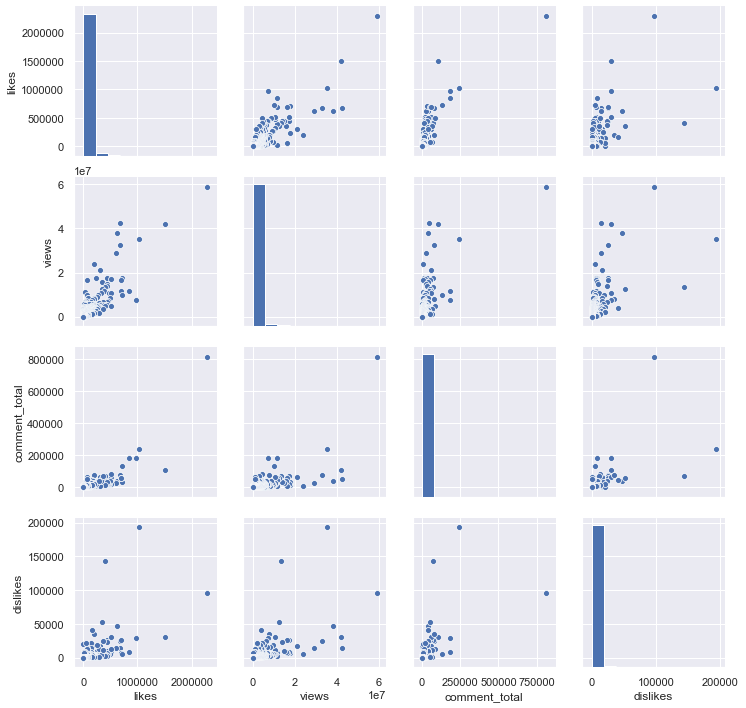

In [99]:
# Extract the Features from the Data
X = pd.DataFrame(GBvideos[["likes", "views", "comment_total", "dislikes"]]) 


# Plot the Raw Data on 2D grids
sb.pairplot(X)

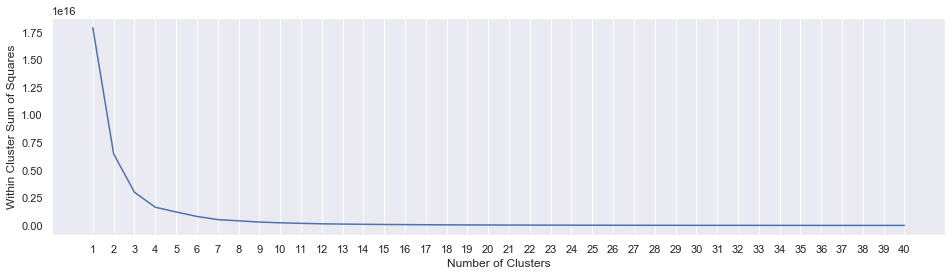

In [100]:
# Vary the Number of Clusters
min_clust = 1
max_clust = 40
init_algo = 'k-means++'

# Compute Within Cluster Sum of Squares
within_ss = []
for num_clust in range(min_clust, max_clust+1):
    kmeans = KMeans(n_clusters = num_clust, init = init_algo, n_init = 5)
    kmeans.fit(X)
    within_ss.append(kmeans.inertia_)

# Angle Plot : Within SS vs Number of Clusters
f, axes = plt.subplots(1, 1, figsize=(16,4))
plt.plot(range(min_clust, max_clust+1), within_ss)
plt.xlabel('Number of Clusters')
plt.ylabel('Within Cluster Sum of Squares')
plt.xticks(np.arange(min_clust, max_clust+1, 1.0))
plt.grid(which='major', axis='y')
plt.show()

In [101]:
# Import essential models from sklearn
from sklearn.cluster import KMeans

# Set "optimal" Clustering Parameters
num_clust = 4
init_algo = 'k-means++'

# Create Clustering Model using KMeans
kmeans = KMeans(n_clusters = num_clust,         
               init = init_algo,
               n_init = 20)                 

# Fit the Clustering Model on the Data
kmeans.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=20, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

Features 	likes 	views 	comment_total 	dislikes

Cluster 0:	15531.83	429599.19	1760.01	460.66	
Cluster 1:	406989.54	13963895.71	44603.75	18682.54	
Cluster 2:	1058046.71	39806693.0	192861.14	59985.14	
Cluster 3:	131397.94	3636601.19	13233.03	4478.36	

Within Cluster Sum of Squares : 1658921490381726.0



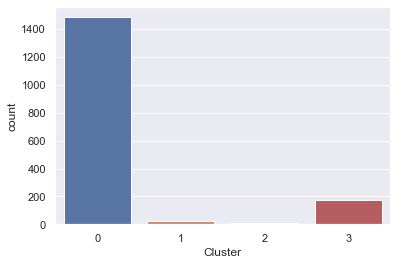

In [102]:
# Print the Cluster Centers
print("Features", "\tlikes", "\tviews", "\tcomment_total", "\tdislikes",)
print()

for i, center in enumerate(kmeans.cluster_centers_):
    print("Cluster", i, end=":\t")
    for coord in center:
        print(round(coord, 2), end="\t")
    print()
print()

# Print the Within Cluster Sum of Squares
print("Within Cluster Sum of Squares :", kmeans.inertia_)
print()

# Predict the Cluster Labels
labels = kmeans.predict(X)

# Append Labels to the Data
X_labeled = X.copy()
X_labeled["Cluster"] = pd.Categorical(labels)

# Summary of the Cluster Labels
sb.countplot(X_labeled["Cluster"])

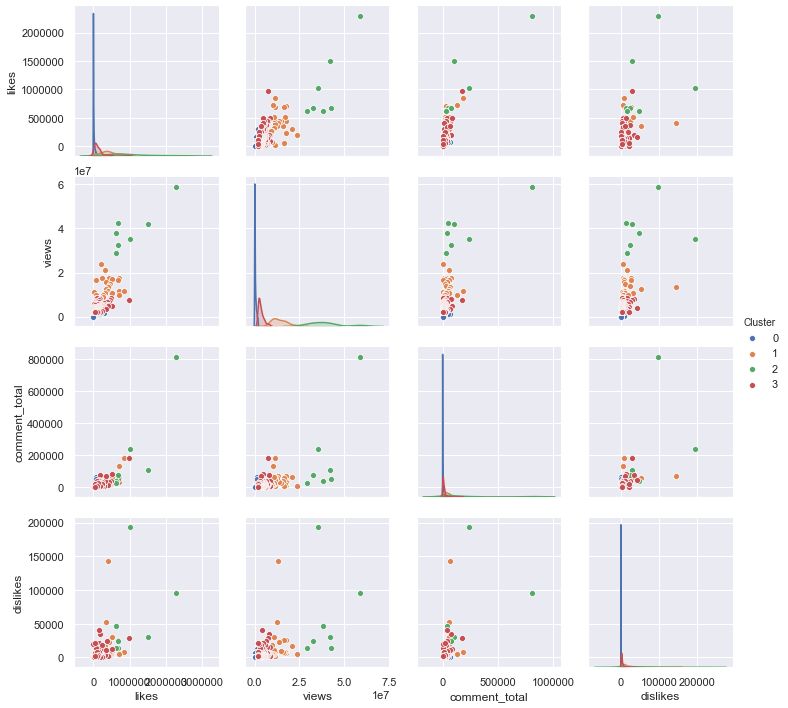

In [103]:
# Plot the Clusters on 2D grids
sb.pairplot(X_labeled, vars = X.columns.values, hue = "Cluster")

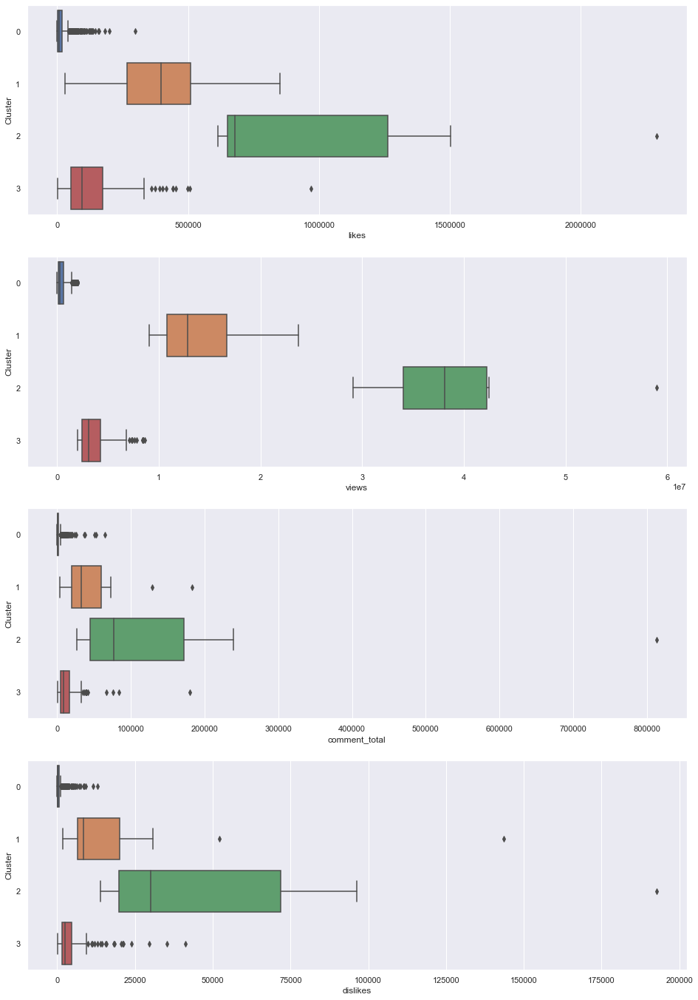

In [104]:
# Boxplots for all Features against the Clusters
f, axes = plt.subplots(4, 1, figsize=(16,24))
sb.boxplot(x = 'likes', y = 'Cluster', data = X_labeled, ax = axes[0])
sb.boxplot(x = 'views', y = 'Cluster', data = X_labeled, ax = axes[1])
sb.boxplot(x = 'comment_total', y = 'Cluster', data = X_labeled, ax = axes[2])
sb.boxplot(x = 'dislikes', y = 'Cluster', data = X_labeled, ax = axes[3])

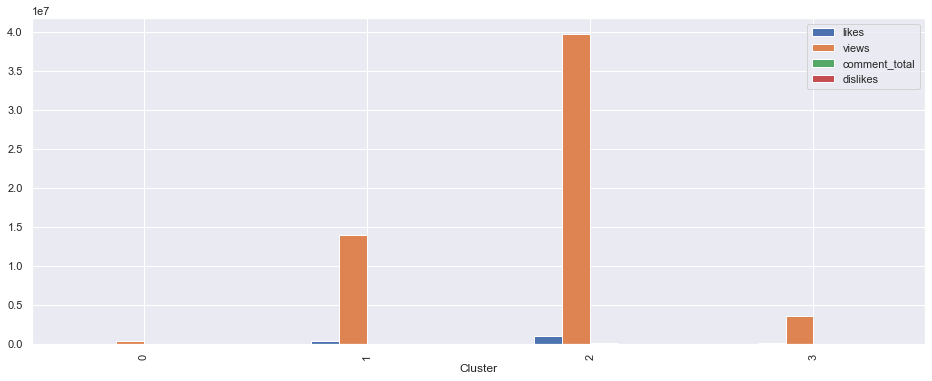

In [105]:
# Average Behaviour of each Cluster
cluster_data = pd.DataFrame(X_labeled.groupby(by = "Cluster").mean())
cluster_data.plot.bar(figsize = (16,6))

# Feature 1: Number of Likes

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6614048934490924

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6690307328605201



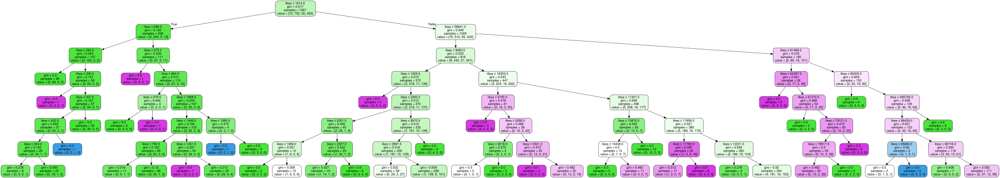

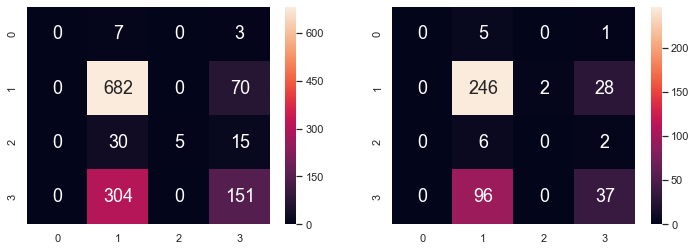

In [143]:
# Recall the Legendary-Total Dataset
QP = pd.DataFrame(GBvideos['quantile_popularity'])   # Response
likes = pd.DataFrame(GBvideos['likes'])       # Predictor

# Split the Legendary-Total Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(likes, QP, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Legendary values corresponding to Total
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# Feature 3: Number of Dislikes

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6298342541436464

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.607565011820331



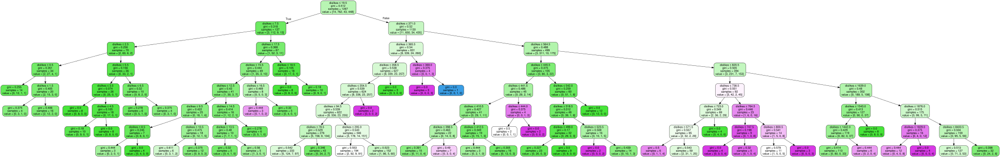

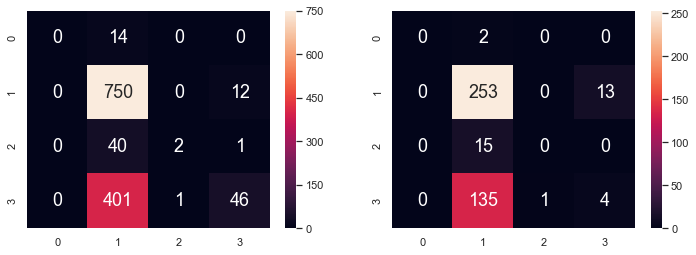

In [144]:
# Recall the Legendary-Total Dataset
QP = pd.DataFrame(GBvideos['quantile_popularity'])   # Response
dislikes = pd.DataFrame(GBvideos['dislikes'])       # Predictor

# Split the Legendary-Total Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(dislikes, QP, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Legendary values corresponding to Total
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)


# Feature 4: Number of Trending Days

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.5982636148382005

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6382978723404256



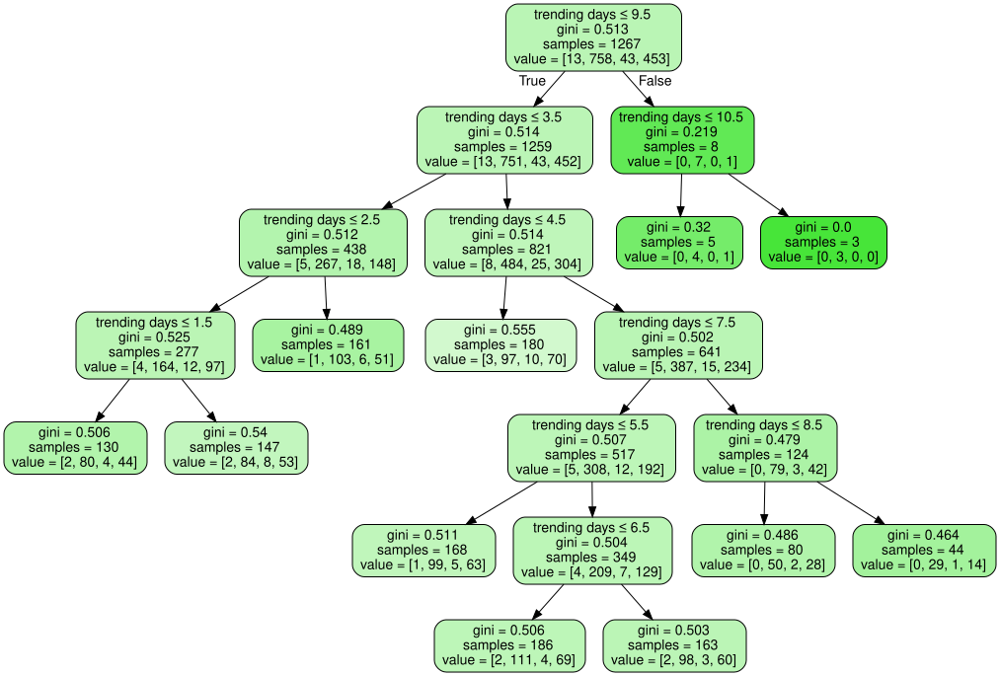

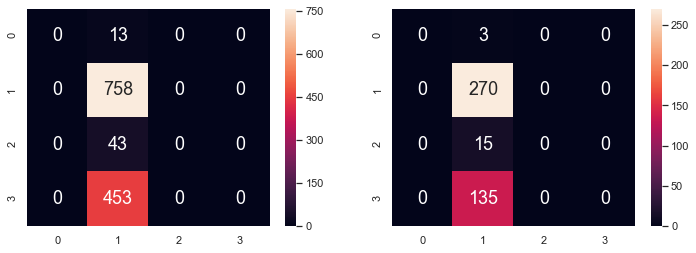

In [145]:
# Recall the Legendary-Total Dataset
QP = pd.DataFrame(GBvideos['quantile_popularity'])   # Response
TD = pd.DataFrame(GBvideos['trending days'])       # Predictor

# Split the Legendary-Total Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(TD, QP, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Legendary values corresponding to Total
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# Feature 5: Total Number of Comments

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6448303078137332

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.5886524822695035



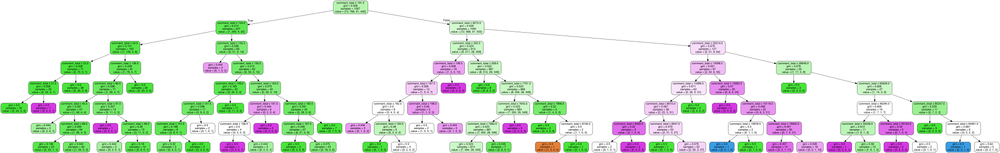

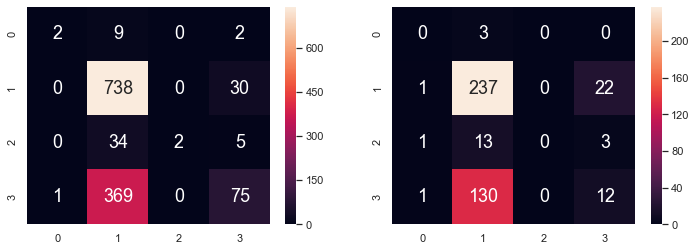

In [146]:
# Recall the Legendary-Total Dataset
QP = pd.DataFrame(GBvideos['quantile_popularity'])   # Response
CT = pd.DataFrame(GBvideos['comment_total'])       # Predictor

# Split the Legendary-Total Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(CT, QP, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Legendary values corresponding to Total
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)


# Feature 6: Average Sentiment Score

In [147]:
import nltk
nltk.download('vader_lexicon')

from nltk.sentiment.vader import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [148]:
#Installing emot library
!pip install emot
#Importing libraries
import re
from emot.emo_unicode import UNICODE_EMO, EMOTICONS


In [149]:
# Function for converting emojis into word
def convert_emojis(text):
    for emot in UNICODE_EMO:
        text = text.replace(emot, " ".join(UNICODE_EMO[emot].replace(",","").replace("_"," ").replace(":","").split()))
    return text

In [150]:
GBcomments['processed text'] = GBcomments['comment_text'].apply(lambda x: convert_emojis(x))
GBcomments

,video_id,comment_text,likes,replies,processed text
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,It's more accurate to call it the M+ (1000) be...
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,To be there with a samsung phone\nface with te...
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,"Thank gosh, a place I can watch it without hav..."
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,What happened to the home button on the iPhone...
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,Power is the disease. Care is the cure. Keep...
...,...,...,...,...,...
718447,lLN1FwiqGwc,MEME ME MEME ME MEME ME,0,0,MEME ME MEME ME MEME ME
718448,lLN1FwiqGwc,"Yeah, but does everybody float?",0,0,"Yeah, but does everybody float?"
718449,lLN1FwiqGwc,That meme me dace 😂,0,0,That meme me dace face with tears of joy
718450,lLN1FwiqGwc,10:43 Is that Miles Upshur????,2,0,10:43 Is that Miles Upshur????


In [151]:
# Function for converting emoticons into word
def convert_emoticons(text):
    for emot in EMOTICONS:
        text = re.sub(u'('+emot+')', " ".join(EMOTICONS[emot].replace(",","").replace("_"," ").split()), text)
    return text

In [152]:
GBcomments['processed text'] = GBcomments['processed text'].apply(lambda x: convert_emoticons(x))

In [153]:
GBcomments

,video_id,comment_text,likes,replies,processed text
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,It's more accurate to call it the M+ (1000Conf...
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,To be there with a samsung phone\nface with te...
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,"Thank gosh, a place I can watch it without hav..."
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,What happened to the home button on the iPhone...
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,Power is the disease. Care is the cure. Keep...
...,...,...,...,...,...
718447,lLN1FwiqGwc,MEME ME MEME ME MEME ME,0,0,MEME ME MEME ME MEME ME
718448,lLN1FwiqGwc,"Yeah, but does everybody float?",0,0,"Yeah, but does everybody float?"
718449,lLN1FwiqGwc,That meme me dace 😂,0,0,That meme me dace face with tears of joy
718450,lLN1FwiqGwc,10:43 Is that Miles Upshur????,2,0,10:43 Is that Miles Upshur????


In [154]:
#add column of sentiment scores for visualisation
GBcomments['pos_score'] = GBcomments['comment_text'].apply(lambda x:sia.polarity_scores(x)['pos'])
GBcomments['neg_score'] = GBcomments['comment_text'].apply(lambda x:sia.polarity_scores(x)['neg'])
GBcomments['neu_score'] = GBcomments['comment_text'].apply(lambda x:sia.polarity_scores(x)['neu'])

# we will use the compound score for further analysis. here the compound score is renamed as sentiment score
GBcomments['sentiment_scores'] = GBcomments['comment_text'].apply(lambda x:sia.polarity_scores(x)['compound'])
GBcomments.head()

,video_id,comment_text,likes,replies,processed text,pos_score,neg_score,neu_score,sentiment_scores
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,It's more accurate to call it the M+ (1000Conf...,0.000,0.0,1.000,0.0000
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,To be there with a samsung phone\nface with te...,0.000,0.0,1.000,0.0000
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,"Thank gosh, a place I can watch it without hav...",0.257,0.0,0.743,0.6369
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,What happened to the home button on the iPhone...,0.000,0.0,1.000,0.0000
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,Power is the disease. Care is the cure. Keep...,0.358,0.0,0.642,0.8910


In [155]:
#create new dataframe for number of comments per video
number_comments = GBcomments['video_id'].value_counts().rename_axis('video_id').reset_index(name='number_comments')
number_comments

,video_id,number_comments
0,LunHybOKIjU,1200
1,Q0CbN8sfihY,1199
2,t3AVtQkEHaE,1100
3,r9-DM9uBtVI,1050
4,uE6iQ5HiJts,1000
...,...,...
1687,N7Ad6v6Q9yg,4
1688,35zynOrkvMk,3
1689,jNb0vRORLAw,2
1690,utPFb_tNARo,2


In [156]:
#create new dataframe for total number of positive comments per video
total_GB = GBcomments.groupby(['video_id'], sort = False).sum()
total_GB

,likes,replies,pos_score,neg_score,neu_score,sentiment_scores
video_id,,,,,,
jt2OHQh0HoQ,55,71,46.745,24.148,327.104,34.9660
YPVcg45W0z4,57,23,135.686,34.981,624.322,158.4860
T_PuZBdT2iM,125,26,102.375,53.108,640.523,61.9089
NsjsmgmbCfc,17,1,57.236,7.994,233.767,96.5329
zZ2CLmvqfXg,351,35,132.609,41.677,519.716,147.2431
...,...,...,...,...,...,...
NGPK44en2ME,49,0,5.771,2.400,91.829,1.8842
ibHFy-mo4Pw,161,0,19.397,7.187,73.416,18.5644
NRjDqw1w7k8,223,9,18.847,4.912,74.240,18.1309


In [157]:
#merge total and number_comments dataframes 
total_GB = pd.merge(total_GB, number_comments, on = 'video_id')
total_GB = total_GB.drop(columns='likes')
total_GB = total_GB.drop(columns='replies')
total_GB.head()

,video_id,pos_score,neg_score,neu_score,sentiment_scores,number_comments
0,jt2OHQh0HoQ,46.745,24.148,327.104,34.9660,400
1,YPVcg45W0z4,135.686,34.981,624.322,158.4860,795
2,T_PuZBdT2iM,102.375,53.108,640.523,61.9089,800
3,NsjsmgmbCfc,57.236,7.994,233.767,96.5329,299
4,zZ2CLmvqfXg,132.609,41.677,519.716,147.2431,700


In [158]:
#add column of average sentiment
total_GB['average_sentiment'] = total_GB['sentiment_scores'].div(total_GB['number_comments'].values, axis=0)
total_GB.head()

,video_id,pos_score,neg_score,neu_score,sentiment_scores,number_comments,average_sentiment
0,jt2OHQh0HoQ,46.745,24.148,327.104,34.9660,400,0.087415
1,YPVcg45W0z4,135.686,34.981,624.322,158.4860,795,0.199353
2,T_PuZBdT2iM,102.375,53.108,640.523,61.9089,800,0.077386
3,NsjsmgmbCfc,57.236,7.994,233.767,96.5329,299,0.322853
4,zZ2CLmvqfXg,132.609,41.677,519.716,147.2431,700,0.210347


In [159]:
#add average sentiment column into GBvideos dataframe
GBvideos = pd.merge(GBvideos, total_GB, on = 'video_id')
GBvideos.head(30)

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days,popularity,popularity2,quantile_popularity,pos_score,neg_score,neu_score,sentiment_scores,number_comments,average_sentiment
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,58961407,2289911,96258,813322,26.09,8,38.837455,37.204896,low,124.537,35.707,630.754,133.7691,800,0.167211
1,QeaumjX9DNY,Yandel - Como Antes (Official Video) ft. Wisin,YandelVEVO,10,Wisinyyandel|wisin&yandel|yandelywisin|yandel&...,42486342,678389,13995,48429,15.09,1,15.967225,15.637825,low,5.474,2.501,92.026,0.8273,100,0.008273
2,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,41959549,1502097,30036,104931,15.09,3,35.798693,35.082860,low,70.088,11.884,218.028,81.3339,300,0.271113
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,38144440,624008,47220,41131,23.09,8,16.359081,15.121155,low,98.260,30.942,665.797,74.1874,800,0.092734
4,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,35300501,1022015,192725,238974,22.10,12,28.951855,23.492301,low,158.949,172.547,861.518,-45.2562,1200,-0.037714
5,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,32714551,674617,25022,76503,21.10,12,20.621313,19.856455,low,171.700,121.274,897.022,65.6179,1199,0.054727
6,J_ub7Etch2U,Sam Smith - Too Good At Goodbyes (Official Video),SamSmithWorldVEVO,10,Sam|Smith|Too|Good|At|Goodbyes|Capitol|Pop|sam...,29080061,615290,14640,26738,27.09,9,21.158484,20.655046,low,205.193,70.744,616.071,197.4500,900,0.219389
7,gmc4tkVJow8,"De La Ghetto, Daddy Yankee, Ozuna & Chris Jeda...",Warner Music,10,de la ghetto|daddy yankee|ozuna|la formula|del...,23699605,199904,5706,7961,22.09,6,8.434909,8.194145,low,31.463,15.061,549.476,12.3688,600,0.020615
8,r9-DM9uBtVI,JUSTICE LEAGUE - Official Heroes Trailer,Warner Bros. Pictures,24,justice league|justice league movie|batman|won...,20959406,308120,16864,61809,19.10,11,14.700798,13.896195,low,179.922,103.596,762.494,117.4843,1050,0.111890
9,t2oVUxTV4WA,Celebrities Read Mean Tweets #11,Jimmy Kimmel Live,23,jimmy|jimmy kimmel|jimmy kimmel live|late nigh...,17659415,238167,8890,10912,3.10,6,13.486687,12.983273,low,126.844,59.298,506.861,96.0964,699,0.137477


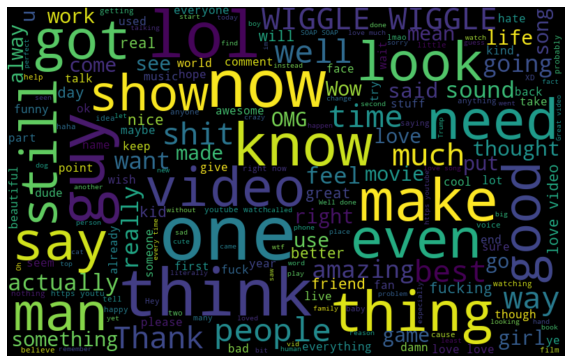

In [160]:
all_words = ' '.join([text for text in GBcomments['comment_text']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.7134964483030781

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6477541371158393



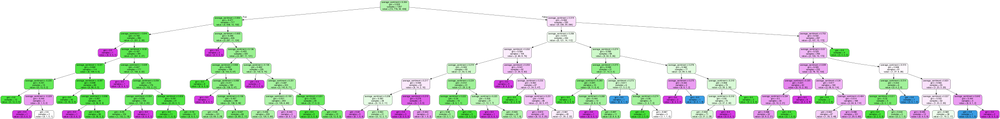

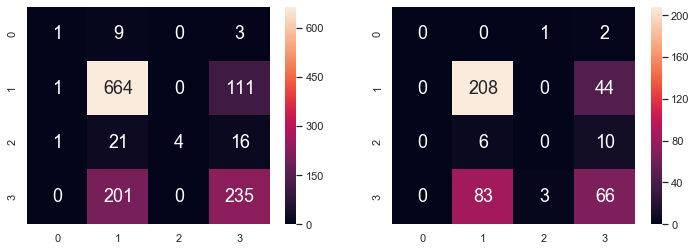

In [161]:
QP = pd.DataFrame(GBvideos['quantile_popularity'])   # Response
AS = pd.DataFrame(GBvideos['average_sentiment'])       # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(AS, QP, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict response values corresponding to predictor
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# Feature 7: Percentage of Positive Comments over Total Number of Comments

In [162]:
#Categorize positive, negative, neutral
GBcomments['Sentiment'] = GBcomments['sentiment_scores'].apply(lambda s : 'Positive' if s > 0 else ('Neutral' if s == 0 else 'Negative'))
GBcomments.head(20)

,video_id,comment_text,likes,replies,processed text,pos_score,neg_score,neu_score,sentiment_scores,Sentiment
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,It's more accurate to call it the M+ (1000Conf...,0.000,0.000,1.000,0.0000,Neutral
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,To be there with a samsung phone\nface with te...,0.000,0.000,1.000,0.0000,Neutral
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,"Thank gosh, a place I can watch it without hav...",0.257,0.000,0.743,0.6369,Positive
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,What happened to the home button on the iPhone...,0.000,0.000,1.000,0.0000,Neutral
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,Power is the disease. Care is the cure. Keep...,0.358,0.000,0.642,0.8910,Positive
5,jt2OHQh0HoQ,Keep calm and buy iphone 8 Keep calm and buy i...,0,0,Keep calm and buy iphone 8 Keep calm and buy i...,0.277,0.000,0.723,0.7096,Positive
6,jt2OHQh0HoQ,i am a big fan of youtube and u !!!!!!!!!!!!!,0,0,i am a big fan of youtube and u !!!!!!!!!!!!!,0.366,0.000,0.634,0.5374,Positive
7,jt2OHQh0HoQ,You will never find Losers who line up and pay...,0,0,You will never find Losers who line up and pay...,0.275,0.143,0.583,0.6219,Positive
8,jt2OHQh0HoQ,*APPLE JUST COMMENTED ON MY LAST VIDEO* I'm cr...,0,0,*APPLE JUST COMMENTED ON MY LAST VIDEO* I'm cr...,0.000,0.220,0.780,-0.4767,Negative
9,jt2OHQh0HoQ,"I'm only here to see Emma, I love her so much!...",0,0,"I'm only here to see Emma, I love her so much!...",0.475,0.000,0.525,0.9149,Positive


In [163]:
#percentage of comments which are positive in all the videos
positive_percent = []
for i in range(0,GBcomments.video_id.nunique()):
    a = GBcomments[(GBcomments.video_id == GBcomments.video_id.unique()[i]) & (GBcomments.Sentiment == 'Positive')].count()[0]
    b = GBcomments[GBcomments.video_id == GBcomments.video_id.unique()[i]]['Sentiment'].value_counts().sum()
    Percentage = (a/b)*100
    positive_percent.append(round(Percentage,2))

positive_percent

[29.5,
 49.56,
 33.12,
 55.18,
 50.43,
 36.0,
 44.31,
 76.67,
 40.25,
 17.0,
 45.0,
 54.0,
 47.0,
 42.25,
 78.0,
 40.89,
 74.75,
 27.0,
 44.89,
 33.29,
 76.83,
 42.71,
 78.0,
 37.45,
 21.25,
 77.67,
 63.57,
 39.0,
 25.0,
 68.83,
 76.67,
 43.5,
 40.33,
 41.0,
 56.0,
 42.8,
 30.0,
 20.69,
 26.6,
 47.67,
 25.33,
 56.34,
 49.5,
 64.5,
 72.67,
 54.0,
 33.88,
 43.83,
 59.0,
 36.84,
 39.0,
 33.2,
 66.67,
 63.6,
 21.54,
 41.5,
 49.5,
 34.83,
 77.0,
 79.26,
 53.5,
 43.0,
 47.25,
 42.89,
 65.25,
 55.25,
 80.0,
 47.5,
 26.0,
 30.25,
 57.0,
 52.5,
 55.27,
 64.75,
 23.74,
 71.0,
 78.25,
 33.67,
 42.75,
 46.0,
 48.67,
 29.67,
 37.33,
 46.5,
 38.33,
 53.33,
 54.12,
 41.0,
 18.0,
 53.33,
 41.5,
 51.75,
 10.5,
 54.0,
 53.85,
 34.67,
 36.58,
 38.05,
 31.65,
 40.0,
 45.0,
 34.33,
 30.67,
 35.29,
 43.0,
 50.0,
 67.0,
 49.33,
 72.0,
 54.35,
 24.67,
 62.5,
 30.0,
 64.0,
 32.67,
 32.14,
 54.0,
 48.48,
 31.67,
 45.33,
 71.0,
 61.5,
 47.0,
 32.0,
 34.23,
 48.0,
 19.5,
 29.8,
 77.0,
 48.5,
 55.52,
 0.0,
 58.0,


In [164]:
#Creating dataframe for positive percentage
positive_percentage = pd.DataFrame(positive_percent,GBcomments.video_id.unique()).reset_index()
positive_percentage.columns = ['video_id','Positive Percentage']
positive_percentage

,video_id,Positive Percentage
0,jt2OHQh0HoQ,29.50
1,YPVcg45W0z4,49.56
2,T_PuZBdT2iM,33.12
3,NsjsmgmbCfc,55.18
4,zZ2CLmvqfXg,50.43
...,...,...
1687,NGPK44en2ME,13.00
1688,ibHFy-mo4Pw,47.00
1689,NRjDqw1w7k8,41.00
1690,K2SCpgCurVQ,36.36


In [165]:
#add positive percentage column into USvideos dataframe
GBvideos = pd.merge(GBvideos, positive_percentage, on = 'video_id')
GBvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,...,popularity,popularity2,quantile_popularity,pos_score,neg_score,neu_score,sentiment_scores,number_comments,average_sentiment,Positive Percentage
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,58961407,2289911,96258,813322,26.09,...,38.837455,37.204896,low,124.537,35.707,630.754,133.7691,800,0.167211,36.62
1,QeaumjX9DNY,Yandel - Como Antes (Official Video) ft. Wisin,YandelVEVO,10,Wisinyyandel|wisin&yandel|yandelywisin|yandel&...,42486342,678389,13995,48429,15.09,...,15.967225,15.637825,low,5.474,2.501,92.026,0.8273,100,0.008273,16.00
2,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,41959549,1502097,30036,104931,15.09,...,35.798693,35.082860,low,70.088,11.884,218.028,81.3339,300,0.271113,49.33
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,38144440,624008,47220,41131,23.09,...,16.359081,15.121155,low,98.260,30.942,665.797,74.1874,800,0.092734,26.62
4,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,35300501,1022015,192725,238974,22.10,...,28.951855,23.492301,low,158.949,172.547,861.518,-45.2562,1200,-0.037714,33.58


In [166]:
all_words_posi = ' '.join([text for text in GBcomments['comment_text'][GBcomments.Sentiment == 'Positive']])

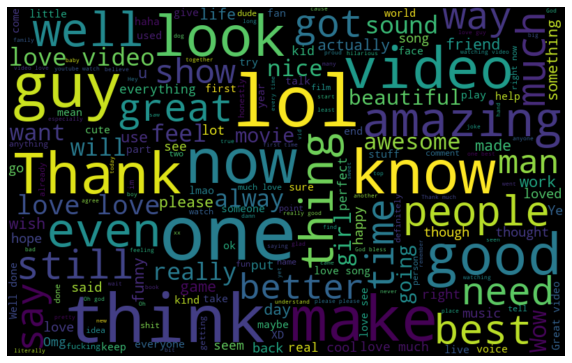

In [167]:
# visulise words used in positive comments
wordcloud_posi = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words_posi)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud_posi, interpolation="bilinear")
plt.axis('off')
plt.show()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6945540647198106

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6808510638297872



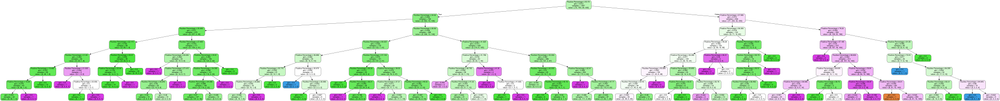

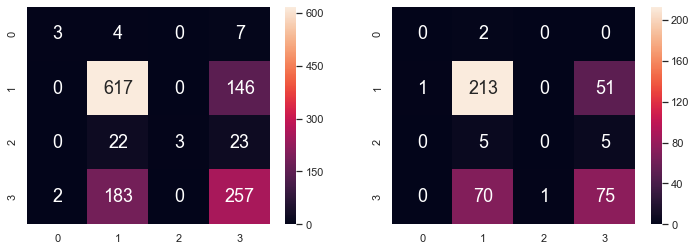

In [168]:
QP = pd.DataFrame(GBvideos['quantile_popularity'])   # Response
PP = pd.DataFrame(GBvideos['Positive Percentage'])       # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(PP, QP, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict response values corresponding to predictor
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# Feature 8: Percentage of Negative Comments over Total Number of Comments

In [169]:
#percentage of comments which are negative in all the videos
negative_percent = []
for i in range(0,GBcomments.video_id.nunique()):
    a = GBcomments[(GBcomments.video_id == GBcomments.video_id.unique()[i]) & (GBcomments.Sentiment == 'Negative')].count()[0]
    b = GBcomments[GBcomments.video_id == GBcomments.video_id.unique()[i]]['Sentiment'].value_counts().sum()
    Percentage = (a/b)*100
    negative_percent.append(round(Percentage,2))

negative_percent

[15.0,
 15.35,
 18.88,
 6.69,
 15.29,
 20.75,
 18.02,
 7.33,
 17.25,
 18.0,
 18.33,
 17.67,
 27.0,
 21.5,
 7.5,
 19.44,
 13.25,
 28.0,
 17.27,
 24.2,
 4.83,
 35.29,
 5.29,
 41.77,
 60.25,
 7.33,
 6.57,
 28.0,
 32.25,
 2.0,
 10.67,
 15.17,
 27.67,
 28.71,
 13.33,
 30.6,
 56.0,
 0.0,
 46.4,
 19.33,
 40.67,
 7.4,
 10.17,
 6.25,
 6.67,
 5.25,
 17.5,
 24.67,
 15.67,
 22.81,
 23.0,
 28.4,
 7.67,
 9.6,
 3.51,
 28.75,
 27.25,
 44.0,
 9.0,
 2.66,
 21.25,
 17.5,
 24.75,
 30.96,
 26.0,
 4.5,
 8.0,
 20.5,
 32.0,
 19.75,
 16.0,
 30.0,
 7.71,
 14.25,
 19.19,
 7.0,
 6.5,
 34.67,
 21.0,
 18.0,
 18.0,
 26.0,
 36.33,
 9.25,
 38.67,
 16.84,
 28.24,
 21.5,
 21.0,
 20.0,
 18.0,
 28.75,
 16.5,
 15.0,
 21.15,
 35.67,
 35.57,
 7.07,
 31.31,
 60.0,
 11.0,
 20.33,
 33.0,
 23.53,
 13.67,
 7.0,
 6.0,
 9.67,
 6.0,
 13.04,
 24.33,
 0.0,
 5.0,
 3.0,
 43.33,
 21.43,
 19.0,
 31.82,
 20.0,
 18.33,
 6.0,
 5.5,
 8.67,
 53.0,
 26.85,
 13.0,
 24.0,
 25.25,
 14.0,
 19.5,
 9.03,
 50.0,
 17.0,
 15.5,
 15.33,
 6.33,
 18.0,
 34

In [170]:
#Creating dataframe for negative percentage
negative_percentage = pd.DataFrame(negative_percent,GBcomments.video_id.unique()).reset_index()
negative_percentage.columns = ['video_id','Negative Percentage']
negative_percentage

,video_id,Negative Percentage
0,jt2OHQh0HoQ,15.00
1,YPVcg45W0z4,15.35
2,T_PuZBdT2iM,18.88
3,NsjsmgmbCfc,6.69
4,zZ2CLmvqfXg,15.29
...,...,...
1687,NGPK44en2ME,14.00
1688,ibHFy-mo4Pw,17.00
1689,NRjDqw1w7k8,9.00
1690,K2SCpgCurVQ,18.18


In [171]:
#add negative percentage column into USvideos dataframe
GBvideos = pd.merge(GBvideos, negative_percentage, on = 'video_id')
GBvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,...,popularity2,quantile_popularity,pos_score,neg_score,neu_score,sentiment_scores,number_comments,average_sentiment,Positive Percentage,Negative Percentage
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,58961407,2289911,96258,813322,26.09,...,37.204896,low,124.537,35.707,630.754,133.7691,800,0.167211,36.62,10.12
1,QeaumjX9DNY,Yandel - Como Antes (Official Video) ft. Wisin,YandelVEVO,10,Wisinyyandel|wisin&yandel|yandelywisin|yandel&...,42486342,678389,13995,48429,15.09,...,15.637825,low,5.474,2.501,92.026,0.8273,100,0.008273,16.00,15.00
2,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,41959549,1502097,30036,104931,15.09,...,35.082860,low,70.088,11.884,218.028,81.3339,300,0.271113,49.33,9.67
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,38144440,624008,47220,41131,23.09,...,15.121155,low,98.260,30.942,665.797,74.1874,800,0.092734,26.62,13.12
4,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,35300501,1022015,192725,238974,22.10,...,23.492301,low,158.949,172.547,861.518,-45.2562,1200,-0.037714,33.58,37.33


In [172]:
all_words_nega = ' '.join([text for text in GBcomments['comment_text'][GBcomments.Sentiment == 'Negative']])

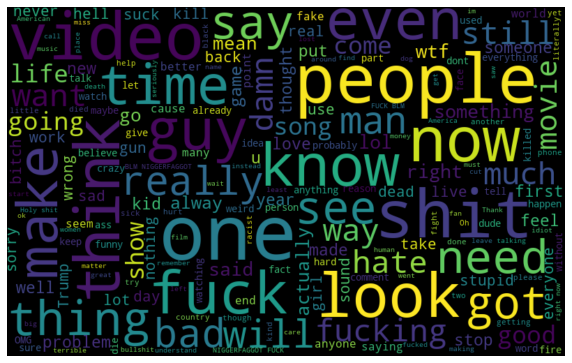

In [173]:
# visualise words used in negative comments
wordcloud_nega = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words_nega)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud_nega, interpolation="bilinear")
plt.axis('off')
plt.show()

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.6850828729281768

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.6501182033096927



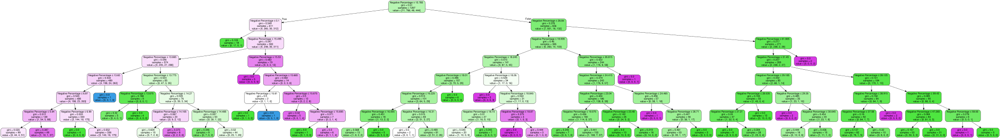

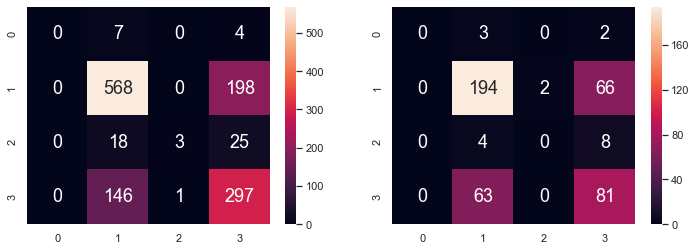

In [174]:
QP = pd.DataFrame(GBvideos['quantile_popularity'])   # Response
NP = pd.DataFrame(GBvideos['Negative Percentage'])       # Predictor

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(NP, QP, test_size = 0.25)

# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 7)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict response values corresponding to predictor
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# Multivariate Classification

In [299]:
# Extract Response and Predictors
y = pd.DataFrame(GBvideos["quantile_popularity"])
X = pd.DataFrame(GBvideos[["likes", "views", "comment_total", "dislikes", "average_sentiment", "trending days", "Positive Percentage", "Negative Percentage"]])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Check the sample sizes
print("Train Set :", y_train.shape, X_train.shape)
print("Test Set  :", y_test.shape, X_test.shape)

Train Set : (1267, 1) (1267, 8)
Test Set  : (423, 1) (423, 8)


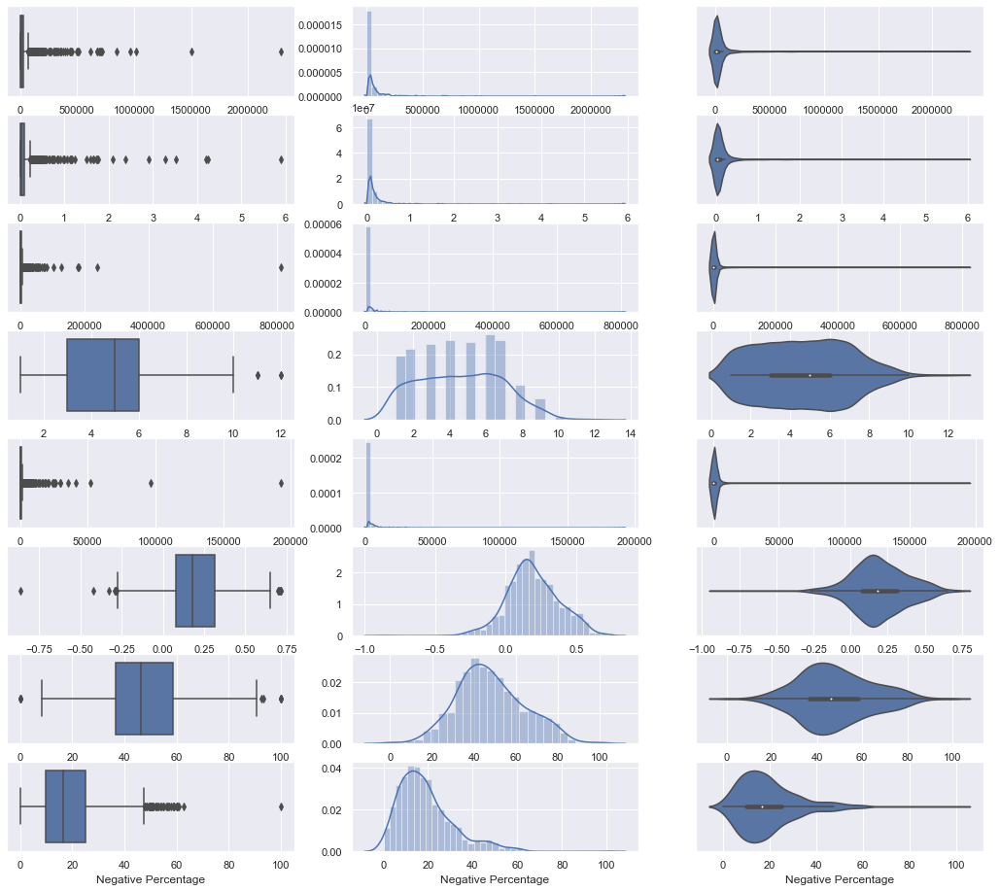

In [177]:
# Draw the distributions of all Predictors
f, axes = plt.subplots(8, 3, figsize=(18, 16))

count = 0
for var in X_train:
    sb.boxplot(X_train[var], orient = "h", ax = axes[count,0])
    sb.distplot(X_train[var], ax = axes[count,1])
    sb.violinplot(X_train[var], ax = axes[count,2])
    count += 1

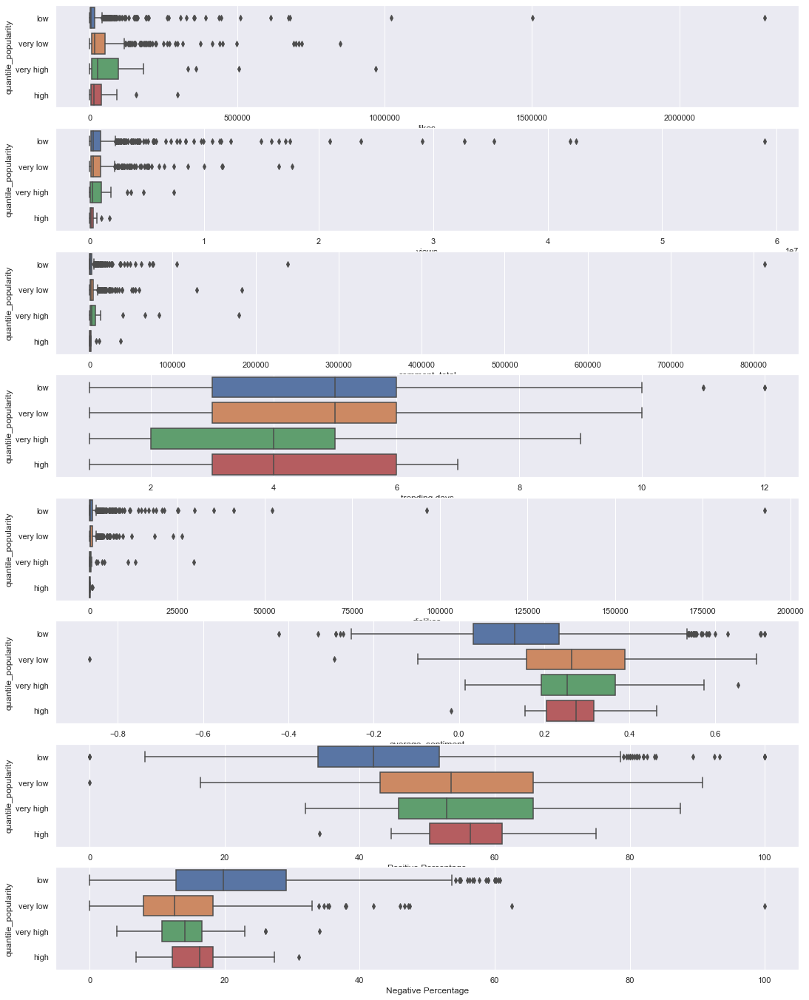

In [178]:
# Relationship between Response and the Predictors
trainDF = pd.concat([y_train, X_train.reindex(index=y_train.index)], sort = False, axis = 1)

f, axes = plt.subplots(8, 1, figsize=(18, 24))

count = 0
for var in X_train:
    sb.boxplot(x = var, y = "quantile_popularity", data = trainDF, orient = "h", ax = axes[count])
    count += 1

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9747434885556433

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.8250591016548463



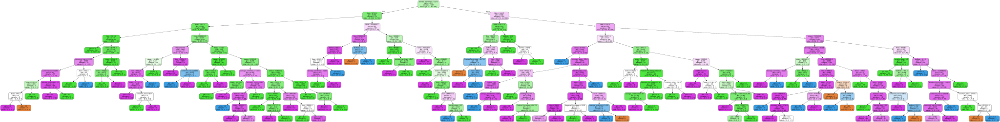

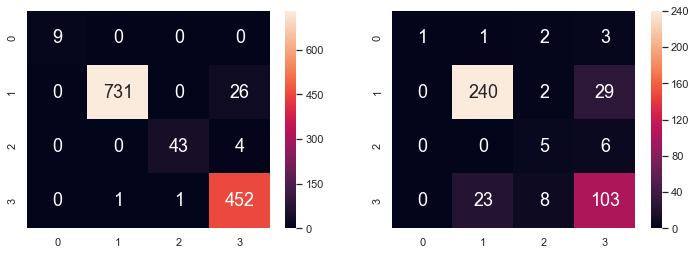

In [300]:
# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 10)  # create the decision tree object
dectree.fit(X_train, y_train)                    # train the decision tree model

# Predict Response corresponding to Predictors
y_train_pred = dectree.predict(X_train)
y_test_pred = dectree.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", dectree.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", dectree.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Plot the Decision Tree
treedot = export_graphviz(dectree,                                      # the model
                          feature_names = X_train.columns,              # the features 
                          out_file = None,                              # output file
                          filled = True,                                # node colors
                          rounded = True,                               # make pretty
                          special_characters = True)                    # postscript

graphviz.Source(treedot)

# Random Forest

In [296]:
# Extract Response and Predictors
y = pd.DataFrame(GBvideos["quantile_popularity"])
X = pd.DataFrame(GBvideos[["likes", "views", "comment_total", "dislikes", "average_sentiment","trending days", "Positive Percentage", "Negative Percentage"]])

# Split the Dataset into Train and Test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

# Check the sample sizes
print("Train Set :", y_train.shape, X_train.shape)
print("Test Set  :", y_test.shape, X_test.shape)

Train Set : (1267, 1) (1267, 8)
Test Set  : (423, 1) (423, 8)


In [297]:
# Import RandomForestClassifier model from Scikit-Learn
from sklearn.ensemble import RandomForestClassifier

# Create the Random Forest object
rforest = RandomForestClassifier(n_estimators = 100,  # n_estimators denote number of trees
                                 max_depth = 10)  # set the maximum depth of each tree

# Fit Random Forest on Train Data
rforest.fit(X_train, y_train.values.ravel())

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=10, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.9826361483820047

Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.7966903073286052



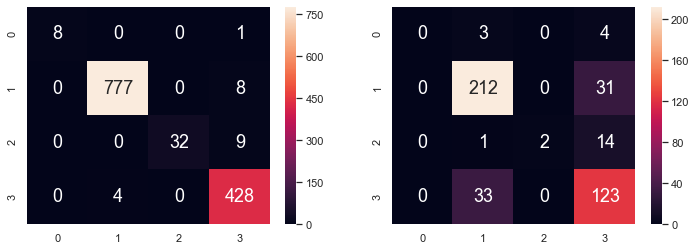

In [298]:
# Import confusion_matrix from Scikit-Learn
from sklearn.metrics import confusion_matrix

# Predict 0/1 values corresponding to message
y_train_pred = rforest.predict(X_train)
y_test_pred = rforest.predict(X_test)

# Check the Goodness of Fit (on Train Data)
print("Goodness of Fit of Model \tTrain Dataset")
print("Classification Accuracy \t:", rforest.score(X_train, y_train))
print()

# Check the Goodness of Fit (on Test Data)
print("Goodness of Fit of Model \tTest Dataset")
print("Classification Accuracy \t:", rforest.score(X_test, y_test))
print()

# Plot the Confusion Matrix for Train and Test
f, axes = plt.subplots(1, 2, figsize=(12, 4))
sb.heatmap(confusion_matrix(y_train, y_train_pred),
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[0])
sb.heatmap(confusion_matrix(y_test, y_test_pred), 
           annot = True, fmt=".0f", annot_kws={"size": 18}, ax = axes[1])

# Analysis

### 1. Comparing US and GB Datasets

In [255]:
print("Number of unique USvideos:", USvideos['video_id'].count())
print("Number of unique GBvideos:", GBvideos['video_id'].count())

Number of unique USvideos: 2264
Number of unique GBvideos: 1690


In [214]:
x0 = USvideos['popularity2']
x1 = GBvideos['popularity2']

fig = go.Figure()
# Use x instead of y argument for horizontal plot
fig.add_trace(go.Box(x=x0, name = "USvideos"))
fig.add_trace(go.Box(x=x1, name = "GBvideos"))

fig.show()

In [256]:
x0 = USvideos['popularity2']
x1 = GBvideos['popularity2']

fig = go.Figure()
fig.add_trace(go.Histogram(x=x0 , name = "USvideos"))
fig.add_trace(go.Histogram(x=x1, name = "GBvideos"))
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

### 2. Choice of Response

#### 2a) Definition

We defined popular as **(likes-dislikes)/views** (termed as **popularity2** in our dataset).

This was subjective as we based it on our instincts as to what might be the best response to use for this dataset. However, we felt that this was the most appropriate response after carrying out Spearman Correlation Ranking as we have normalised it.

#### 2b) Spearman’s rank correlation vs Pearson’s rank correlation? 
The Spearman correlation evaluates the monotonic relationship between two continuous or ordinal variables. In a monotonic relationship, the variables tend to change together, but not necessarily at a constant rate. The Spearman correlation coefficient is based on the ranked values for each variable rather than the raw data.
Since we are trying to find the best response variable for our project, we want to use a response variable that is based on the relationships of the variables rather than the raw data since the raw data between the most views and next most views could fluctuate a lot.

### 3. Duplicates

By sorting the dataset according to views (highest at the top), we found out that there are duplicted videos. Since the dataset consists of videos that have been trending for 30 days, duplicated videos happen because some videos have been trending for more than 1 day. Hence, we took into account of this and removed all the duplicated videos, leaving only the latest one. 

### 4. Categorical Data for Response

We have also recognised that single, multivariate decision trees require the response (ie popularity2) to be discrete/categorised. However, popularity2 is a continuous variable.

Hence, we brought in **quantile_popularity** which splits popularity2 into 4 catogories by their quartile. Each quartile has the same range, but might not have the same number of videos. The categories are: "very low", "low", "high", "very high".

However, one limitation of quantile_popularity is that there is an **uneven distribution** of videos in the 4 categories for quantile_popularity. As can be seen below, the category "high", has only 16 videos. 

This meant that the trained data for this category might not be very reliable and accurate. Results might be more biased towards videos with "very low" quantile_popularity as there is a larger dataset for it to be trained and tested on.

In [215]:
# interactive plot for quantile_popularity
trace = go.Histogram(x = USvideos['quantile_popularity'], histnorm = 'density')
layout = go.Layout(title = 'Quantile Popularity Distribution')
data = [trace]
fig = go.Figure(data = data, layout = layout)
py.iplot(fig)

### 5. Anomaly
#### 5a) Separate Analysis for anomaly1 in USvideos

In [217]:
anomaly1

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,trending days,views_rank,likes_rank,popularity,popularity2,popularity_rank,popularity2_rank
1048,tteLMfFDCb4,Hillary Clinton speaks,CBS Sunday Morning,25,CBS Sunday Morning|CBS News|news|On The Road|H...,368018,3531,24306,6466,15.09,3,1024.0,1024.0,9.594639,-56.451043,1767.0,2265.0


From the value of popularity2 and the difference between likes and dislikes, we can infer that this video is not well received. Let's take a look at the comments below.

In [218]:
#Analysis on Anomaly1

anomaly1_comments = UScomments.loc[UScomments['video_id']== anomaly1.iloc[0]['video_id']]
anomaly1_comments

,video_id,comment_text,likes,replies,processed text,pos_score,neg_score,neu_score,sentiment_scores,Sentiment
7933,tteLMfFDCb4,This washed up old hag takes ZERO responsibili...,0,0,This washed up old hag takes ZERO responsibili...,0.116,0.100,0.783,0.2003,Positive
7934,tteLMfFDCb4,Nothing but a total rewriting of history. Com...,0,0,Nothing but a total rewriting of history. Com...,0.000,0.000,1.000,0.0000,Neutral
7935,tteLMfFDCb4,The repetitive liar said in the debate she wou...,0,0,The repetitive liar said in the debate she wou...,0.062,0.385,0.553,-0.9081,Negative
7936,tteLMfFDCb4,It's so obvious Killary paid for the spot on M...,0,0,It's so obvious Killary paid for the spot on M...,0.147,0.106,0.747,0.1027,Positive
7937,tteLMfFDCb4,Will you please just quit talking because no o...,0,0,Will you please just quit talking because no o...,0.363,0.099,0.538,0.7096,Positive
...,...,...,...,...,...,...,...,...,...,...
27266,tteLMfFDCb4,Wont run for office anymore but will take on t...,1,1,Wont run for office anymore but will take on t...,0.166,0.198,0.636,-0.3612,Negative
27267,tteLMfFDCb4,Hill Dog made the history as the biggest loser...,0,1,Hill Dog made the history as the biggest loser...,0.000,0.271,0.729,-0.8885,Negative
27268,tteLMfFDCb4,"I have no issues with a female President, but ...",1,0,"I have no issues with a female President, but ...",0.000,0.195,0.805,-0.2924,Negative
27269,tteLMfFDCb4,What happened? Trump happened!,1,0,What happened? Trump happened!,0.000,0.000,1.000,0.0000,Neutral


In [219]:
# Function to convert emoji into words
def convert_emojis(text):
    for emot in UNICODE_EMO:
        text = text.replace(emot, " ".join(UNICODE_EMO[emot].replace(",","").replace("_"," ").replace(":","").split()))
    return text

In [220]:
anomaly1_comments['processed text'] = anomaly1_comments['comment_text'].apply(lambda x: convert_emojis(x))
anomaly1_comments.head(30)

,video_id,comment_text,likes,replies,processed text,pos_score,neg_score,neu_score,sentiment_scores,Sentiment
7933,tteLMfFDCb4,This washed up old hag takes ZERO responsibili...,0,0,This washed up old hag takes ZERO responsibili...,0.116,0.100,0.783,0.2003,Positive
7934,tteLMfFDCb4,Nothing but a total rewriting of history. Com...,0,0,Nothing but a total rewriting of history. Com...,0.000,0.000,1.000,0.0000,Neutral
7935,tteLMfFDCb4,The repetitive liar said in the debate she wou...,0,0,The repetitive liar said in the debate she wou...,0.062,0.385,0.553,-0.9081,Negative
7936,tteLMfFDCb4,It's so obvious Killary paid for the spot on M...,0,0,It's so obvious Killary paid for the spot on M...,0.147,0.106,0.747,0.1027,Positive
7937,tteLMfFDCb4,Will you please just quit talking because no o...,0,0,Will you please just quit talking because no o...,0.363,0.099,0.538,0.7096,Positive
7938,tteLMfFDCb4,CBS is FAKE NEWS and guilty of sedition..........,0,0,CBS is FAKE NEWS and guilty of sedition..........,0.000,0.356,0.644,-0.7672,Negative
7939,tteLMfFDCb4,Tfw u play victim when u dont get what u want,0,0,Tfw u play victim when u dont get what u want,0.224,0.310,0.466,0.0201,Positive
7940,tteLMfFDCb4,... expecting history being made. Note to Jane...,0,0,... expecting history being made. Note to Jane...,0.094,0.043,0.863,0.3818,Positive
7941,tteLMfFDCb4,She probably refused to sit down with a man,0,0,She probably refused to sit down with a man,0.000,0.239,0.761,-0.2960,Negative
7942,tteLMfFDCb4,Pure evil. How this person could win the popul...,0,0,Pure evil. How this person could win the popul...,0.086,0.260,0.654,-0.9231,Negative


In [221]:
# Function for converting emoticons into word
def convert_emoticons(text):
    for emot in EMOTICONS:
        text = re.sub(u'('+emot+')', " ".join(EMOTICONS[emot].replace(",","").replace("_"," ").split()), text)
    return text
anomaly1_comments['processed text'] = anomaly1_comments['processed text'].apply(lambda x: convert_emoticons(x))

In [222]:
#add column of sentiment scores for visualisation
anomaly1_comments['pos_score'] = anomaly1_comments['comment_text'].apply(lambda x:sia.polarity_scores(x)['pos'])
anomaly1_comments['neg_score'] = anomaly1_comments['comment_text'].apply(lambda x:sia.polarity_scores(x)['neg'])
anomaly1_comments['neu_score'] = anomaly1_comments['comment_text'].apply(lambda x:sia.polarity_scores(x)['neu'])

# we will use the compound score for further analysis. here the compound score is renamed as sentiment score
anomaly1_comments['sentiment_scores'] = anomaly1_comments['comment_text'].apply(lambda x:sia.polarity_scores(x)['compound'])
anomaly1_comments.head()

,video_id,comment_text,likes,replies,processed text,pos_score,neg_score,neu_score,sentiment_scores,Sentiment
7933,tteLMfFDCb4,This washed up old hag takes ZERO responsibili...,0,0,This washed up old hag takes ZERO responsibili...,0.116,0.100,0.783,0.2003,Positive
7934,tteLMfFDCb4,Nothing but a total rewriting of history. Com...,0,0,Nothing but a total rewriting of history. Com...,0.000,0.000,1.000,0.0000,Neutral
7935,tteLMfFDCb4,The repetitive liar said in the debate she wou...,0,0,The repetitive liar said in the debate she wou...,0.062,0.385,0.553,-0.9081,Negative
7936,tteLMfFDCb4,It's so obvious Killary paid for the spot on M...,0,0,It's so obvious Killary paid for the spot on M...,0.147,0.106,0.747,0.1027,Positive
7937,tteLMfFDCb4,Will you please just quit talking because no o...,0,0,Will you please just quit talking because no o...,0.363,0.099,0.538,0.7096,Positive


In [223]:
#create new dataframe for number of comments per video
number_comments1 = anomaly1_comments['video_id'].value_counts().rename_axis('video_id').reset_index(name='number_comments1')
number_comments1

,video_id,number_comments1
0,tteLMfFDCb4,200


In [224]:
#create new dataframe for total number of positive comments per video
anomaly1_total = anomaly1_comments.groupby(['video_id'], sort = False).sum()
anomaly1_total

,pos_score,neg_score,neu_score,sentiment_scores
video_id,,,,
tteLMfFDCb4,18.91,35.194,143.899,-35.258


In [225]:
#merge anomaly1_total and number_comments dataframes 
anomaly1_total = pd.merge(anomaly1_total, number_comments1, on = 'video_id')
anomaly1_total.head()

,video_id,pos_score,neg_score,neu_score,sentiment_scores,number_comments1
0,tteLMfFDCb4,18.91,35.194,143.899,-35.258,200


In [226]:
#add column of average sentiment
anomaly1_total['average_sentiment'] = anomaly1_total['sentiment_scores'].div(anomaly1_total['number_comments1'].values, axis=0)
anomaly1_total.head()

,video_id,pos_score,neg_score,neu_score,sentiment_scores,number_comments1,average_sentiment
0,tteLMfFDCb4,18.91,35.194,143.899,-35.258,200,-0.17629


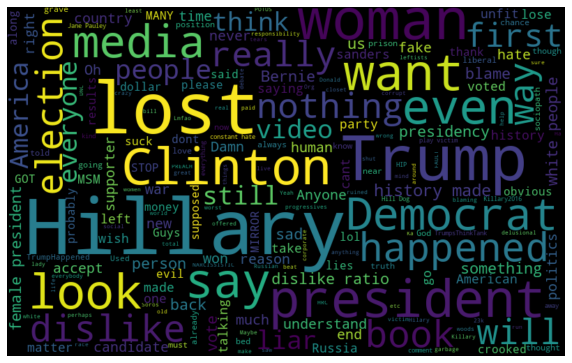

In [227]:
# words used in this anomaly1 video
all_words = ' '.join([text for text in anomaly1_comments['comment_text']])
from wordcloud import WordCloud
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)

plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

After analysing the statistics of this video in detail, it can be seen that this video is about the politics in US. It can be a prime example of a video that is not well received. However, we chose to exclude this video in our classification as we considered this video as an anomaly. The popularity2 value is pretty extreme and might skew our data. That being said, if this project was about finding out which features were important in classifying videos that are not well received, this video might be important in the classification.

#### 5b) Univariate Anomaly Detection

We decided to ultimately remove 1 anomaly via box-plot visualisation as explained above. However, observation might not be the best justification for anomalies. Thus, to be more sure that the point we removed is indeed an anomaly, one improvement that could have been done was to use univarite anomaly detection method shown below.

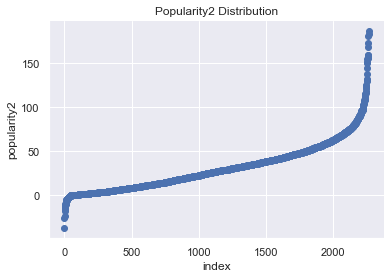

In [228]:
plt.scatter(range(USvideos.shape[0]), np.sort(USvideos['popularity2'].values))
plt.xlabel('index')
plt.ylabel('popularity2')
plt.title("Popularity2 Distribution")
sb.despine()

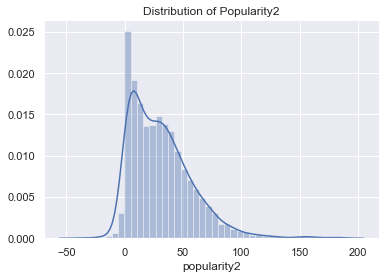

In [229]:
sb.distplot(USvideos['popularity2'])
plt.title("Distribution of Popularity2")
sb.despine()

C:\Users\User\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:237: FutureWarning:

default contamination parameter 0.1 will change in version 0.22 to "auto". This will change the predict method behavior.

C:\Users\User\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:247: FutureWarning:

behaviour="old" is deprecated and will be removed in version 0.22. Please use behaviour="new", which makes the decision_function change to match other anomaly detection algorithm API.

C:\Users\User\Anaconda3\lib\site-packages\sklearn\ensemble\iforest.py:415: DeprecationWarning:

threshold_ attribute is deprecated in 0.20 and will be removed in 0.22.



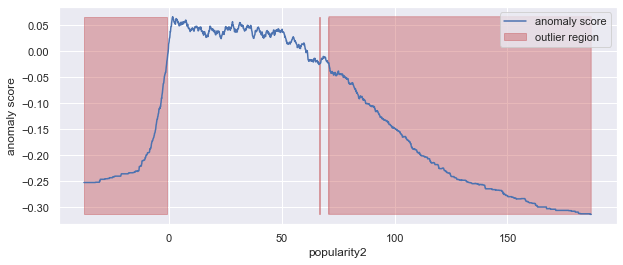

In [230]:
#Using IsolationForest
from sklearn.ensemble import IsolationForest
isolation_forest = IsolationForest(n_estimators=100)
isolation_forest.fit(USvideos['popularity2'].values.reshape(-1, 1))
xx = np.linspace(USvideos['popularity2'].min(), USvideos['popularity2'].max(), len(USvideos)).reshape(-1,1)
anomaly_score = isolation_forest.decision_function(xx)
outlier = isolation_forest.predict(xx)
plt.figure(figsize=(10,4))
plt.plot(xx, anomaly_score, label='anomaly score')
plt.fill_between(xx.T[0], np.min(anomaly_score), np.max(anomaly_score), 
                 where=outlier==-1, color='r', 
                 alpha=.4, label='outlier region')
plt.legend()
plt.ylabel('anomaly score')
plt.xlabel('popularity2')
plt.show();

#### 5c) Multivariate Anomaly Detection

Another method is to set up a Multi-Variate Anomaly Detection problem on the USvideos Dataset.   
Features : **views, likes, dislikes, comment_total, sentiment_scores, trending days, positive percentage, negative percentage**  

In [257]:
USvideos.head()

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,...,popularity2_rank,quantile_popularity,pos_score,neg_score,neu_score,sentiment_scores,number_comments,average_sentiment,Positive Percentage,Negative Percentage
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09,...,554.0,very low,58.697,18.655,318.649,50.9482,400,0.127370,33.25,10.75
1,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09,...,749.0,very low,23.841,4.617,71.544,26.0999,100,0.260999,49.00,10.00
2,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10,...,1226.0,very low,105.833,113.469,580.708,-27.6414,800,-0.034552,34.25,37.12
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09,...,1456.0,low,85.366,30.077,579.556,58.9172,700,0.084167,25.57,14.43
4,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10,...,1285.0,very low,73.377,49.788,373.842,35.1505,500,0.070301,36.20,24.40


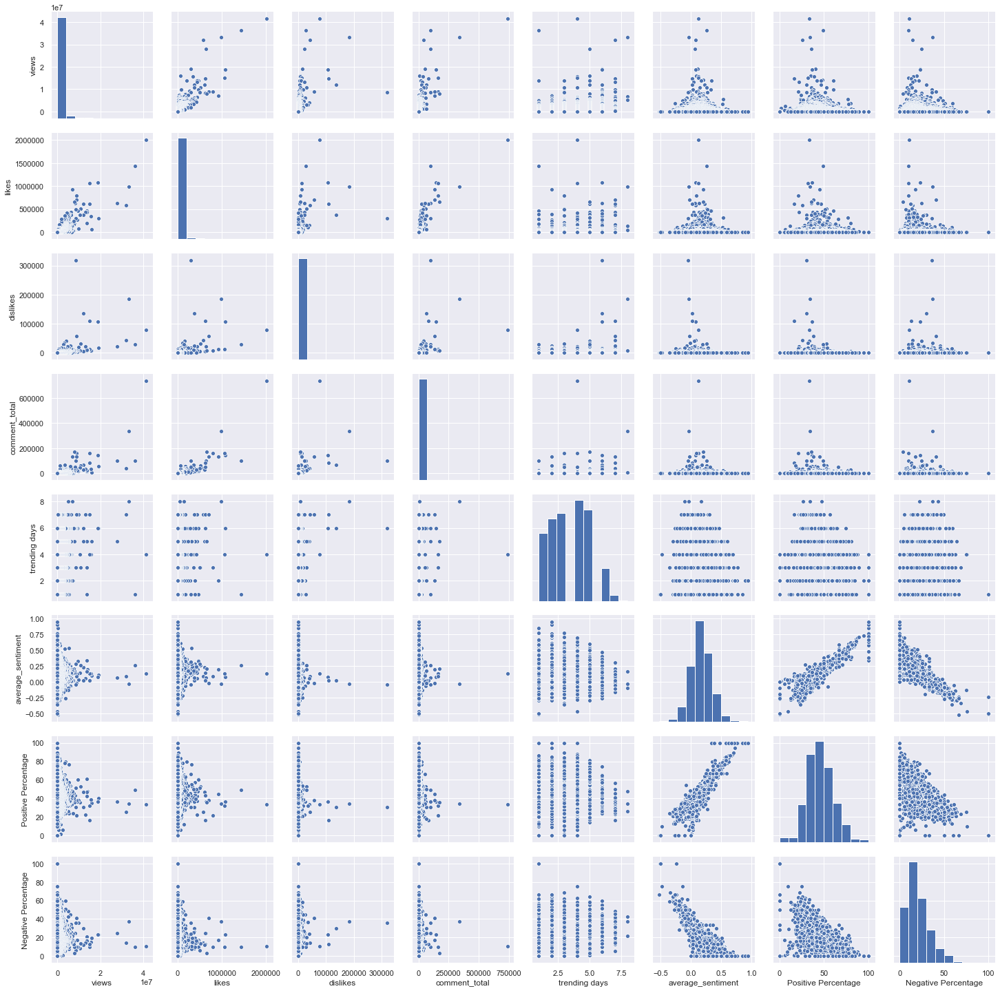

In [258]:
# Extract the Features from the Data
X = pd.DataFrame(USvideos[["views", "likes", "dislikes", "comment_total", "trending days", "average_sentiment", "Positive Percentage", "Negative Percentage"]]) 

# Plot the Raw Data on 2D grids
sb.pairplot(X)

In [259]:
# Import LocalOutlierFactor from sklearn.neighbors
from sklearn.neighbors import LocalOutlierFactor

# Set the Parameters for Neighborhood
num_neighbors = 20      # Number of Neighbors
cont_fraction = 0.05    # Fraction of Anomalies

# Create Anomaly Detection Model using LocalOutlierFactor
lof = LocalOutlierFactor(n_neighbors = num_neighbors, contamination = cont_fraction)

# Fit the Model on the Data and Predict Anomalies
lof.fit(X)

LocalOutlierFactor(algorithm='auto', contamination=0.05, leaf_size=30,
                   metric='minkowski', metric_params=None, n_jobs=None,
                   n_neighbors=20, novelty=False, p=2)

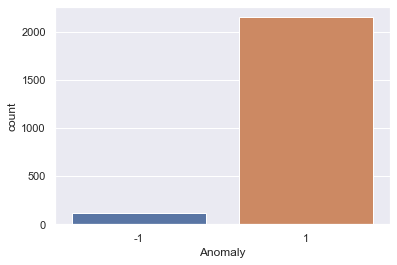

In [260]:
# Predict the Anomalies
labels = lof.fit_predict(X)

# Append Labels to the Data
X_labeled = X.copy()
X_labeled["Anomaly"] = pd.Categorical(labels)

# Summary of the Anomaly Labels
sb.countplot(X_labeled["Anomaly"])

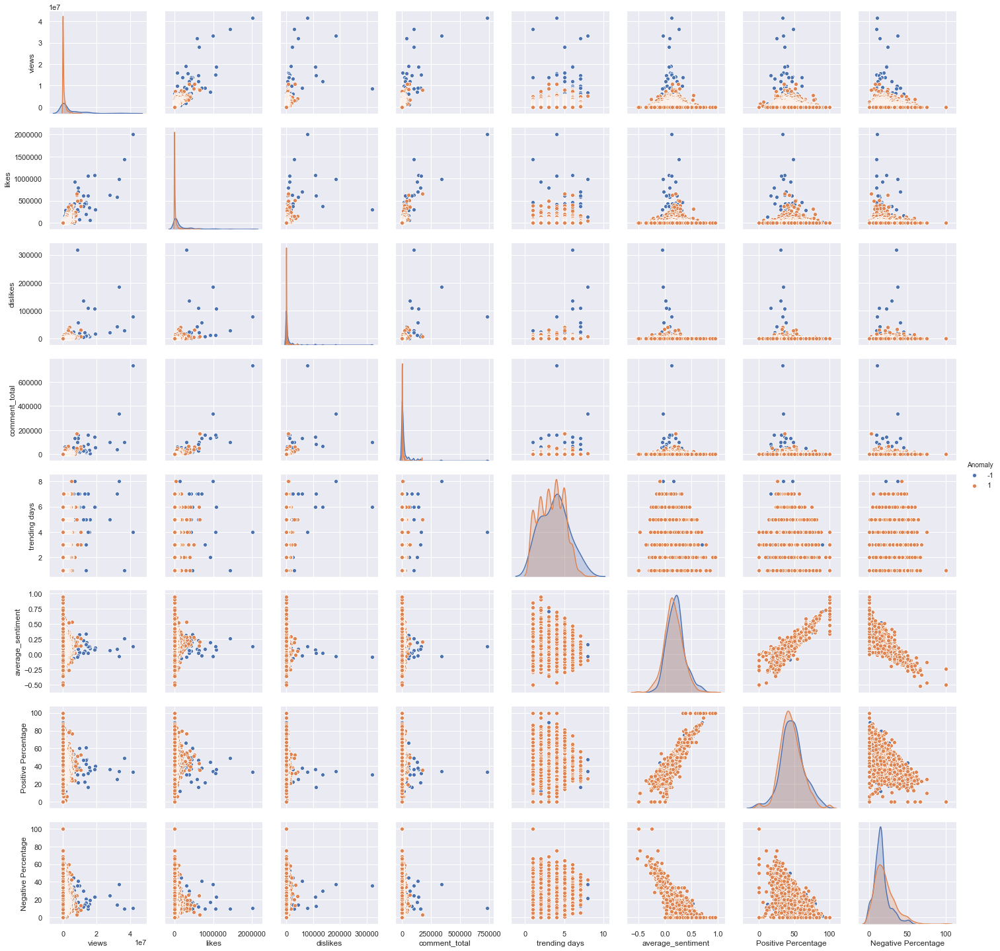

In [261]:
# Visualize the Anomalies in the Data
sb.pairplot(X_labeled, vars = X.columns.values, hue = "Anomaly")

The same could be applied to GBvideos.

### 6. Number of Views

It might seem that high views would mean high popularity. However, as can be seen, the univariate classification accuracy for views is only around 63%. This shows that views alone is not a good indicator of popularity. A few other factors come together to determine popularity.

In [262]:
x0 = USvideos['views']
x1 = GBvideos['views']

fig = go.Figure()
fig.add_trace(go.Histogram(x=x0 , name = "USvideos"))
fig.add_trace(go.Histogram(x=x1, name = "GBvideos"))
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

The classification accuracy for both USvideos and GBvideos are similar, at 0.64. This shows that views as a features performs equally in both datasets.

However, 'views' as a feature alone is not strong enough as the classification accuracy of 0.64 is pretty low. This reinforces high views does not mean high popularity.

### 7. Number of Likes and Dislikes

In [263]:
x0 = USvideos['likes']
x1 = GBvideos['likes']

fig = go.Figure()
fig.add_trace(go.Histogram(x=x0 , name = "USvideos"))
fig.add_trace(go.Histogram(x=x1, name = "GBvideos"))
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

Taking note that there are fewer GBvideos and that the number of likes GBvideos get are moderately higher, this might play a part in the importance of the feature 'likes'. As derived above, the classification accuracy for the feature 'likes' for USvideos is around 0.752 and that of GBvideos is 0.676. 

This might be because the number of likes is moderately high for a fewer number of videos and hence 'likes' as a feature is not as significant for GBvideos. Hence, the lower accuracy.

In [264]:
x0 = USvideos['dislikes']
x1 = GBvideos['dislikes']

fig = go.Figure()
fig.add_trace(go.Histogram(x=x0 , name = "USvideos"))
fig.add_trace(go.Histogram(x=x1, name = "GBvideos"))
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

However, 'dislikes' as a feature, on the other hand, is pretty similar across both datasets. Classification accuracy for USvideos is 0.646 and that if GBvideos is 0.630.

### 8. Trending Days

In [276]:
x0 = USvideos['trending days']
x1 = GBvideos['trending days']

fig = go.Figure()
fig.add_trace(go.Histogram(x=x0 , name = "USvideos"))
fig.add_trace(go.Histogram(x=x1, name = "GBvideos"))
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

There are some videos that were trending for a few days. To improve on the classification, we could have performed a more indepth analysis of why these videos were trending for so long.

That being said, 'trending days' as a feature is not a strong feature as well. Classification accuracy is at 0.552 for USvideos and 0.619 for GBvideos. This might be because the youtube trending algorithm is different and based on different aspects of the video, hence the number of trending days is reliant on the popularity of the video, and not the other way round. 

### 9. Number of Comments

In [301]:
x0 = USvideos['comment_total']
x1 = GBvideos['comment_total']

fig = go.Figure()
fig.add_trace(go.Histogram(x=x0 , name = "USvideos"))
fig.add_trace(go.Histogram(x=x1, name = "GBvideos"))
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

Classification accuracy for USvideos is 0.684 and that for GBvideos is 0.635. Many factors might contribute to the difference in accuracies. One might be the higher number of data in USvideos and this allows the dataset to be better trained.

### 10. Average Sentiment Score
##### 10a) Translation
TextBlob analyses other language comments but it is a paid service. It only analyses up to 500 words per day. Hence, we could not implement text translation into our project. However, if possible, the codes below can be added in for translation, so that our dataset can be more robust in terms of the sentimental analysis feature.

In [302]:
#take a look at how textblob translate languages

from textblob import TextBlob

blob = TextBlob("Ä°lk baÅŸta gÃ¶sterilen yerde tÃ¼rkÃ§e olarak bÃ¼yÃ¼k karakterlerle kongre merkezi yazÄ±lmÄ±ÅŸ olmasÄ± da ilginÃ§.")

In [303]:
blob.detect_language()

'tr'

In [304]:
blob.translate(to= 'en')

TextBlob("It is also interesting that the congress center was written with great characters in the place shown in the first place.")

In [305]:
#make a function that can translate non-english comments to english

def translate_comment(text):
    blob = TextBlob(text)
    if blob.detect_language() == 'en':
        return text
    else: 
        return blob.translate(to= 'en')

In [306]:
#try out the function

translate_comment("Ä°lk baÅŸta gÃ¶sterilen yerde tÃ¼rkÃ§e olarak bÃ¼yÃ¼k karakterlerle kongre merkezi yazÄ±lmÄ±ÅŸ olmasÄ± da ilginÃ§.")

TextBlob("It is also interesting that the congress center was written with great characters in the place shown in the first place.")

In [307]:
# #apply to the whole dataset

# UScomments[‘processed text’] = US[‘processed text’].apply(lambda x: translate_comment(x))

However, as mentioned earlier, this code cannot be run on our dataset.

In [321]:
# check if sentiment analyser works on foreign languages
analyser = SentimentIntensityAnalyzer()
def sentiment_analyzer_scores(sentence):
    score = analyser.polarity_scores(sentence)
    print("{:-<40} {}".format(sentence, str(score)))
print(sentiment_analyzer_scores('Ä°lk baÅŸta gÃ¶sterilen yerde tÃ¼rkÃ§e olarak bÃ¼yÃ¼k karakterlerle kongre merkezi yazÄ±lmÄ±ÅŸ olmasÄ± da ilginÃ§.'))

Ä°lk baÅŸta gÃ¶sterilen yerde tÃ¼rkÃ§e olarak bÃ¼yÃ¼k karakterlerle kongre merkezi yazÄ±lmÄ±ÅŸ olmasÄ± da ilginÃ§. {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0}
None


In [323]:
# check with the english translation
print(sentiment_analyzer_scores("It is also interesting that the congress center was written with great characters in the place shown in the first place."))

It is also interesting that the congress center was written with great characters in the place shown in the first place. {'neg': 0.0, 'neu': 0.736, 'pos': 0.264, 'compound': 0.7783}
None


It is shown that setimental analysis do not work with foreign languages and hence those comments with foreign languages will have a sentiment score of 0. Thus, we have included 2 features, namely Percentage of Positive Comments and Percentage of Negative Comments to help us make our model more robust.

##### 10b) Spelling Check

We attempted to load spell check using text blob. However, dataset is too huge and alot of time will be taken. Hence, we could not carry out spelling check on our dataset. 

In [308]:
# spelling check by first removing letters that are repeated >2 times consecutively
# english words have a max of 2 letters that are repeeated one after another

def reduce_lengthening(text):
    pattern = re.compile(r"(.)\1{2,}")
    return pattern.sub(r"\1\1", text)

#example
sentence = "she is amazzzinggg"
updated = reduce_lengthening(sentence)
print(updated)

she is amazzingg


In [309]:
UScomments['processed text'] = UScomments['processed text'].apply(lambda x: reduce_lengthening(str(x)))
UScomments

,video_id,comment_text,likes,replies,processed text,pos_score,neg_score,neu_score,sentiment_scores,Sentiment
0,XpVt6Z1Gjjo,Logan Paul it's yo big day ‼️‼️‼️,4,0,Logan Paul it's yo big day double exclamation ...,0.000,0.000,1.000,0.0000,Neutral
1,XpVt6Z1Gjjo,I've been following you from the start of your...,3,0,I've been following you from the start of your...,0.000,0.000,1.000,0.0000,Neutral
2,XpVt6Z1Gjjo,Say hi to Kong and maverick for me,3,0,Say hi to Kong and maverick for me,0.000,0.000,1.000,0.0000,Neutral
3,XpVt6Z1Gjjo,MY FAN . attendance,3,0,MY FAN . attendance,0.603,0.000,0.397,0.4648,Positive
4,XpVt6Z1Gjjo,trending 😉,3,0,trending winking face,0.000,0.000,1.000,0.0000,Neutral
...,...,...,...,...,...,...,...,...,...,...
691395,EoejGgUNmVU,Лучшая,1,0,Лучшая,0.000,0.000,1.000,0.0000,Neutral
691396,EoejGgUNmVU,qu'est ce que j'aimerais que tu viennes à Roan...,0,0,qu'est ce que j'aimerais que tu viennes à Roan...,0.000,0.000,1.000,0.0000,Neutral
691397,EoejGgUNmVU,Ven a mexico! 😍 te amo LP,0,0,Ven a mexico! smiling face with heart-eyes te ...,0.000,0.000,1.000,0.0000,Neutral
691398,EoejGgUNmVU,Islığı yeter...,0,0,Islığı yeter..,0.000,0.000,1.000,0.0000,Neutral


In [310]:
# use TextBlob to do spelling correction
from textblob import TextBlob

#example
print(str(TextBlob(updated).correct()))

she is amazing


In [311]:
#carry out spelling correction for first 5 rows
#can be seen that it is not very accurate
#slangs are not corrected correctly
UScomments['comment_text'][:5].apply(lambda x: str(TextBlob(x).correct()))

0                    Began Paul it's to big day ‼️‼️‼️
1    I've been following you from the start of your...
2                   May hi to Long and maverick for me
3                                  of FAN . attendance
4                                           treading 😉
Name: comment_text, dtype: object

In [ ]:
# #do for whole dataset

# UScomments['spell checked text'] = UScomments['comment_text'].apply(lambda x: str(TextBlob(x).correct()))
# UScomments

However, that being said, after conducting spelling check for the first 5 rows for exploration, it can be seen that spelling check by TextBlob is not very accurate. Hence, spell check might not be of high significance to the classification.

#### 10c) Reason for not cleaning text data

We handpicked Vader Sentiment because it is a lexicon and rule-based sentiment analysis tool that is specifically attuned to sentiments expressed in social media. We realised that Vader is a relatively sensitive tool that takes into account several characteristics of a text, therefore we decided not to proceed on with the text data cleaning.

##### i) Uppercase letters
Using upper case letters to emphasize a sentiment-relevant word in the presence of other non-capitalized words, increases the magnitude of the sentiment intensity

In [ ]:
# #Changing the text to lower case
# UScomments['comment_text'] = UScomments['comment_text'].apply(lambda x:x.lower())

##### ii) Conjunctions
Use of conjunctions like “but” signals a shift in sentiment polarity, with the sentiment of the text following the conjunction being dominant. “The food here is great, but the service is horrible” has mixed sentiment, with the latter half dictating the overall rating. (Decided not to lemmatize or remove stopwords)

In [ ]:
# #Lemmatization
# from nltk.stem import WordNetLemmatizer
# from nltk.corpus import stopwords

# wnl = WordNetLemmatizer()

# tokenized_UScomments.apply(lambda x: [wnl.lemmatize(i) for i in x if i not in set(stopwords.words('english'))]) 
# tokenized_UScomments.head()


##### iii) Punctuation, Special Characters, Numbers

We found out that these symbols are usually part of emoticons that is an essential feature of determining the sentiment of the comment. Emoticons are used extensively in social media texts (in this case 'youtube comments')


In [ ]:
# #Removing Punctuations, Numbers and Special Characters

# UScomments['comment_text'] = UScomments['comment_text'].str.replace("[^a-zA-Z#]", " ")

Other challenges faced conducting sentiment analysis
- Context and polarity
- Irony and sarcasm
- Comparison
- Defining what is neutral


#### 10d) Use of Tags

We have found out that tags do not contribute much to the classification, as they have a very low correlation, as seen from the very low R-Squared value. Hence we are excluding tags.

In [312]:
#Statistical imports
import statsmodels.api as sm
from sklearn.preprocessing import MultiLabelBinarizer
from pprint import pprint
#Returns a sorted histogram dataframe (with top_n rows) for a given list.
def form_hist(given_list,top_n):

    item_set = set(given_list)
    items = []
    counts = []
    for nm in item_set:
        items.append(nm)
        counts.append(given_list.count(nm))
    return pd.DataFrame({'count':counts,'items':items}).sort_values(by='count',ascending=False).head(top_n)

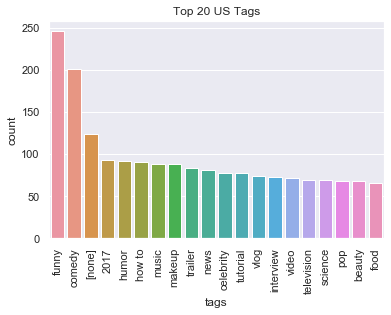

In [313]:
def top20_UStags(videos, num, title):

    all_tags = videos['tags'].map(lambda k: k.lower().split('|')).values
    all_tags = [item for sublist in all_tags for item in sublist]

    counts = form_hist(all_tags,num)
    counts.columns = ['count','tags']
    plt.figure()
    sb.barplot(x = counts['tags'], y = counts['count'])
    plt.xticks(rotation=90)
    plt.ylabel('count')
    plt.title(title)

top20_UStags(USvideos,20,'Top 20 US Tags')

In [314]:
def tags_as_feature(videos, k):
    #Determine the top k tags
    videos = videos.copy()
    all_tags = videos['tags'].map(lambda k: k.lower().split('|'))
    all_tags = [item for sublist in all_tags for item in sublist]
    counts = form_hist(all_tags,k)
    top_tags = counts['items'].values[:k]

    def filter_f(x):
        x = x.lower().split('|')
        return [e for e in x if e in top_tags]

    #Reduce tags to only the most frequent ones
    videos['tags'] = videos['tags'].map(filter_f)

    #Convert our data into the design matrix
    mlb = MultiLabelBinarizer()
    design = mlb.fit_transform(videos['tags'])
    design = sm.add_constant(design)


    #Fit linear regression
    ols = sm.OLS(videos['views'].values, design)
    fitting = ols.fit()
    labels = ['intercept'] + list(mlb.classes_)
    return fitting.summary(), labels

top_n_tags = 20

USsummary, uslabels = tags_as_feature(USvideos, top_n_tags)
print("US VIDEOS")
pprint(USsummary)

US VIDEOS
<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     2.411
Date:                Wed, 15 Apr 2020   Prob (F-statistic):           0.000439
Time:                        02:23:45   Log-Likelihood:                -36336.
No. Observations:                2264   AIC:                         7.271e+04
Df Residuals:                    2243   BIC:                         7.283e+04
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------

#### 10e) Vader (Rule-Based) vs other Machine Learning-Automatic Approach like Naive Bayes, SVM etc
Advantage of Vader: 
- Doesn’t require any training data but is constructed from a generalizable, valence-based, human-curated gold standard sentiment lexicon
- works exceedingly well on social media type text, yet readily generalizes to multiple domains
- fast enough to be used online with streaming data

Disadvantage of ML:
- depend on the training set to represent as many features as possible (which often, they do not – especially in the case of the short, sparse text of social media)


### 11. Positive Percentage and Negative Perentage

In [317]:
x0 = USvideos['Positive Percentage']
x1 = GBvideos['Positive Percentage']

fig = go.Figure()
fig.add_trace(go.Histogram(x=x0 , name = "USvideos"))
fig.add_trace(go.Histogram(x=x1, name = "GBvideos"))
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

Classification accuracy is around 0.64 for USvideos and 0.72 for GBvideos. It is also noted that the classification accuracy for percentage of positive comments vary a lot between US and GB (65% vs 72%), but similar for percentage of negative comments (both 70%). This might be because words of negative sentiment might be more unique hence they might perform better with sentiment analysis.


In [318]:
x0 = USvideos['Negative Percentage']
x1 = GBvideos['Negative Percentage']

fig = go.Figure()
fig.add_trace(go.Histogram(x=x0 , name = "USvideos"))
fig.add_trace(go.Histogram(x=x1, name = "GBvideos"))
# Overlay both histograms
fig.update_layout(barmode='overlay')
# Reduce opacity to see both histograms
fig.update_traces(opacity=0.75)
fig.show()

Classification accuracy is similar at around 0.70.

### 12. Category ID
#### 12a) Visualisation

In [270]:
# show the categories of videos that are present in dataset
USvideos.category_id.value_counts()

24    458
10    328
26    260
22    245
23    211
25    174
28    144
17    139
1      97
27     89
15     37
2      35
20     27
19     17
29      2
43      1
Name: category_id, dtype: int64

In [271]:
len(USvideos.category_id.unique())

16

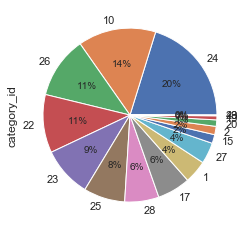

In [272]:
USvideos.category_id.value_counts().plot(kind='pie', autopct='%1.0f%%')

In [273]:
#import the old category id list
print("Category ID List used for this dataset:")
OCI = pd.read_csv('old_category_id.csv')
OCI

Category ID List used for this dataset:


,Category ID,Category Name
0,1,Film & Animation
1,2,Autos & Vehicles
2,10,Music
3,15,Pets & Animals
4,17,Sports
5,18,Short Movies
6,19,Travel & Events
7,20,Gaming
8,21,Videoblogging
9,22,People & Blogs


From the above category list, it can be seen that Category ID 24 which corresponds to **Entertainment** has the highest count. This might seem expected as people usually watch entertainment videos on YouTube, hence contributing to the high value count. 

However, on further inspection, it is also good to take note that Entertainment is actually a general category for all the other sub-categories like comedy, shows, music. Hence, video creators might have just chosen Entertainment as it is a broader cateogory. 

Thus, deriving Entertainment as the category of highest count might not be very useful in classification. It might be better if we are getting the genres (eg horror, comedy, sports) instead.

In the recent years, YouTube has also developed a new Cateogry ID List, hence this classification for Category ID might not be applicable for current videos. The new list can be seen below.

In [274]:
#import the updated category id list
print("Updated Category ID List used currently by YouTube (which this dataset does not use):")
UCI = pd.read_csv('updated_category_id.csv')
UCI

Updated Category ID List used currently by YouTube (which this dataset does not use):


,ID,Category name,Category detail
0,1,Film & Animation,"Film category includes new film trailers, vide..."
1,2,Autos & Vehicles,Autos & Vehicles category includes video relat...
2,10,Music,Music category seems not required any instruct...
3,15,Pets & Animals,Pets and Animals category includes funny and a...
4,17,Sports,Sports category includes videos for sports and...
5,19,Travel & Events,Travel & Events category includes videos for t...
6,20,Gaming,"Gaming category includes videos for games, gam..."
7,22,People & Blogs,"Category includes videos for people, life styl..."
8,23,Comedy,Comedy category includes comedy videos in diff...
9,24,Entertainment,Entertainment category have videos for enterta...


We attempted to use **one hot encoding** for the classification of Category IDs to ensure that the data is normalised.

#### 12b) One Hot Encoding

In [269]:
# importing one hot encoder 
from sklearn.preprocessing import OneHotEncoder
# creating one hot encoder object 
onehotencoder = OneHotEncoder()
#reshape the 1-D country array to 2-D as fit_transform expects 2-D and finally fit the object 
X = onehotencoder.fit_transform(USvideos.category_id.values.reshape(-1,1)).toarray()
#To add this back into the original dataframe 
dfOneHot = pd.DataFrame(X, columns = ["category_id_"+str(int(i)) for i in range(0,16)]) 
USvideos = pd.concat([USvideos, dfOneHot], axis=1)
#printing to verify 
USvideos.head()

C:\Users\User\Anaconda3\lib\site-packages\sklearn\preprocessing\_encoders.py:415: FutureWarning:

The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.



,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,date,...,category_id_6,category_id_7,category_id_8,category_id_9,category_id_10,category_id_11,category_id_12,category_id_13,category_id_14,category_id_15
0,MBdVXkSdhwU,BTS (방탄소년단) 'DNA' Official MV,ibighit,10,BIGHIT|빅히트|방탄소년단|BTS|BANGTAN|방탄,41500672,2010366,78076,736179,22.09,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,tt2k8PGm-TI,ZAYN - Dusk Till Dawn ft. Sia,ZaynVEVO,10,Dusk Till Dawn|Pop|RCA Records Label|ZAYN feat...,36323498,1431683,28049,100661,13.09,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,LunHybOKIjU,Eminem Rips Donald Trump In BET Hip Hop Awards...,BETNetworks,24,BET|BET Networks|BET Music|Black Entertainment...,33191594,982842,184310,337603,18.10,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,SHq2qrFUlGY,Shakira - Perro Fiel (Official Video) ft. Nick...,shakiraVEVO,10,Shakira ft. Nicky Jam|Shakira ft. Nicky Jam Mu...,32136948,578266,43475,40071,22.09,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,Q0CbN8sfihY,Star Wars: The Last Jedi Trailer (Official),Star Wars,24,star wars|the last jedi|trailer|official trail...,27909589,631087,22177,101673,14.10,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


However, we realised that although one hot encoding is a decent tool to normalise categorised variables, categorised variables itself is not a good feature of Decision Tree classifications. By one-hot encoding a categorical variable, we are inducing sparsity into the dataset and that is undesirable.

During the splitting algorithm, the answer will be a yes or no (ie binary). Thus, the tree will only grow in one direction. One hot encoding categorical variables with high cardinality can cause inefficiency in tree-based classifications. 

Continuous variables will be given more importance than the categorical variables by the algorithm. Categorical variables will obscure the order of feature importance resulting in poorer performance.

### 13. Choice of Model

When deciding on the most suitable ML Model for our project, we considered Logistic Regression as well as Support Vector Machine (SVM). However, both are intended for binary (two-class) classification problems, which does not fit our 4 quantile model.

# Conclusion

Overall, it is to be acknowledged that the dataset itself has **limitations**. Some of the features are somehow correlated with each other. Higher trending days count might be due to having high number of views and likes etc. Hence, we attempted to normalise the dataset by choosing the most appropriate response indicator (ie (likes-dislikes)/views)

Other improvements that could have been done for this project could have been to include the analysis of likes and replies for each comment. If this project could be brought further, it could help in the recommendation of YouTube videos to users in different countries.

Ranking of Features for **USvideos**:
    1. Number of Likes
    2. Percentage of Negative Comments over Total Number of Comments
    3. Average Sentiment
    4. Total Number of Comments
    5. Percentage of Positive Comments over Total Number of Comments
    6. Number of Dislikes
    7. Number of Views
    8. Trending Days
    

Ranking of Features for **GBvideos**:
    1. Percentage of Positive Comments over Total Number of Comments
    2. Average Sentiment
    3. Percentage of Negative Comments over Total Number of Comments
    4. Number of Likes
    5. Number of views
    6. Total Number of Comments
    7. Number of Dislikes
    8. Trending Days
    

The ranking above shows that the features might be of different importance in different countries. This might be due to the cultural factors. For example, the way people type the comments - the tone, emojis and slangs might play a part in sentimental analysis.

If possible, a different recommendation system can be used for US and GB as the types of videos that Americans prefer watching might be different from those that British prefer to watch, or the range of videos or genres that the people watch are different. 

Multi-variate Decision Tree is better than the single decision tree as it combines all the features, hence all features can be used at different levels of the tree to give a high classification accuracy.

Random forest is able to generalize much better to the testing data than the single decision tree or the multi-variate decision tree. The random forest has lower variance while maintaining the low bias of a decision tree. This is because the random forest is essentially a collection of decision trees.

A decision tree is built on an entire dataset, using all the features as mentioned earlier whereas a random forest randomly selects specific features to build multiple decision trees from and then averages the results.

Thus, we can conclude that the random forest will give the highest classification accuracy and that the 8 features listed above will serve to provide better predications in classifications. From the rankings above, it can be seen that average sentiment is a pretty good feature in classsifcation.

# Datasets
- https://www.kaggle.com/datasnaek/youtube#GBcomments.csv
- https://www.kaggle.com/datasnaek/youtube-new#GBvideos.csv 

# References

- https://techpostplus.com/2019/04/26/youtube-video-categories-list-faqs-and-solutions/
- https://gist.github.com/dgp/1b24bf2961521bd75d6c
- https://www.kaggle.com/minc33/k-means-clustering-vs-logistic-regression
- https://towardsdatascience.com/k-means-clustering-algorithm-applications-evaluation-methods-and-drawbacks-aa03e644b48a
- https://towardsdatascience.com/k-means-clustering-8e1e64c1561c
- https://towardsdatascience.com/unsupervised-learning-clustering-algorithms-5b290967f746
- https://data-flair.training/blogs/k-means-clustering-tutorial/
- https://www.analyticsvidhya.com/blog/2016/11/an-introduction-to-clustering-and-different-methods-of-clustering/
- https://www.analyticsvidhya.com/blog/2019/08/comprehensive-guide-k-means-clustering/
- https://medium.com/towards-artificial-intelligence/emoticon-and-emoji-in-text-mining-7392c49f596a
- http://datameetsmedia.com/staging/3908/vader-sentiment-analysis-explained/
- https://www.analyticsvidhya.com/blog/2018/02/natural-language-processing-for-beginners-using-textblob/
- https://textblob.readthedocs.io/en/dev/quickstart.html#translation-and-language-detection
- https://stackabuse.com/python-for-nlp-introduction-to-the-textblob-library/
